In [1]:
!huggingface-cli login


    _|    _|  _|    _|    _|_|_|    _|_|_|  _|_|_|  _|      _|    _|_|_|      _|_|_|_|    _|_|      _|_|_|  _|_|_|_|
    _|    _|  _|    _|  _|        _|          _|    _|_|    _|  _|            _|        _|    _|  _|        _|
    _|_|_|_|  _|    _|  _|  _|_|  _|  _|_|    _|    _|  _|  _|  _|  _|_|      _|_|_|    _|_|_|_|  _|        _|_|_|
    _|    _|  _|    _|  _|    _|  _|    _|    _|    _|    _|_|  _|    _|      _|        _|    _|  _|        _|
    _|    _|    _|_|      _|_|_|    _|_|_|  _|_|_|  _|      _|    _|_|_|      _|        _|    _|    _|_|_|  _|_|_|_|

    To log in, `huggingface_hub` requires a token generated from https://huggingface.co/settings/tokens .
Enter your token (input will not be visible): 
Add token as git credential? (Y/n) y
Token is valid (permission: write).
The token `sol_the_conclusion` has been saved to /root/.cache/huggingface/stored_tokens
Cannot authenticate through git-credential as no helper is defined on your machine.
You might have to re-authenti

In [2]:
import torch
from transformers import AutoTokenizer, AutoModelForCausalLM
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
first_order_data_correct = {
    "type": "first_order_logic",
    "axiom": "bidirectional_dilemma",
    "data_samples": [
        {
            "context": "If someone drinks lots of water, then they will feel hydrated. If they eat too much sugar, then they will experience a sugar crash. We know that at least one of the following is true (1) Jane drinks lots of water and (2) she won't experience a sugar crash. Note that we do not know which ones of (1) and (2) are true. It might be the case that only (1) is true, or only (2) is true or both are true.",
            "qa_pairs": [
                {
                    "question": "If at least one of (1) and (2) is true, can we say, at least one of the following must always be true? (a) she will feel hydrated and (b) she doesn't eat too much sugar",
                    "answer": True
                },
                {
                    "question": "If at least one of (1) and (2) is true, can we say, at least one of the following must always be true? (a) she won't feel hydrated and (b) she eats too much sugar",
                    "answer": False
                },
                {
                    "question": "If at least one of (1) and (2) is true, can we say, at least one of the following must always be true? (a) she will feel hydrated and (b) she eats too much sugar",
                    "answer": False
                },
                {
                    "question": "If at least one of (1) and (2) is true, can we say, at least one of the following must always be true? (a) she won't feel hydrated and (b) she doesn't eat too much sugar",
                    "answer": False
                }
            ]
        },
        {
            "context": "If someone goes for a run, then they will feel healthier. If they stay up late, then they will be tired. We know that at least one of the following is true (1) Jack goes for a run and (2) he won't be tired. Note that we do not know which ones of (1) and (2) are true. It might be the case that only (1) is true, or only (2) is true or both are true.",
            "qa_pairs": [
                {
                    "question": "If at least one of (1) and (2) is true, can we say, at least one of the following must always be true? (a) he will feel healthier and (b) he doesn't stay up late",
                    "answer": True
                },
                {
                    "question": "If at least one of (1) and (2) is true, can we say, at least one of the following must always be true? (a) he won't feel healthier and (b) he stays up late",
                    "answer": False
                },
                {
                    "question": "If at least one of (1) and (2) is true, can we say, at least one of the following must always be true? (a) he will feel healthier and (b) he stays up late",
                    "answer": False
                },
                {
                    "question": "If at least one of (1) and (2) is true, can we say, at least one of the following must always be true? (a) he won't feel healthier and (b) he doesn't stay up late",
                    "answer": False
                }
            ]
        },
        {
            "context": "If someone reads a book, then they will gain knowledge. If they watch television, then they will be entertained. We know that at least one of the following is true (1) Alice reads a book. and (2) he won't be entertained. Note that we do not know which ones of (1) and (2) are true. It might be the case that only (1) is true, or only (2) is true or both are true.",
            "qa_pairs": [
                {
                    "question": "If at least one of (1) and (2) is true, can we say, at least one of the following must always be true? (a) She will gain knowledge. and (b) he doesn't watch television.",
                    "answer": True
                },
                {
                    "question": "If at least one of (1) and (2) is true, can we say, at least one of the following must always be true? (a) she won't gain knowledge. and (b) He watches television.",
                    "answer": False
                },
                {
                    "question": "If at least one of (1) and (2) is true, can we say, at least one of the following must always be true? (a) She will gain knowledge. and (b) He watches television.",
                    "answer": False
                },
                {
                    "question": "If at least one of (1) and (2) is true, can we say, at least one of the following must always be true? (a) she won't gain knowledge. and (b) he doesn't watch television.",
                    "answer": False
                }
            ]
        },
        {
            "context": "If someone drives recklessly, then they will get a ticket. If they drive carefully, then they will reach their destination safely. We know that at least one of the following is true (1) John drives recklessly and (2) he won't reach his destination safely. Note that we do not know which ones of (1) and (2) are true. It might be the case that only (1) is true, or only (2) is true or both are true.",
            "qa_pairs": [
                {
                    "question": "If at least one of (1) and (2) is true, can we say, at least one of the following must always be true? (a) he will get a ticket and (b) he doesn't drive carefully",
                    "answer": True
                },
                {
                    "question": "If at least one of (1) and (2) is true, can we say, at least one of the following must always be true? (a) he won't get a ticket and (b) he drives carefully",
                    "answer": False
                },
                {
                    "question": "If at least one of (1) and (2) is true, can we say, at least one of the following must always be true? (a) he will get a ticket and (b) he drives carefully",
                    "answer": False
                },
                {
                    "question": "If at least one of (1) and (2) is true, can we say, at least one of the following must always be true? (a) he won't get a ticket and (b) he doesn't drive carefully",
                    "answer": False
                }
            ]
        },
        {
            "context": "If someone goes to the gym, then they will be fit. If they eat unhealthy food, then they will be unhealthy. We know that at least one of the following is true (1) John goes to the gym and (2) he won't be unhealthy. Note that we do not know which ones of (1) and (2) are true. It might be the case that only (1) is true, or only (2) is true or both are true.",
            "qa_pairs": [
                {
                    "question": "If at least one of (1) and (2) is true, can we say, at least one of the following must always be true? (a) he will be fit and (b) he doesn't eat unhealthy food",
                    "answer": True
                },
                {
                    "question": "If at least one of (1) and (2) is true, can we say, at least one of the following must always be true? (a) he won't be fit and (b) he eats unhealthy food",
                    "answer": False
                },
                {
                    "question": "If at least one of (1) and (2) is true, can we say, at least one of the following must always be true? (a) he will be fit and (b) he eats unhealthy food",
                    "answer": False
                },
                {
                    "question": "If at least one of (1) and (2) is true, can we say, at least one of the following must always be true? (a) he won't be fit and (b) he doesn't eat unhealthy food",
                    "answer": False
                }
            ]
        }
    ]
}

In [4]:
first_order_data_wrong = {
    "type": "first_order_logic",
    "axiom": "bidirectional_dilemma",
    "data_samples": [
        {
            # Assuming a missing context based on the QA pairs provided
            "context": "If someone rents a car, then they will save time. If they drive their own car, then they will spend more money. We know that at least one of the following is true (1) Paul rents a car and (2) he won't spend more money. Note that we do not know which ones of (1) and (2) are true. It might be the case that only (1) is true, or only (2) is true or both are true.",
            "qa_pairs": [
                {
                    "question": "If at least one of (1) and (2) is true, can we say, at least one of the following must always be true? (a) he will save time and (b) he doesn't drive his own car",
                    "answer": False
                },
                {
                    "question": "If at least one of (1) and (2) is true, can we say, at least one of the following must always be true? (a) he won't save time and (b) he drives his own car",
                    "answer": True
                },
                {
                    "question": "If at least one of (1) and (2) is true, can we say, at least one of the following must always be true? (a) he will save time and (b) he drives his own car",
                    "answer": True
                },
                {
                    "question": "If at least one of (1) and (2) is true, can we say, at least one of the following must always be true? (a) he won't save time and (b) he doesn't drive his own car",
                    "answer": True
                }
            ]
        },
        {
            "context": "If someone spends a lot of time on the internet, then they become addicted to it. If they go outdoors more often, then they will be more active. We know that at least one of the following is true (1) John spends a lot of time on the internet and (2) he won't be more active. Note that we do not know which ones of (1) and (2) are true. It might be the case that only (1) is true, or only (2) is true or both are true.",
            "qa_pairs": [
                {
                    "question": "If at least one of (1) and (2) is true, can we say, at least one of the following must always be true? (a) he becomes addicted to it and (b) he doesn't go outdoors more often",
                    "answer": False
                },
                {
                    "question": "If at least one of (1) and (2) is true, can we say, at least one of the following must always be true? (a) he doesn't become addicted to it and (b) he goes outdoors more often",
                    "answer": True
                },
                {
                    "question": "If at least one of (1) and (2) is true, can we say, at least one of the following must always be true? (a) he becomes addicted to it and (b) he goes outdoors more often",
                    "answer": True
                },
                {
                    "question": "If at least one of (1) and (2) is true, can we say, at least one of the following must always be true? (a) he doesn't become addicted to it and (b) he doesn't go outdoors more often",
                    "answer": True
                }
            ]
        },
        {
            "context": "If someone goes to bed early, then they will wake up feeling refreshed. If they stay up late, then they will feel tired. We know that at least one of the following is true (1) Mark goes to bed early and (2) he won't feel tired. Note that we do not know which ones of (1) and (2) are true. It might be the case that only (1) is true, or only (2) is true or both are true.",
            "qa_pairs": [
                {
                    "question": "If at least one of (1) and (2) is true, can we say, at least one of the following must always be true? (a) he will wake up feeling refreshed and (b) he doesn't stay up late",
                    "answer": False
                },
                {
                    "question": "If at least one of (1) and (2) is true, can we say, at least one of the following must always be true? (a) he won't wake up feeling refreshed and (b) he stays up late",
                    "answer": True
                },
                {
                    "question": "If at least one of (1) and (2) is true, can we say, at least one of the following must always be true? (a) he will wake up feeling refreshed and (b) he stays up late",
                    "answer": True
                },
                {
                    "question": "If at least one of (1) and (2) is true, can we say, at least one of the following must always be true? (a) he won't wake up feeling refreshed and (b) he doesn't stay up late",
                    "answer": True
                }
            ]
        },
        {
            "context": "If someone drives a car, then they will reach the destination quickly. If they take a bus, then they will reach the destination after a long time. We know that at least one of the following is true (1) Tom drives a car and (2) he won't reach the destination after a long time. Note that we do not know which ones of (1) and (2) are true. It might be the case that only (1) is true, or only (2) is true or both are true.",
            "qa_pairs": [
                {
                    "question": "If at least one of (1) and (2) is true, can we say, at least one of the following must always be true? (a) he will reach the destination quickly and (b) he doesn't take a bus",
                    "answer": False
                },
                {
                    "question": "If at least one of (1) and (2) is true, can we say, at least one of the following must always be true? (a) he won't reach the destination quickly and (b) he takes a bus",
                    "answer": True
                },
                {
                    "question": "If at least one of (1) and (2) is true, can we say, at least one of the following must always be true? (a) he will reach the destination quickly and (b) he takes a bus",
                    "answer": True
                },
                {
                    "question": "If at least one of (1) and (2) is true, can we say, at least one of the following must always be true? (a) he won't reach the destination quickly and (b) he doesn't take a bus",
                    "answer": True
                }
            ]
        },
        {
            "context": "If someone turns off their phone, then they will be more productive. If they keep their phone on, then they will be distracted. We know that at least one of the following is true (1) John turned off his phone and (2) he will not be distracted. Note that we do not know which ones of (1) and (2) are true. It might be the case that only (1) is true, or only (2) is true or both are true.",
            "qa_pairs": [
                {
                    "question": "If at least one of (1) and (2) is true, can we say, at least one of the following must always be true? (a) he will be more productive and (b) he doesn't keep his phone on",
                    "answer": False
                },
                {
                    "question": "If at least one of (1) and (2) is true, can we say, at least one of the following must always be true? (a) he won't be more productive and (b) he keeps his phone on",
                    "answer": True
                },
                {
                    "question": "If at least one of (1) and (2) is true, can we say, at least one of the following must always be true? (a) he will be more productive and (b) he keeps his phone on",
                    "answer": True
                },
                {
                    "question": "If at least one of (1) and (2) is true, can we say, at least one of the following must always be true? (a) he won't be more productive and (b) he doesn't keep his phone on",
                    "answer": True
                }
            ]
        }
    ]
}

In [5]:
logiqa_data_correct = {
    "type": "logiqa",
    "data_samples": [
        {
            "id": 11674,
            "context": "I agree that Hogan's actions resulted in grievous injury to Winters. And I do not deny that Hogan fully realized the nature of his actions and the effects that they would have. Indeed, I would not disagree if you pointed out that intentionally causing such effects is reprehensible, other things being equal. But in asking you to concur with me that Hogan's actions not be wholly condemned I emphasize again that Hogan mistakenly believed Winters to be the robber who had been terrorizing west-side apartment buildings for the past several months.",
            "question": "Which one of the following most accurately expresses the conclusion of the argument?",
            "options": [
                "Hogan thought that Winters was the person who had been terrorizing west-side apartment buildings for the last few months.",
                "The robber who had been terrorizing west-side apartment buildings should be considered to be as responsible for Winters's injuries as Hogan.",
                "The actions of Hogan that seriously injured Winters were reprehensible, other things being equal.",
                "The actions of Hogan that seriously injured Winters are not completely blameworthy."
            ],
            "answer": 3,  # Index of correct option
            "reasoning_types": {
                "Sufficient Conditional Reasoning": True,
                "Necessary Conditional Reasoning": True,
                "Conjunctive Reasoning": True
            }
        },
        {
            "id": 13685,
            "context": "Raymond Burr played the role of Perry Mason on television. Burr's death in 1993 prompted a prominent lawyer to say, Although not a lawyer, Mr. Burr strove for such authenticity that we feel as if we lost one of our own. This comment from a prestigious attorney provides appalling evidence that, in the face of television, even some legal professionals are losing their ability to distinguish fiction from reality.",
            "question": "The reasoning in the argument is flawed because the argument",
            "options": [
                "presumes that the lawyer is qualified to evaluate the performance of an actor",
                "takes the views of one lawyer to represent the views of all lawyers",
                "criticizes the lawyer rather than the lawyer's statement",
                "ignores the part of the lawyer's remark that indicates an awareness of the difference between reality and fiction"
            ],
            "answer": 3,  # Index of correct option
            "reasoning_types": {
                "Categorical Reasoning": True,
                "Sufficient Conditional Reasoning": True,
                "Necessary Conditional Reasoning": True,
                "Conjunctive Reasoning": True
            }
        },
        {
            "id": 10927,
            "context": "Nearly all employees of the factory who have completed their high school diploma have earned their factory safety certificate, having easily completed the eight week training course. The high school graduates who haven't earned the certificate are ones who have evening obligations that have prevented them from taking the course. Overall, though, most of the factory workers have not earned the certificate.",
            "question": "If the statements above are true, which one of the following also must be true?",
            "options": [
                "A large proportion of the factory workers have not graduated from high school.",
                "A large proportion of students with high school diplomas have evening obligations that have prevented them from taking the eight week training course.",
                "Most of the workers who have earned the certificate are high school graduates.",
                "No factory worker without a high school diploma has completed the course and earned the certificate."
            ],
            "answer": 0,  # Index of correct option
            "reasoning_types": {
                "Categorical Reasoning": True,
                "Sufficient Conditional Reasoning": True,
                "Conjunctive Reasoning": True
            }
        },
        {
            "id": 6643,
            "context": "In modern society, although the number of marriages based on the premise of economic security and material comforts is rapidly decreasing, money decides everything and money worship is still deeply rooted in some people's minds. In modern society where love and marriage are free, parents still try to interfere in their children's marriage. Family background, educational background and working conditions are still the main reference factors. We can't help thinking: can money decide everything? Of course not. What is the most likely conclusion to be drawn from this passage?",
            "question": "Which of the following is the most likely conclusion to be reached?",
            "options": [
                "A marriage based purely on beauty and passion will be a failure and an unfortunate one",
                "Affection is the most important factor in a marriage, not financial security or material comforts",
                "Women in modern society need to enhance their status through wealth and status in marriage",
                "In order to have a good marriage, we should have a correct view of marriage and attitude towards marriage"
            ],
            "answer": 3,  # Index of correct option
            "reasoning_types": {
                "Categorical Reasoning": True,
                "Sufficient Conditional Reasoning": True,
                "Necessary Conditional Reasoning": True,
                "Disjunctive Reasoning": True,
                "Conjunctive Reasoning": True
            }
        },
        {
            "id": 6310,
            "context": "In Chinese traditional concept, sculpture has always been regarded as the same art form as painting. In Chinese traditional academics, there is only painting but not sculpture. This lack of attention in history led to the loss of a large number of stone carving works with high historical data research value overseas at the end of the 19th century and the beginning of the 20th century. Today, emerging collectors only focused on the wealth of art products, so the price of copper gilded Buddha statues in the Yuan, Ming and Qing Dynasties soared. It is a pity that when faced with those high ancient stone carvings that truly reflect the cultural and historical features of Chinese sculpture, they are somewhat timid and indecisive.",
            "question": "Which one of the followings is the main idea of this paragraph?",
            "options": [
                "Pay attention to the significance of sculpture art in concept.",
                "Reasons why ancient stone carvings are not valued in China.",
                "At present, the immature mentality of sculpture collectors.",
                "The deviation between the price and value of sculpture collections."
            ],
            "answer": 2,  # Index of correct option
            "reasoning_types": {
                "Categorical Reasoning": True,
                "Sufficient Conditional Reasoning": True,
                "Conjunctive Reasoning": True
            }
        }
    ]
}

In [6]:
logiqa_data_wrong = {
    "type": "logiqa",
    "data_samples": [
        {
            "id": 218,
            "context": "Jupiter is a gas giant planet and the largest planet in the solar system. Its mass is 2.5 times the total mass of the other seven planets in the solar system. Observations have found that most of the more than 70 moons surrounding Jupiter are composed of water ice. Therefore, Jupiter's atmosphere should contain a considerable amount of water.",
            "question": "Which of the followings, if true, can best support the above statement?",
            "options": [
                "After hundreds of millions of years, the satellite may slowly fall onto the planet.",
                "Many of the water in interstellar space exists in gaseous form.",
                "Uranus is also a gas giant planet, and it has been confirmed that it contains a lot of water ice.",
                "The satellite and the planets around it were formed from the same gas and dust at the same time."
            ],
            "answer": 1,  # Index of correct option (0-based)
            "reasoning_types": {
                "Categorical Reasoning": True,
                "Sufficient Conditional Reasoning": True,
                "Necessary Conditional Reasoning": True,
                "Conjunctive Reasoning": True
            }
        },
        {
            "id": 7261,
            "context": "All Anxi people are vegetarians, while all Zhenyuan people are ascetics. Ascetics and vegetarians are like fire and water, and there is no conflict. Guo Shu is an ascetic.",
            "question": "Which of the followings can be inferred?",
            "options": [
                "Guo Shu is from Zhenyuan",
                "Guo Shu is not from Zhenyuan",
                "Guo Shu is from Anxi",
                "Guo Shu is not from Anxi"
            ],
            "answer": 2,  # Index of correct option
            "reasoning_types": {
                "Categorical Reasoning": True,
                "Sufficient Conditional Reasoning": True,
                "Conjunctive Reasoning": True
            }
        },
        {
            "id": 10471,
            "context": "The medieval Arabs had many manuscripts of the ancient Greek. When needed, they translate them into Arabic. Medieval Arab philosophers were very interested in Aristotle's Theory of Poetry, which was obviously not shared by Arab poets, because a poet interested in it must want to read Homer's poems. Aristotle himself often quotes Homer's poems. However, Homer's poems were not translated into Arabic until modern times.",
            "question": "Which of the following options, if true, strongly supports the above argument?",
            "options": [
                "Some medieval Arab translators have manuscripts of Homer poems in ancient Greek.",
                "Aristotle's Theory of Poetry is often quoted and commented by modern Arab poets.",
                "In Aristotle's Theory of Poetry, most of the content is related to drama, and medieval Arabs also wrote plays and performed them.",
                "A series of medieval Arab stories, such as Arab Night, are very similar to some parts of Homer's epic."
            ],
            "answer": 0,  # Index of correct option
            "reasoning_types": {
                "Sufficient Conditional Reasoning": True,
                "Necessary Conditional Reasoning": True,
                "Conjunctive Reasoning": True
            }
        },
        {
            "id": 14754,
            "context": "In the past five years, the percentage of money spent on discovering renewable yet expensive sources of energy has decreased. An increasing amount of money is being spent on developing nonrenewable resources, which are quite inexpensive to obtain. Regrettably, the nonrenewable resources have proven to be impracticable for daily use. Clearly, less money is being spent on practicable energy sources than was being spent five years ago.",
            "question": "Which one of the following, if true, allows the conclusion above to be properly drawn?",
            "options": [
                "Most of the money spent on developing renewable resources came from private donors.",
                "The total investment in all energy resources is at an all time high.",
                "The cost of nonrenewable resources is expected to rise in the next five years.",
                "The total amount of money spent on developing energy resources has slowly declined over the past five years."
            ],
            "answer": 1,  # Index of correct option
            "reasoning_types": {
                "Categorical Reasoning": True,
                "Sufficient Conditional Reasoning": True
            }
        },
        {
            "id": 12824,
            "context": "Mayor: Four years ago, when we reorganized the city police department in order to save money, critics claimed that the reorganization would make the police less responsive to citizens and would thus lead to more crime. The police have compiled theft statistics from the years following the reorganization that show that the critics were wrong. There was an overall decrease in reports of thefts of all kinds, including small thefts.",
            "question": "Which of the following, if true, most seriously challenges the mayor's argument?",
            "options": [
                "In other cities where police departments have been similarly reorganized, the numbers of reported thefts have generally risen following reorganization.",
                "When city police are perceived as unresponsive, victims of theft are less likely to report thefts to the police.",
                "The mayor's critics generally agree that police statistics concerning crime reports provide the most reliable available data on crime rates.",
                "The mayor's reorganization of the police department failed to save as much money as it was intended to save."
            ],
            "answer": 0,  # Index of correct option
            "reasoning_types": {
                "Categorical Reasoning": True,
                "Sufficient Conditional Reasoning": True,
                "Necessary Conditional Reasoning": True,
                "Conjunctive Reasoning": True
            }
        }
    ]
}



In [7]:
# Step 1: Load Model and Tokenizer
HF_TOKEN = ""
print("Loading LLaMA-3.2-1B model and tokenizer...")
tokenizer = AutoTokenizer.from_pretrained("meta-llama/Llama-3.2-1B", token=HF_TOKEN)
model = AutoModelForCausalLM.from_pretrained(
    "meta-llama/Llama-3.2-1B",
    device_map="auto",
    output_attentions=True,
    attn_implementation="eager",
    token=HF_TOKEN
)

if tokenizer.pad_token is None:
    tokenizer.pad_token = tokenizer.eos_token

Loading LLaMA-3.2-1B model and tokenizer...


tokenizer_config.json:   0%|          | 0.00/50.5k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/9.09M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/301 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/843 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/2.47G [00:00<?, ?B/s]

/usr/local/lib/python3.11/dist-packages/transformers/generation/configuration_utils.py:817: UserWarning: `return_dict_in_generate` is NOT set to `True`, but `output_attentions` is. When `return_dict_in_generate` is not `True`, `output_attentions` is ignored.
  warnings.warn(


generation_config.json:   0%|          | 0.00/185 [00:00<?, ?B/s]

In [8]:
# Step 2: Attention Visualization Function
def visualize_attention(text, layer=0, head=0, max_length=128, title=""):
    inputs = tokenizer(
        text,
        return_tensors="pt",
        truncation=True,
        padding="max_length",
        max_length=max_length
    ).to(model.device)

    with torch.no_grad():
        outputs = model(**inputs)

    attentions = outputs.attentions
    attention = attentions[layer][0, head].cpu().numpy()
    tokens = tokenizer.convert_ids_to_tokens(inputs["input_ids"][0])
    seq_len = inputs["attention_mask"][0].sum().item()
    attention = attention[:seq_len, :seq_len]
    tokens = tokens[:seq_len]

    plt.figure(figsize=(12, 10))
    sns.heatmap(
        attention,
        xticklabels=tokens,
        yticklabels=tokens,
        cmap="viridis",
        square=True
    )
    plt.title(f"Attention Weights - Layer {layer}, Head {head}\n{title}", fontsize=10)
    plt.xticks(rotation=45, ha="right")
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show()

    logits = outputs.logits[0, -1, :]
    predicted_token_id = torch.argmax(logits).item()
    predicted_word = tokenizer.decode(predicted_token_id)
    print(f"Predicted next word: '{predicted_word}'")
    return predicted_word

In [9]:
# Step 3: Process and Visualize Samples
def process_samples(data, dataset_name):
    print(f"\nProcessing {dataset_name} samples...")
    for i, sample in enumerate(data["data_samples"]):
        context = sample["context"]
        print(f"\nSample {i+1} Context: {context}")
        visualize_attention(context, title=f"{dataset_name} Sample {i+1} - Context")

        if "qa_pairs" in sample:  # For non_monotonic_data and first_order_data
            for j, qa in enumerate(sample["qa_pairs"]):
                question = qa["question"]
                answer = qa["answer"]
                full_text = f"{context} {question}"
                print(f"\n  QA Pair {j+1}: {question}")
                print(f"  Correct Answer: {answer}")
                predicted = visualize_attention(full_text, title=f"{dataset_name} Sample {i+1} - QA Pair {j+1}")
                print(f"  Model's inferred next word: '{predicted}'")
        elif "question" in sample:  # For logiqa_data
            question = sample["question"]
            options = sample["options"]
            answer_idx = sample["answer"]
            correct_option = options[answer_idx]
            full_text = f"{context} {question}"
            print(f"\n  Question: {question}")
            print(f"  Options: {options}")
            print(f"  Correct Answer: {correct_option} (index {answer_idx})")
            predicted = visualize_attention(full_text, title=f"{dataset_name} Sample {i+1} - Question")
            print(f"  Model's inferred next word: '{predicted}'")


Processing First-Order (Correct) samples...

Sample 1 Context: If someone drinks lots of water, then they will feel hydrated. If they eat too much sugar, then they will experience a sugar crash. We know that at least one of the following is true (1) Jane drinks lots of water and (2) she won't experience a sugar crash. Note that we do not know which ones of (1) and (2) are true. It might be the case that only (1) is true, or only (2) is true or both are true.


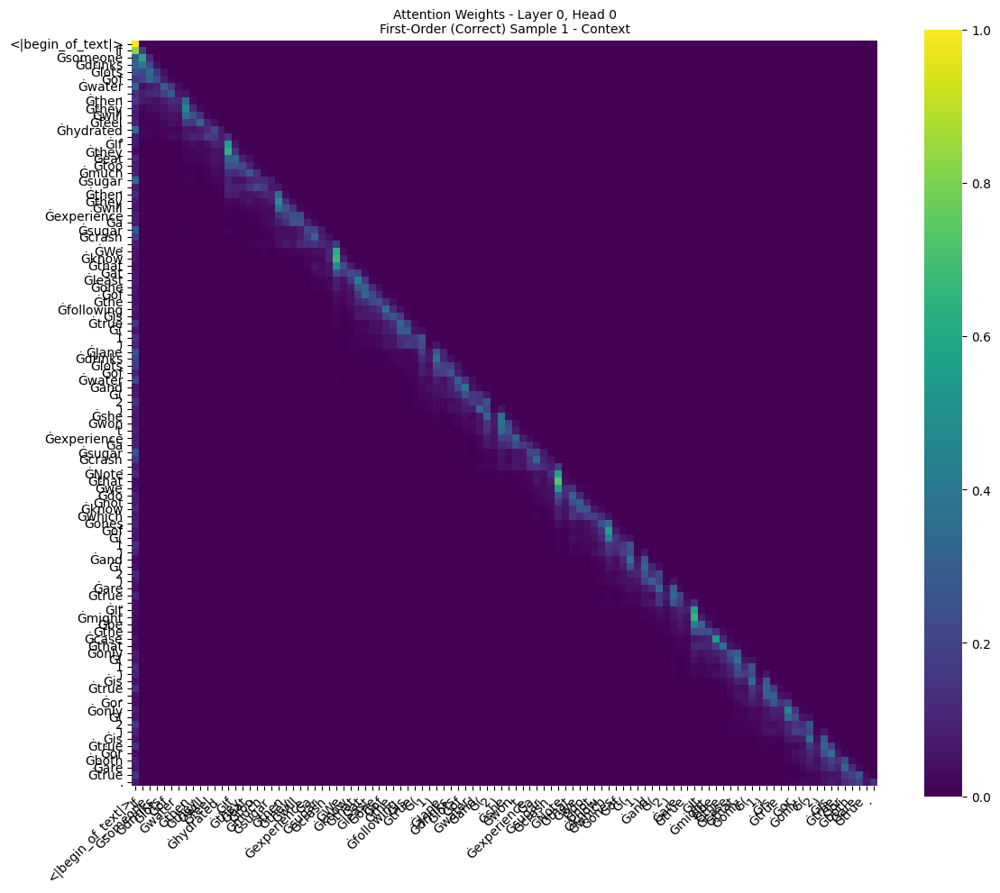

Predicted next word: '<|begin_of_text|>'

  QA Pair 1: If at least one of (1) and (2) is true, can we say, at least one of the following must always be true? (a) she will feel hydrated and (b) she doesn't eat too much sugar
  Correct Answer: True


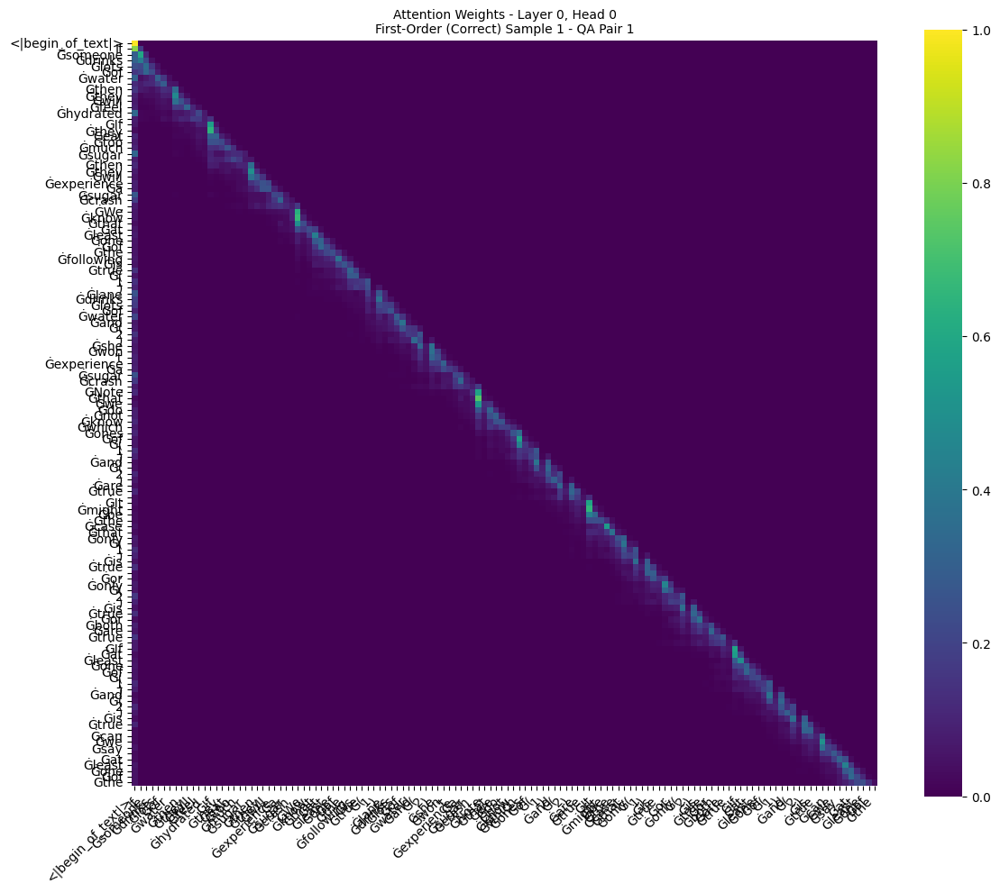

Predicted next word: ' following'
  Model's inferred next word: ' following'

  QA Pair 2: If at least one of (1) and (2) is true, can we say, at least one of the following must always be true? (a) she won't feel hydrated and (b) she eats too much sugar
  Correct Answer: False


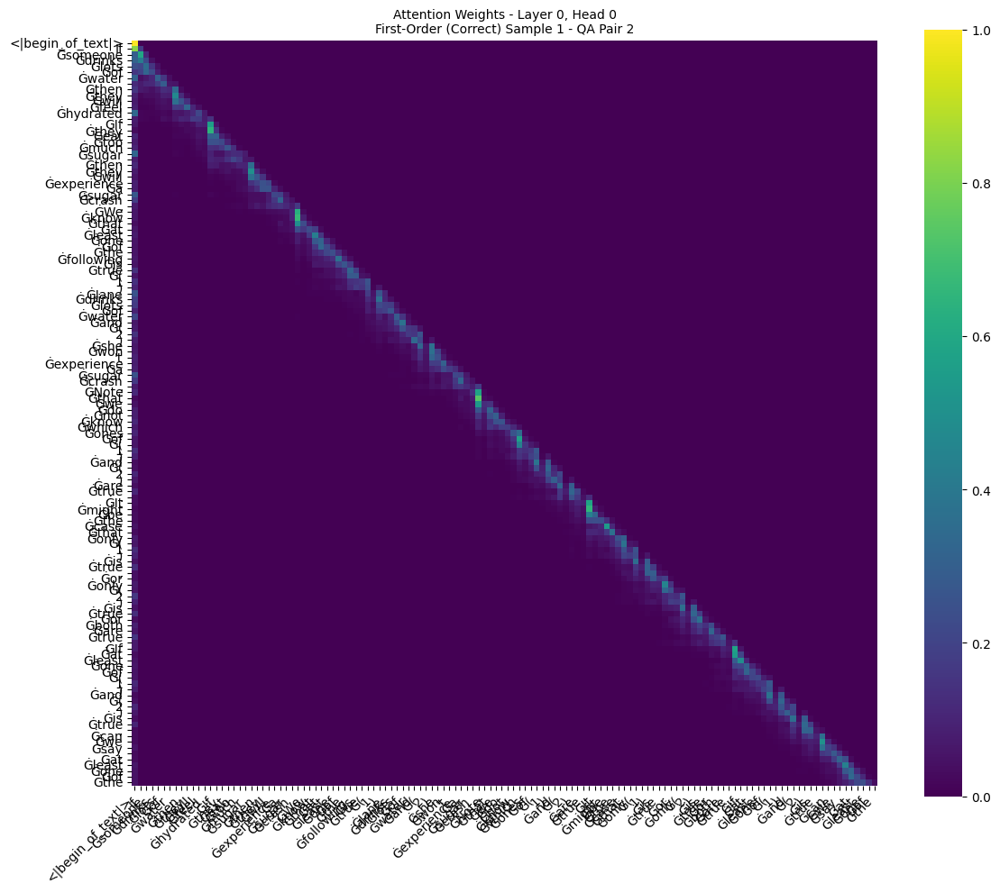

Predicted next word: ' following'
  Model's inferred next word: ' following'

  QA Pair 3: If at least one of (1) and (2) is true, can we say, at least one of the following must always be true? (a) she will feel hydrated and (b) she eats too much sugar
  Correct Answer: False


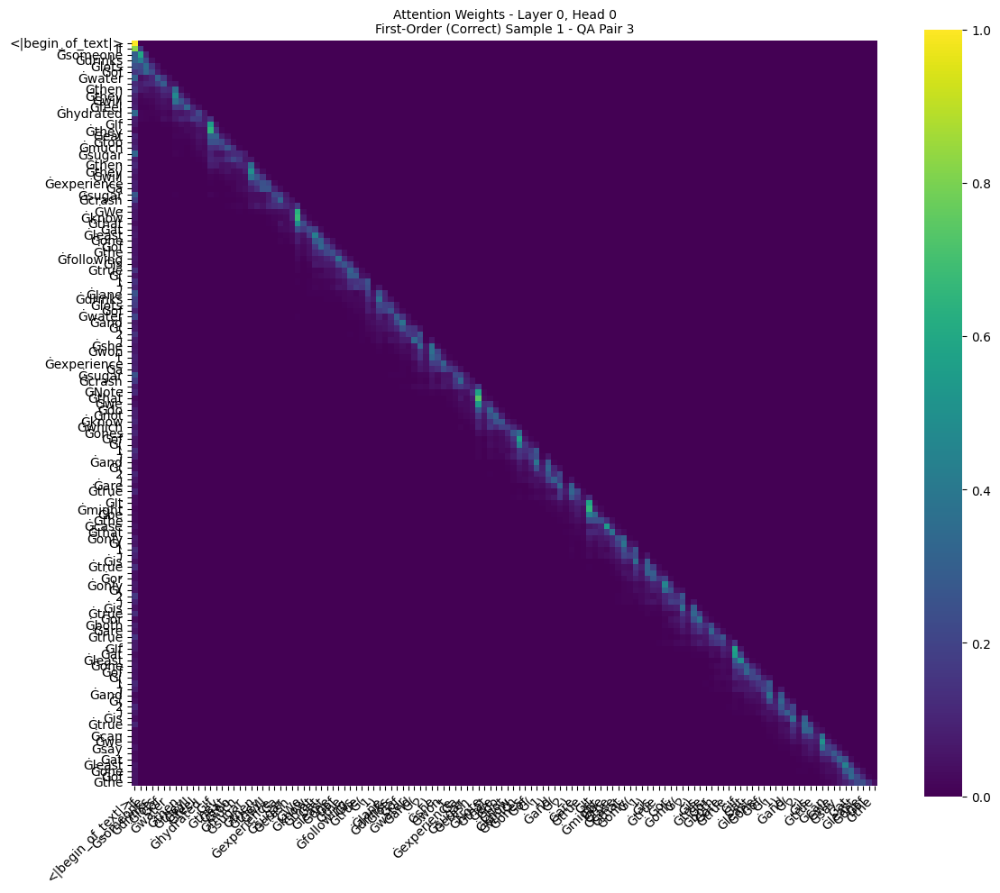

Predicted next word: ' following'
  Model's inferred next word: ' following'

  QA Pair 4: If at least one of (1) and (2) is true, can we say, at least one of the following must always be true? (a) she won't feel hydrated and (b) she doesn't eat too much sugar
  Correct Answer: False


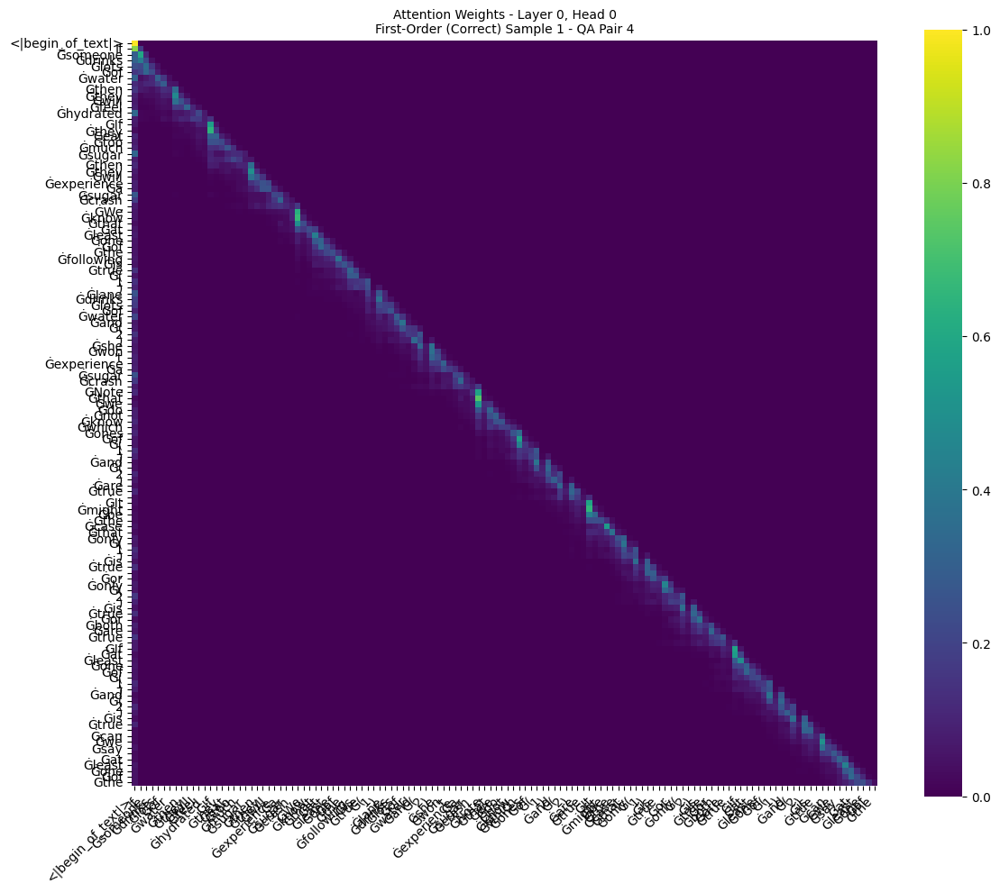

Predicted next word: ' following'
  Model's inferred next word: ' following'

Sample 2 Context: If someone goes for a run, then they will feel healthier. If they stay up late, then they will be tired. We know that at least one of the following is true (1) Jack goes for a run and (2) he won't be tired. Note that we do not know which ones of (1) and (2) are true. It might be the case that only (1) is true, or only (2) is true or both are true.


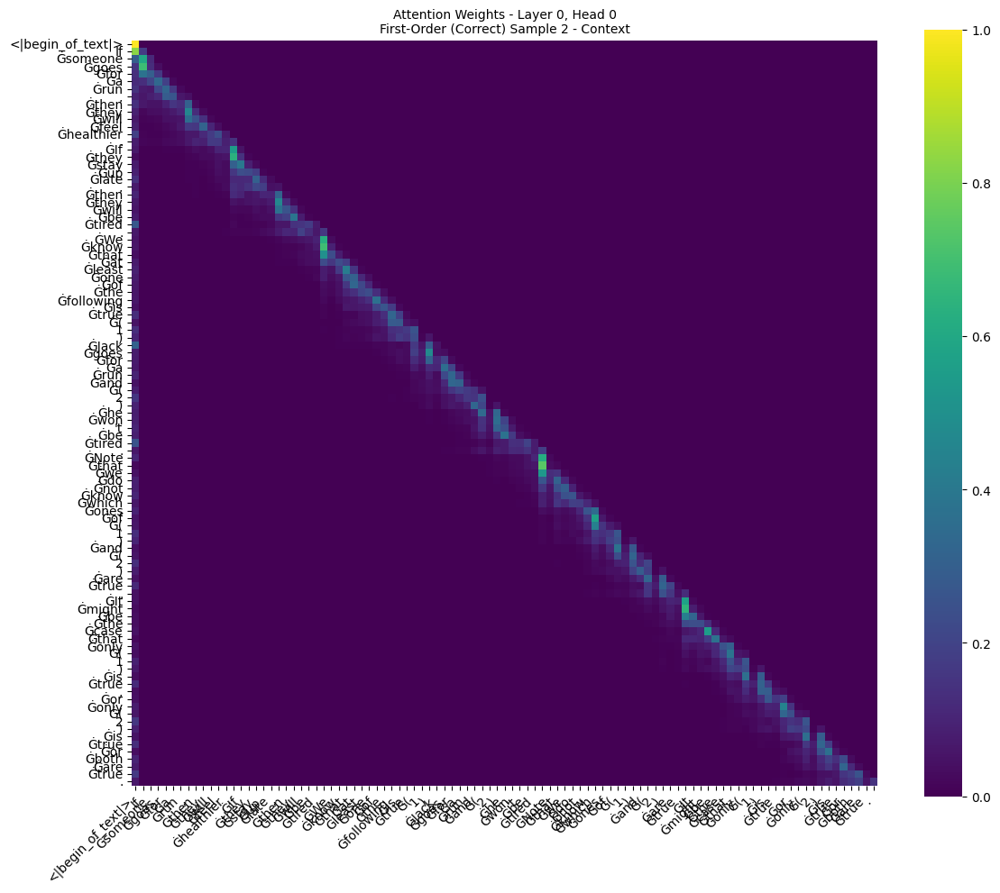

Predicted next word: '<|begin_of_text|>'

  QA Pair 1: If at least one of (1) and (2) is true, can we say, at least one of the following must always be true? (a) he will feel healthier and (b) he doesn't stay up late
  Correct Answer: True


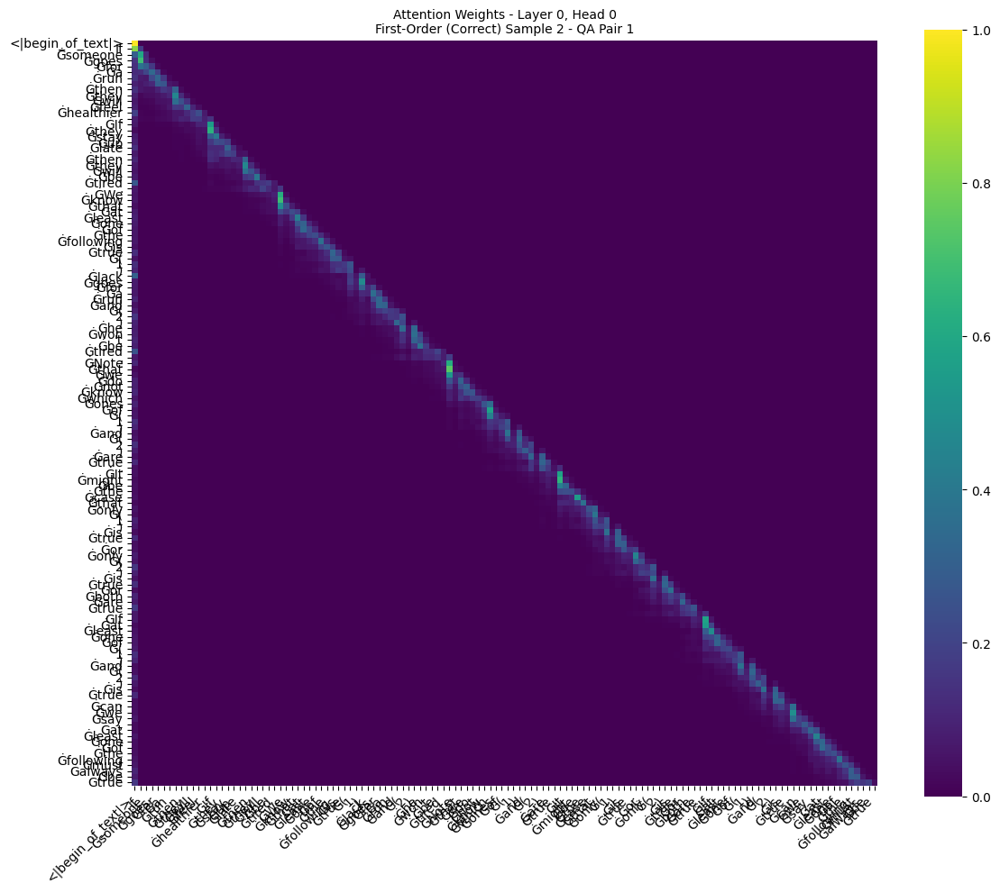

Predicted next word: ':'
  Model's inferred next word: ':'

  QA Pair 2: If at least one of (1) and (2) is true, can we say, at least one of the following must always be true? (a) he won't feel healthier and (b) he stays up late
  Correct Answer: False


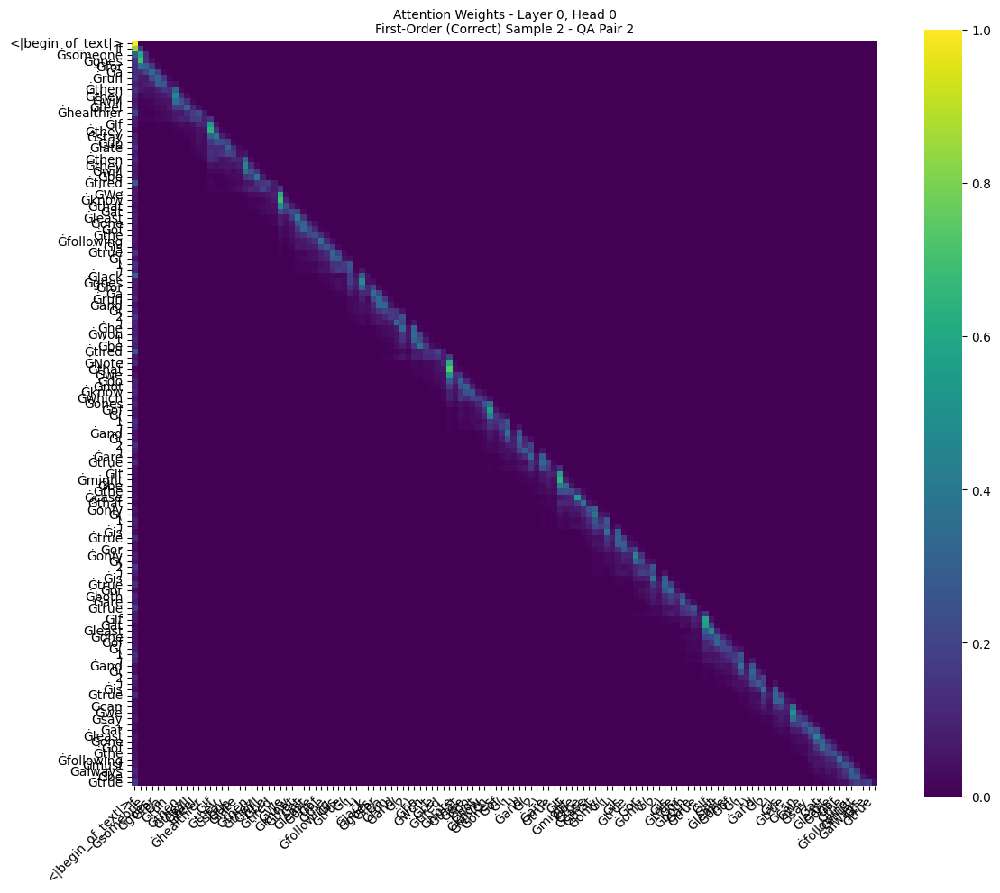

Predicted next word: ':'
  Model's inferred next word: ':'

  QA Pair 3: If at least one of (1) and (2) is true, can we say, at least one of the following must always be true? (a) he will feel healthier and (b) he stays up late
  Correct Answer: False


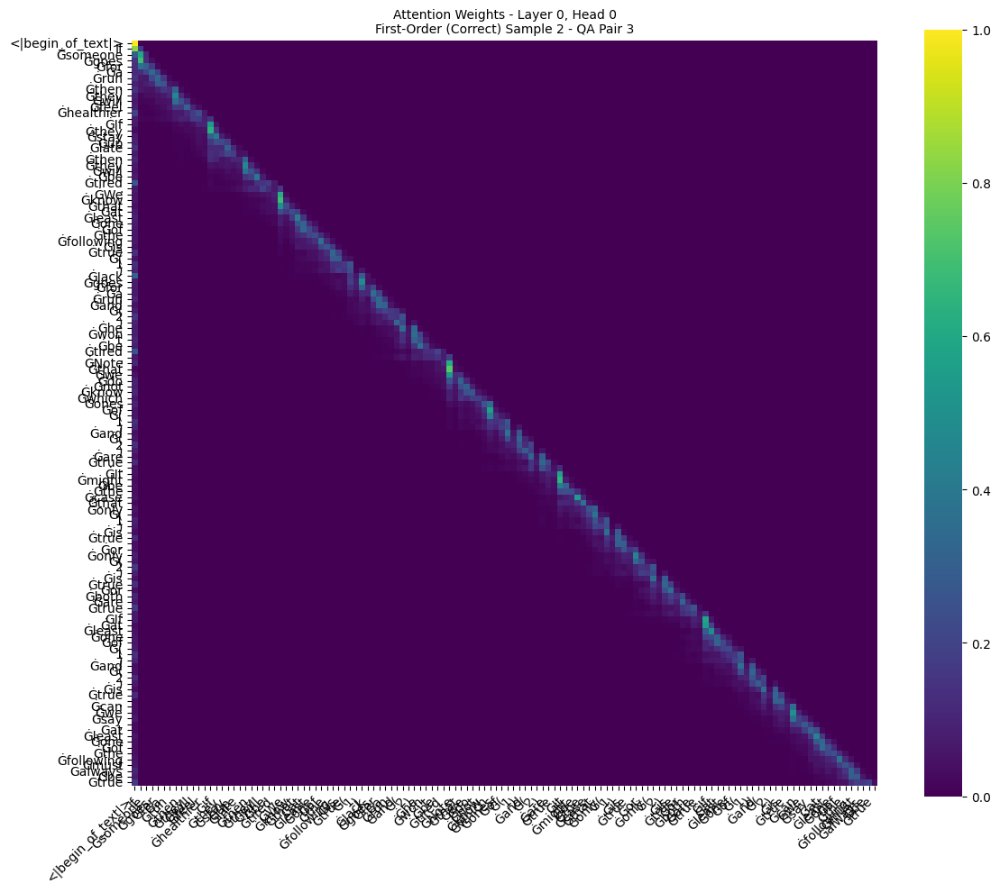

Predicted next word: ':'
  Model's inferred next word: ':'

  QA Pair 4: If at least one of (1) and (2) is true, can we say, at least one of the following must always be true? (a) he won't feel healthier and (b) he doesn't stay up late
  Correct Answer: False


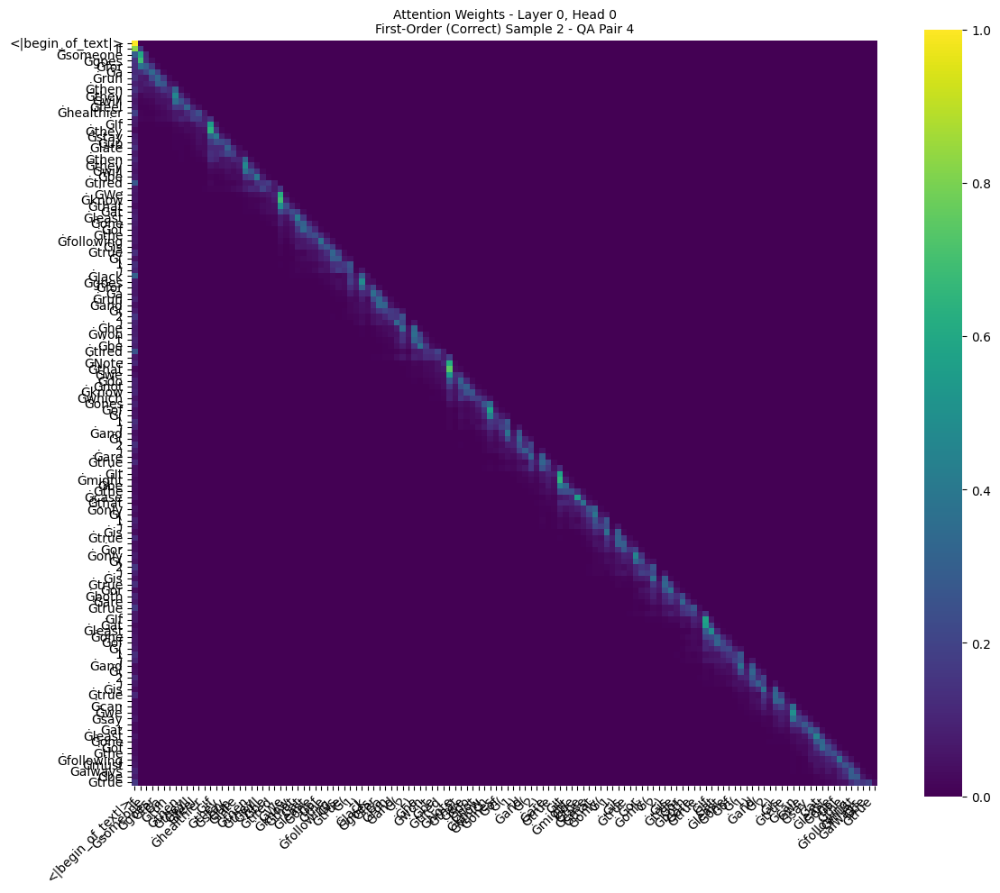

Predicted next word: ':'
  Model's inferred next word: ':'

Sample 3 Context: If someone reads a book, then they will gain knowledge. If they watch television, then they will be entertained. We know that at least one of the following is true (1) Alice reads a book. and (2) he won't be entertained. Note that we do not know which ones of (1) and (2) are true. It might be the case that only (1) is true, or only (2) is true or both are true.


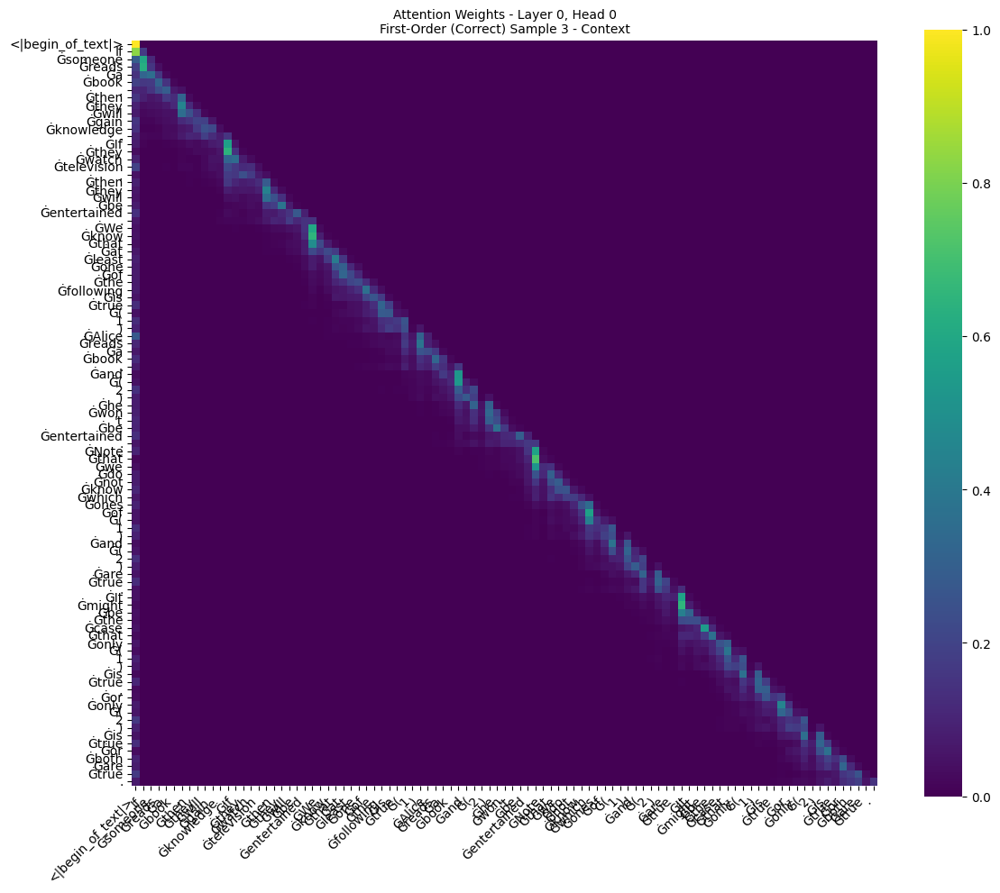

Predicted next word: '<|begin_of_text|>'

  QA Pair 1: If at least one of (1) and (2) is true, can we say, at least one of the following must always be true? (a) She will gain knowledge. and (b) he doesn't watch television.
  Correct Answer: True


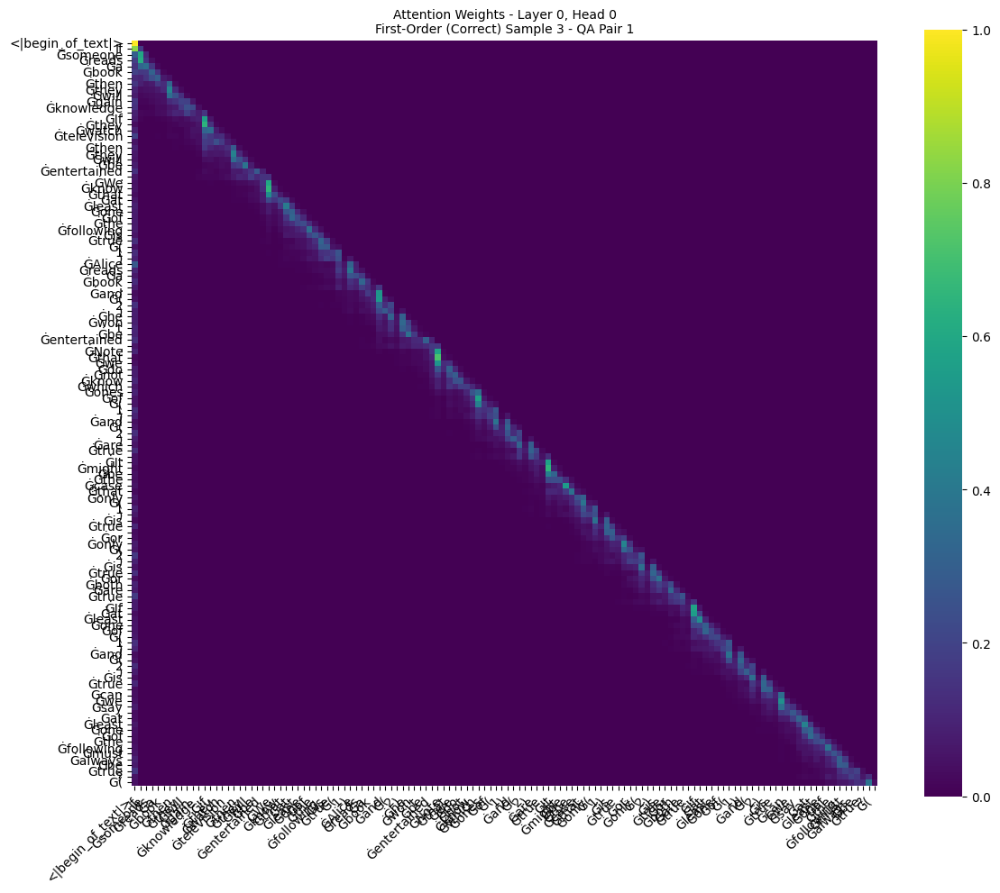

Predicted next word: '1'
  Model's inferred next word: '1'

  QA Pair 2: If at least one of (1) and (2) is true, can we say, at least one of the following must always be true? (a) she won't gain knowledge. and (b) He watches television.
  Correct Answer: False


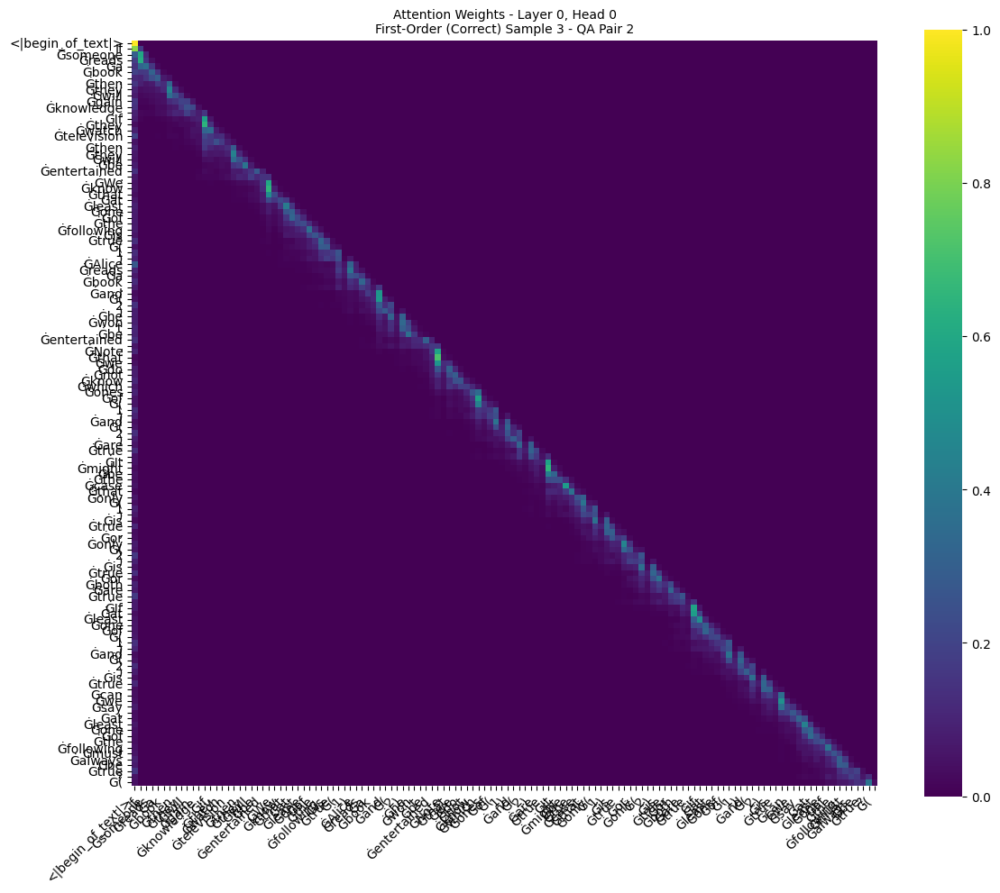

Predicted next word: '1'
  Model's inferred next word: '1'

  QA Pair 3: If at least one of (1) and (2) is true, can we say, at least one of the following must always be true? (a) She will gain knowledge. and (b) He watches television.
  Correct Answer: False


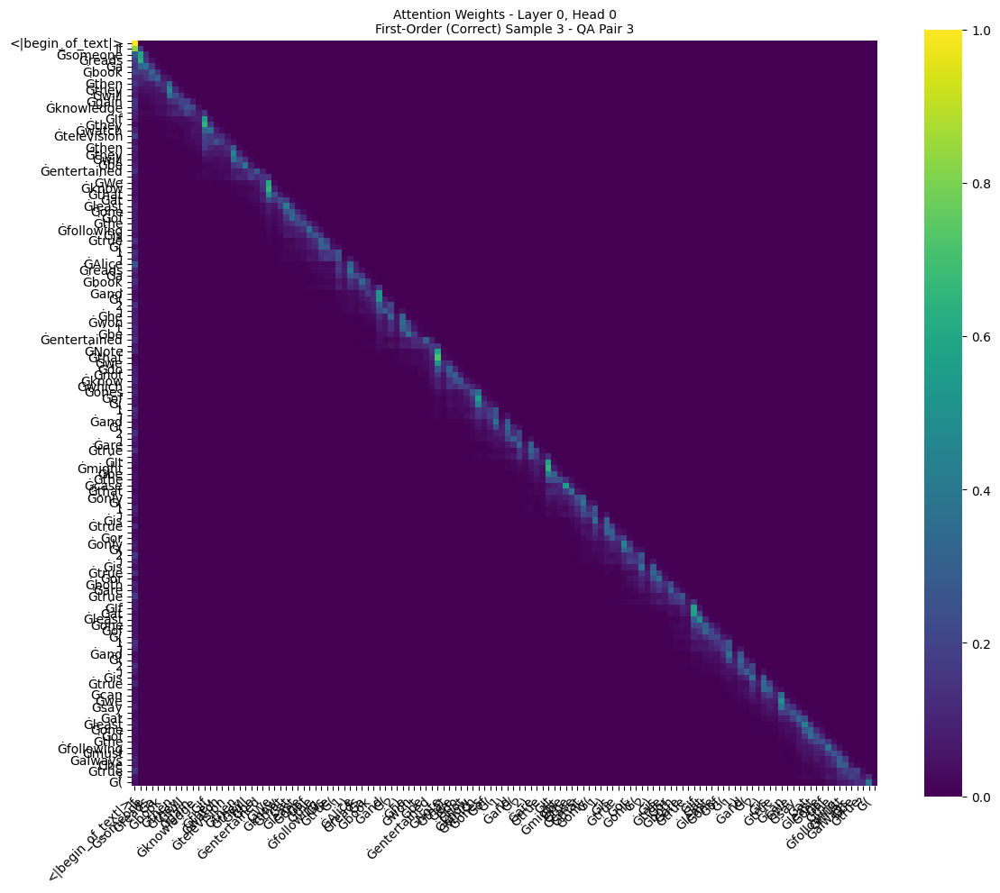

Predicted next word: '1'
  Model's inferred next word: '1'

  QA Pair 4: If at least one of (1) and (2) is true, can we say, at least one of the following must always be true? (a) she won't gain knowledge. and (b) he doesn't watch television.
  Correct Answer: False


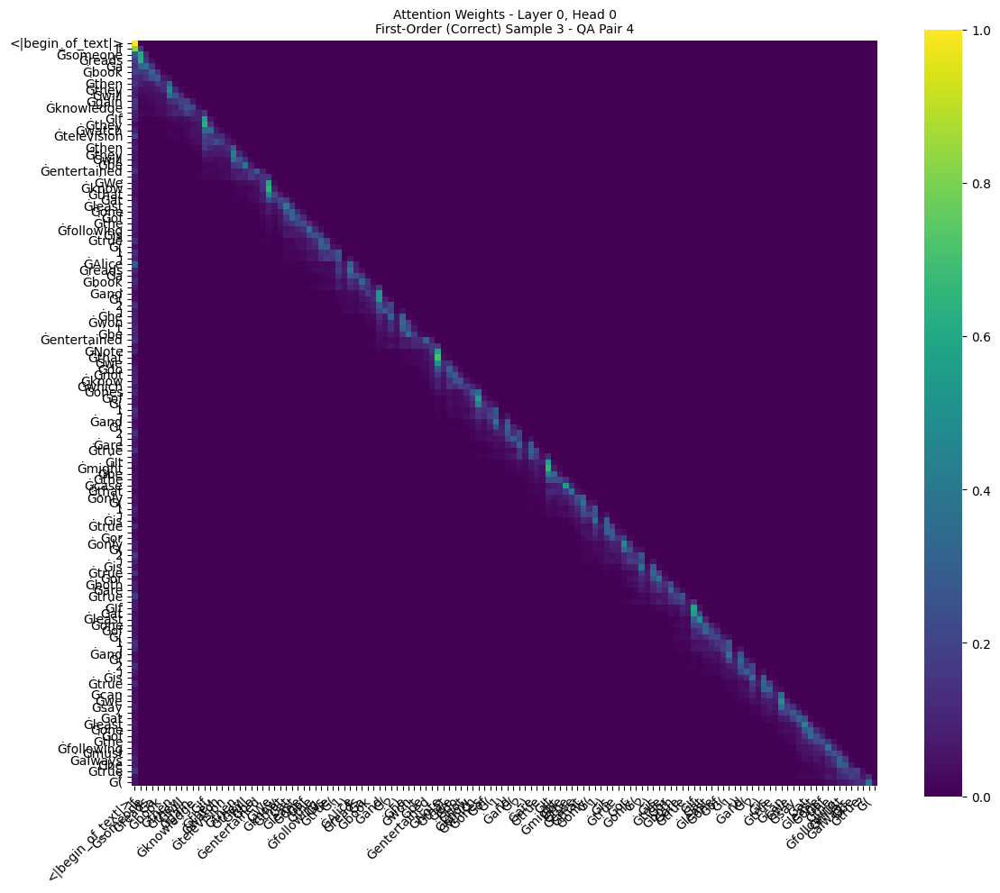

Predicted next word: '1'
  Model's inferred next word: '1'

Sample 4 Context: If someone drives recklessly, then they will get a ticket. If they drive carefully, then they will reach their destination safely. We know that at least one of the following is true (1) John drives recklessly and (2) he won't reach his destination safely. Note that we do not know which ones of (1) and (2) are true. It might be the case that only (1) is true, or only (2) is true or both are true.


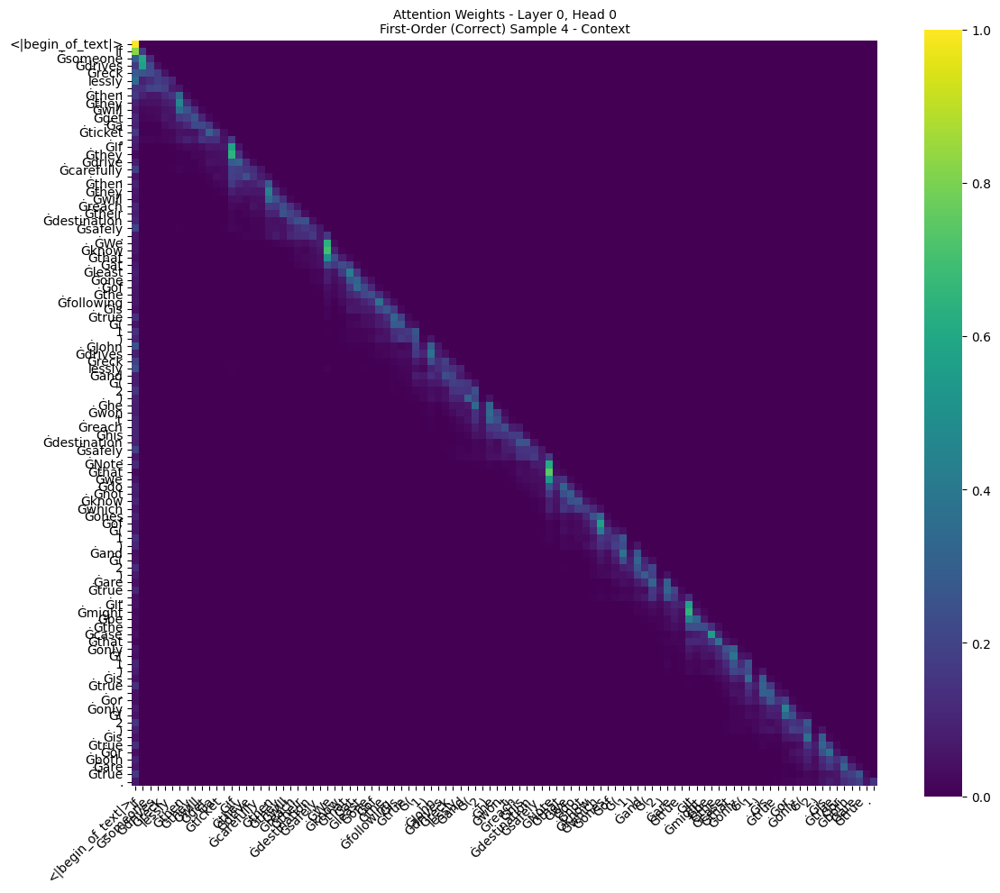

Predicted next word: '<|begin_of_text|>'

  QA Pair 1: If at least one of (1) and (2) is true, can we say, at least one of the following must always be true? (a) he will get a ticket and (b) he doesn't drive carefully
  Correct Answer: True


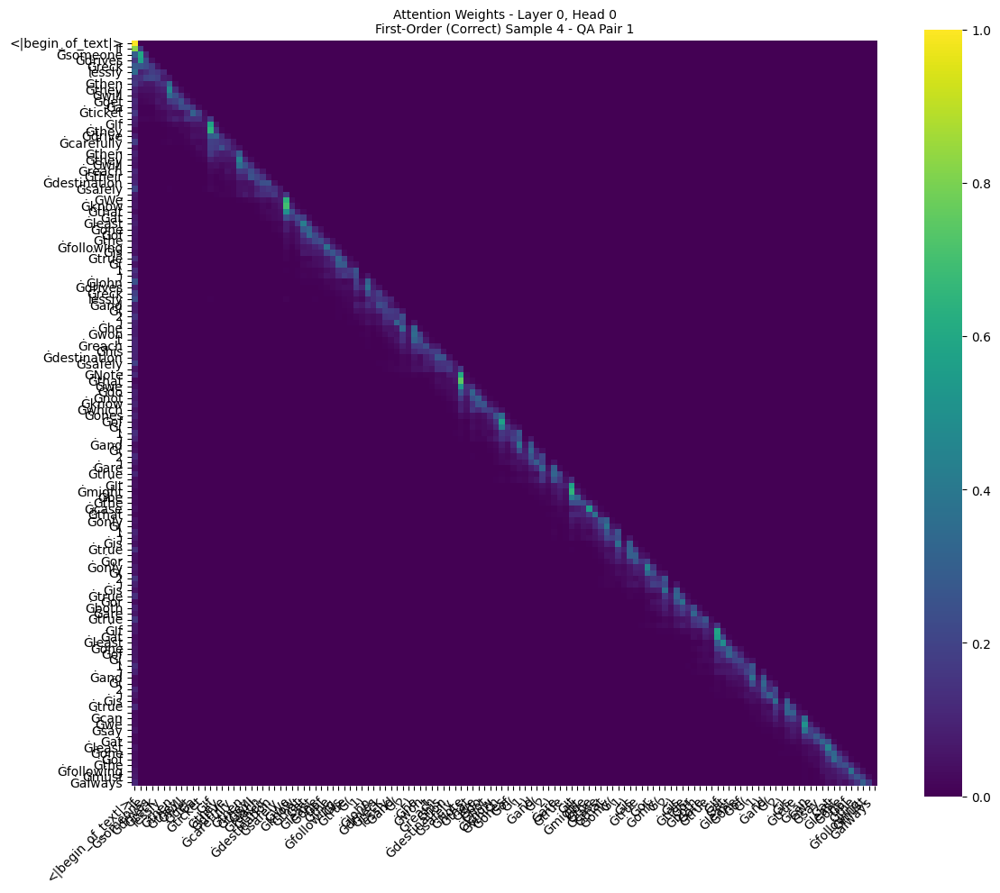

Predicted next word: ' be'
  Model's inferred next word: ' be'

  QA Pair 2: If at least one of (1) and (2) is true, can we say, at least one of the following must always be true? (a) he won't get a ticket and (b) he drives carefully
  Correct Answer: False


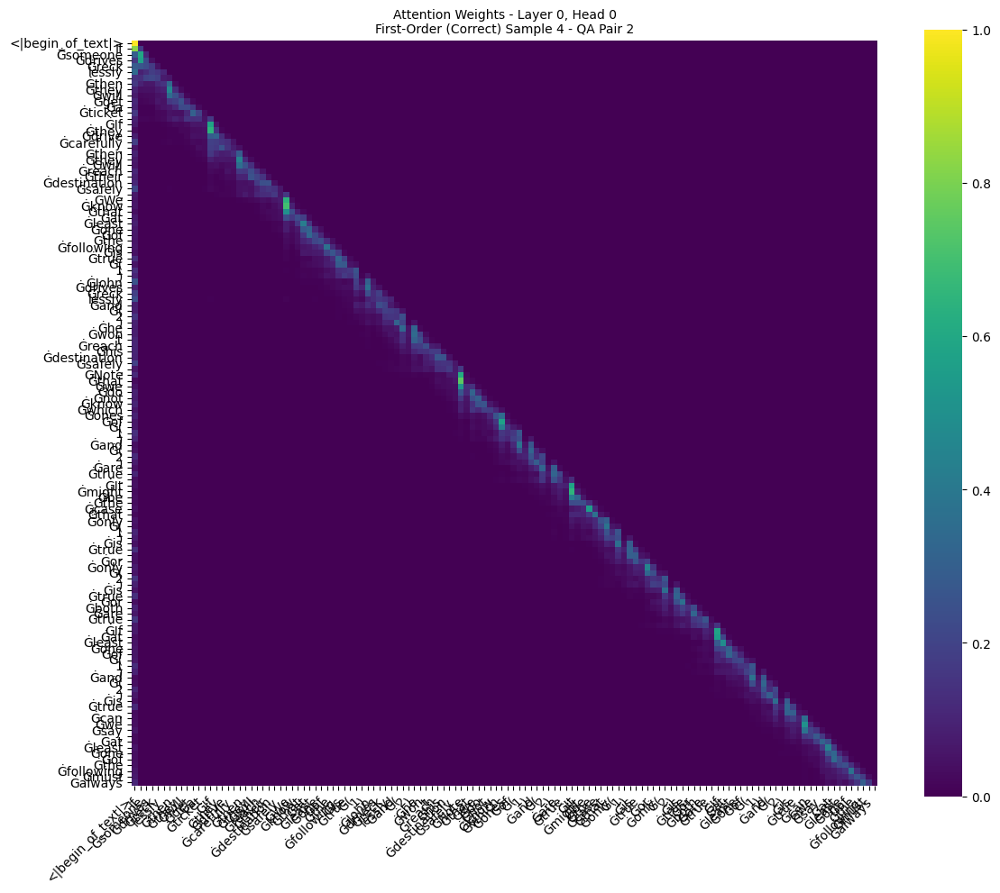

Predicted next word: ' be'
  Model's inferred next word: ' be'

  QA Pair 3: If at least one of (1) and (2) is true, can we say, at least one of the following must always be true? (a) he will get a ticket and (b) he drives carefully
  Correct Answer: False


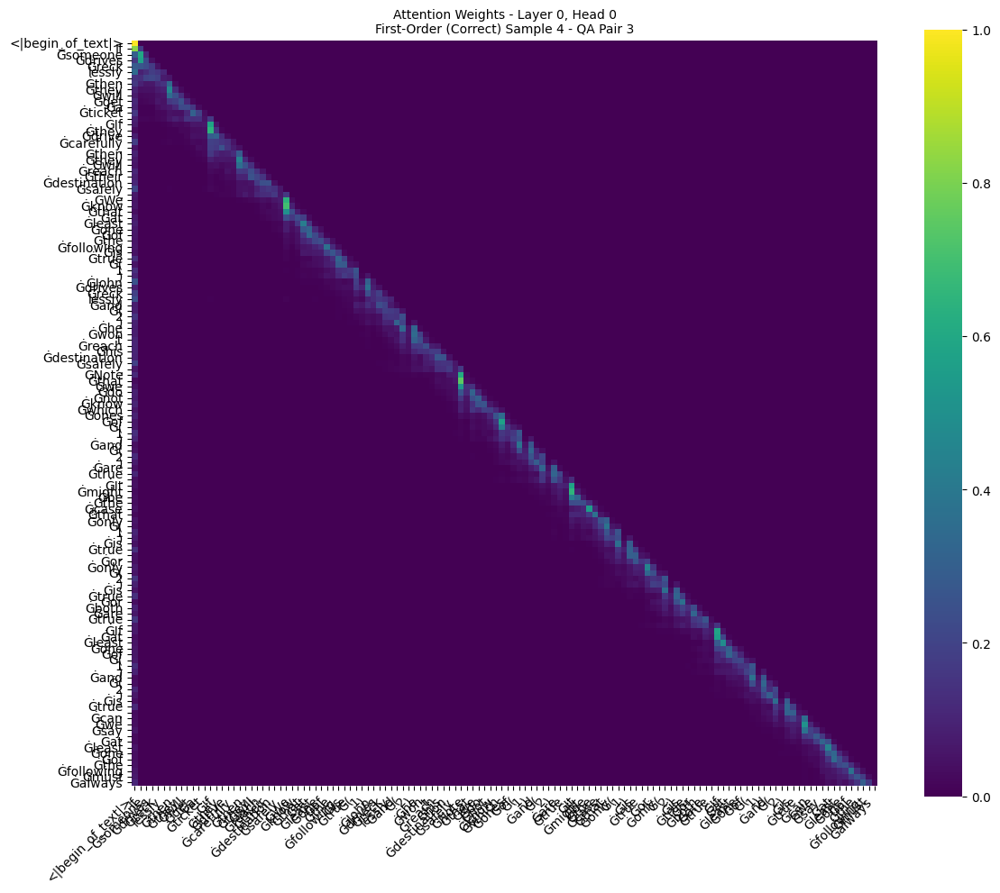

Predicted next word: ' be'
  Model's inferred next word: ' be'

  QA Pair 4: If at least one of (1) and (2) is true, can we say, at least one of the following must always be true? (a) he won't get a ticket and (b) he doesn't drive carefully
  Correct Answer: False


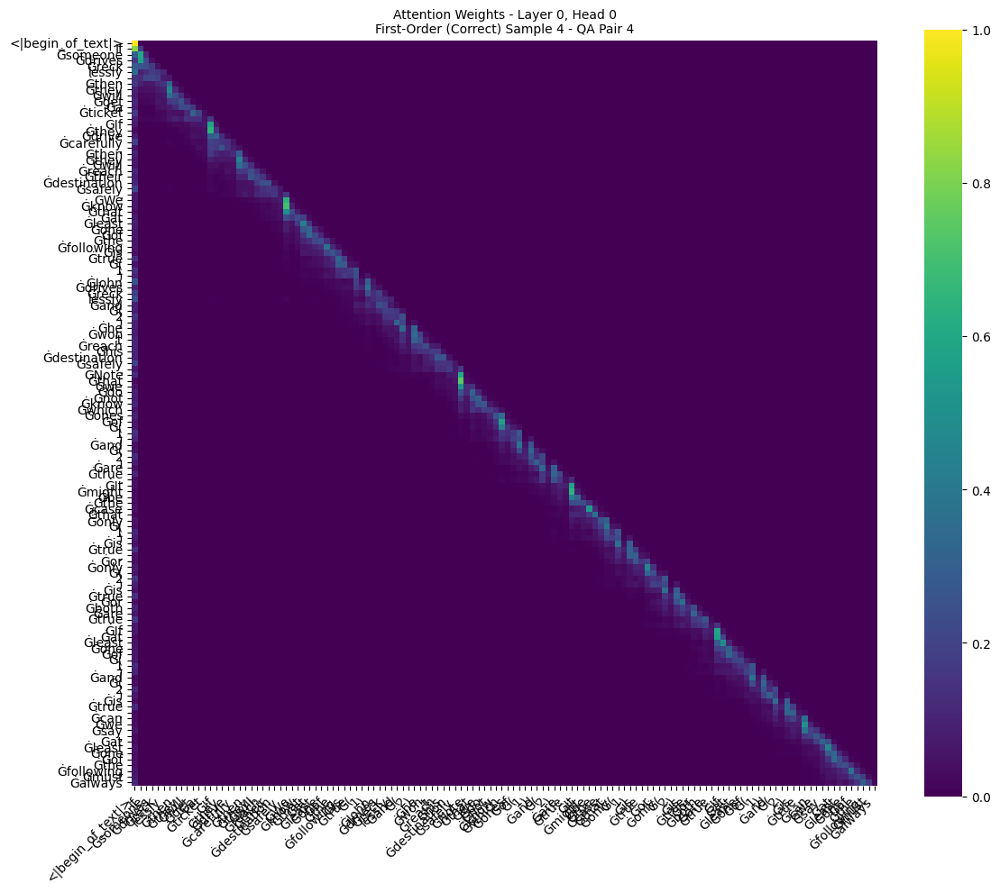

Predicted next word: ' be'
  Model's inferred next word: ' be'

Sample 5 Context: If someone goes to the gym, then they will be fit. If they eat unhealthy food, then they will be unhealthy. We know that at least one of the following is true (1) John goes to the gym and (2) he won't be unhealthy. Note that we do not know which ones of (1) and (2) are true. It might be the case that only (1) is true, or only (2) is true or both are true.


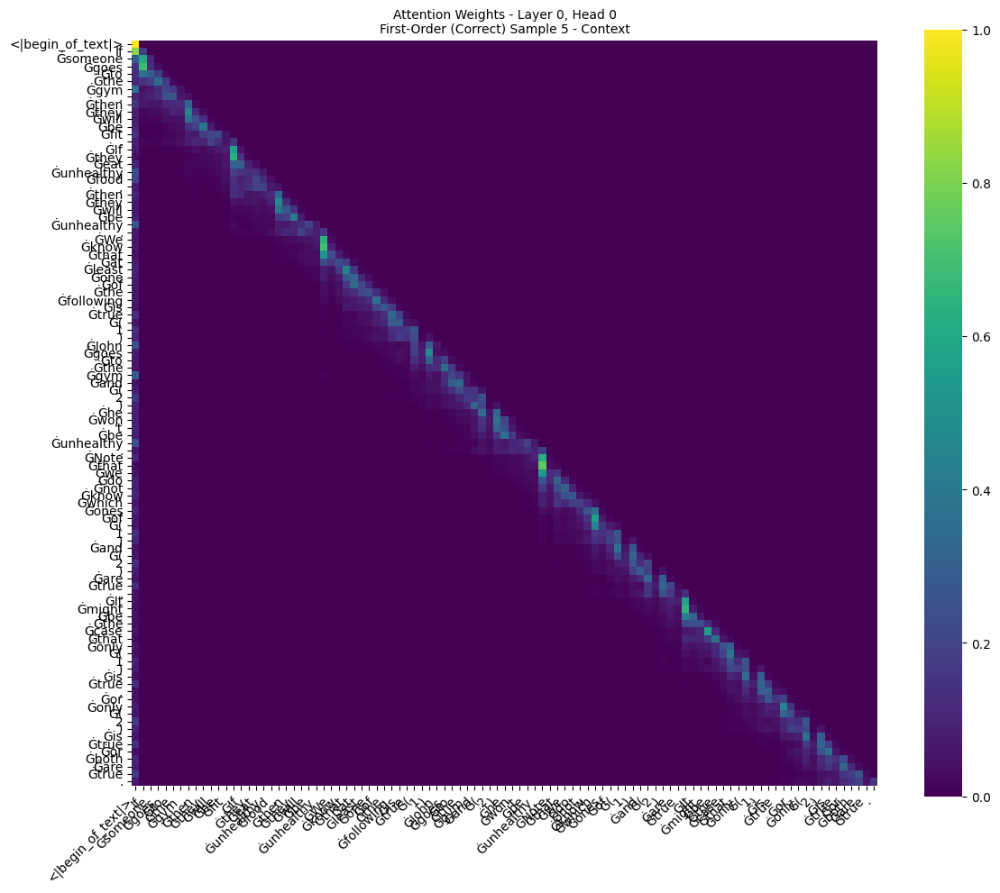

Predicted next word: '<|begin_of_text|>'

  QA Pair 1: If at least one of (1) and (2) is true, can we say, at least one of the following must always be true? (a) he will be fit and (b) he doesn't eat unhealthy food
  Correct Answer: True


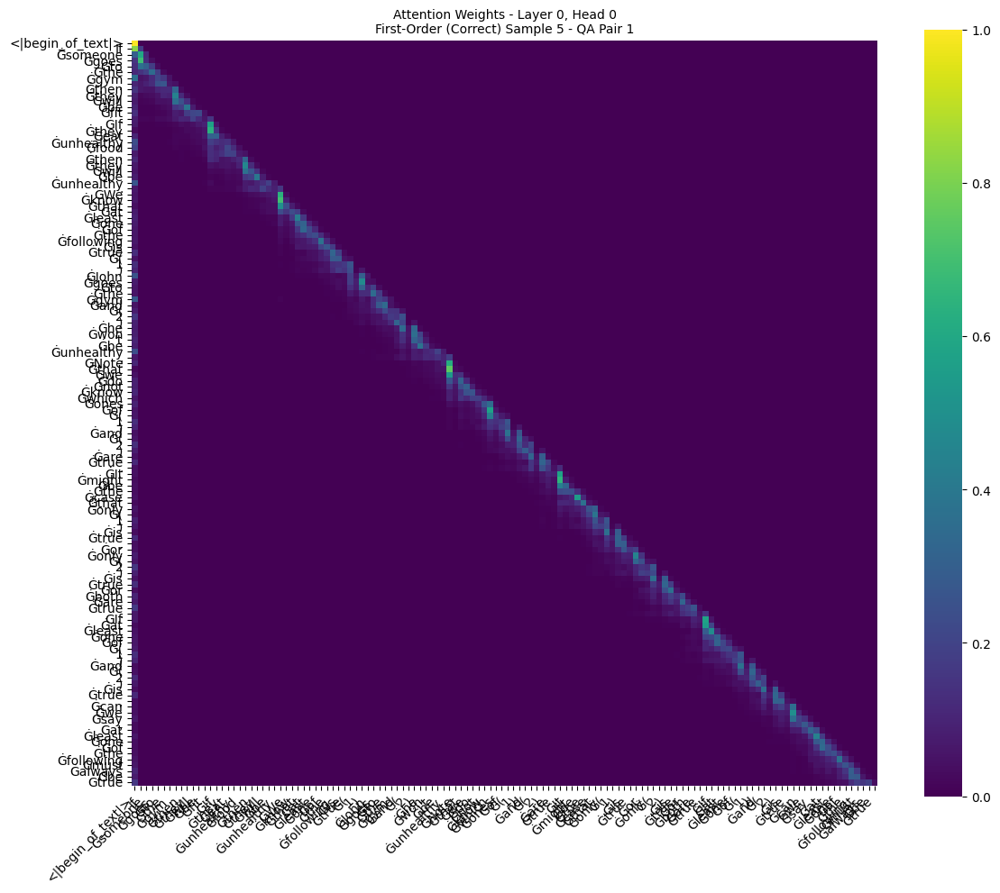

Predicted next word: ':'
  Model's inferred next word: ':'

  QA Pair 2: If at least one of (1) and (2) is true, can we say, at least one of the following must always be true? (a) he won't be fit and (b) he eats unhealthy food
  Correct Answer: False


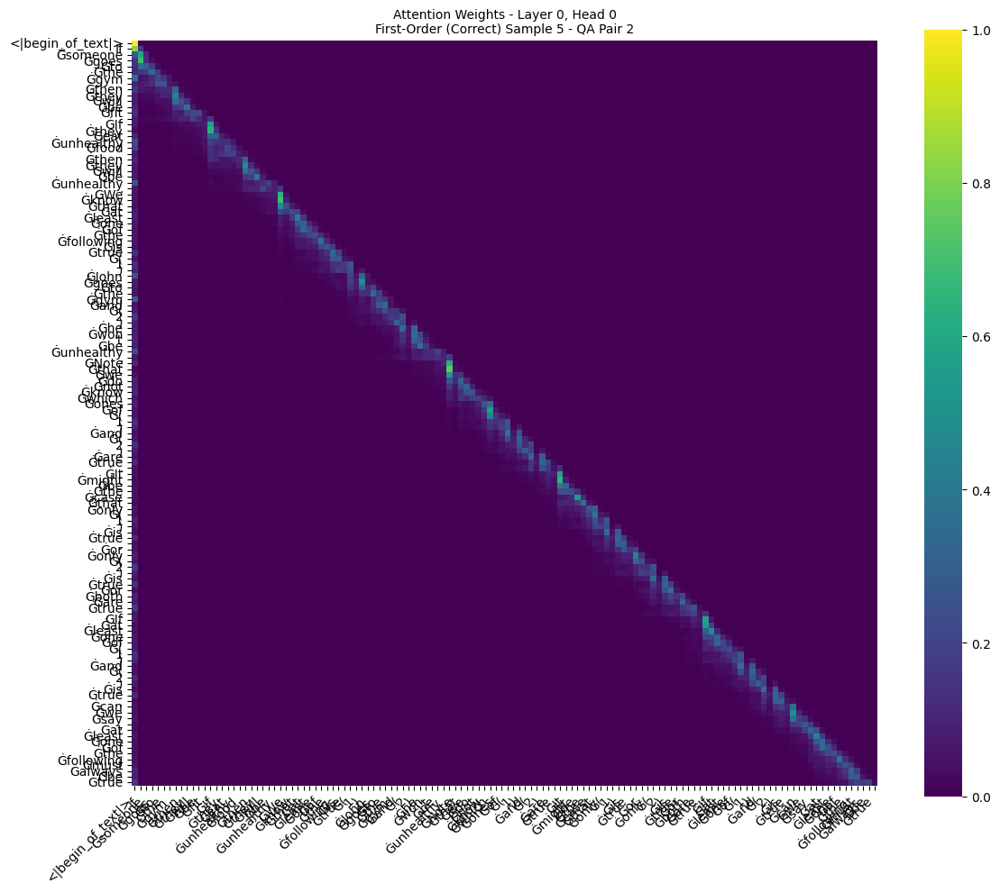

Predicted next word: ':'
  Model's inferred next word: ':'

  QA Pair 3: If at least one of (1) and (2) is true, can we say, at least one of the following must always be true? (a) he will be fit and (b) he eats unhealthy food
  Correct Answer: False


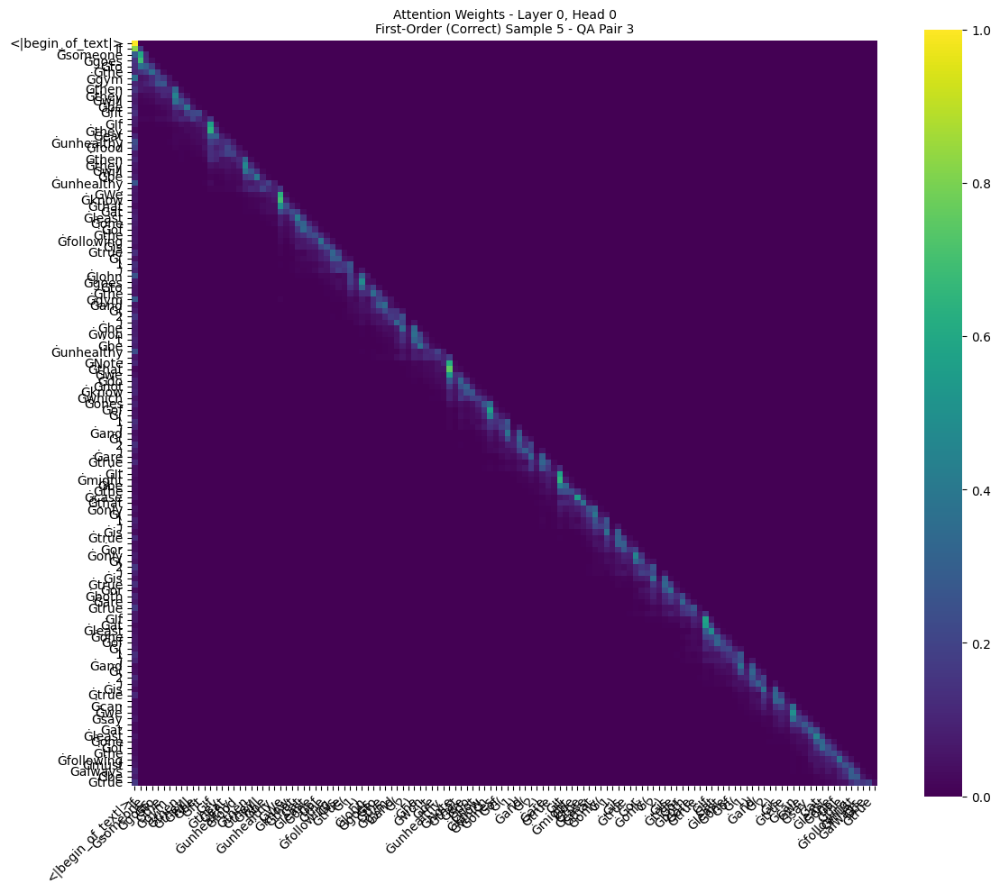

Predicted next word: ':'
  Model's inferred next word: ':'

  QA Pair 4: If at least one of (1) and (2) is true, can we say, at least one of the following must always be true? (a) he won't be fit and (b) he doesn't eat unhealthy food
  Correct Answer: False


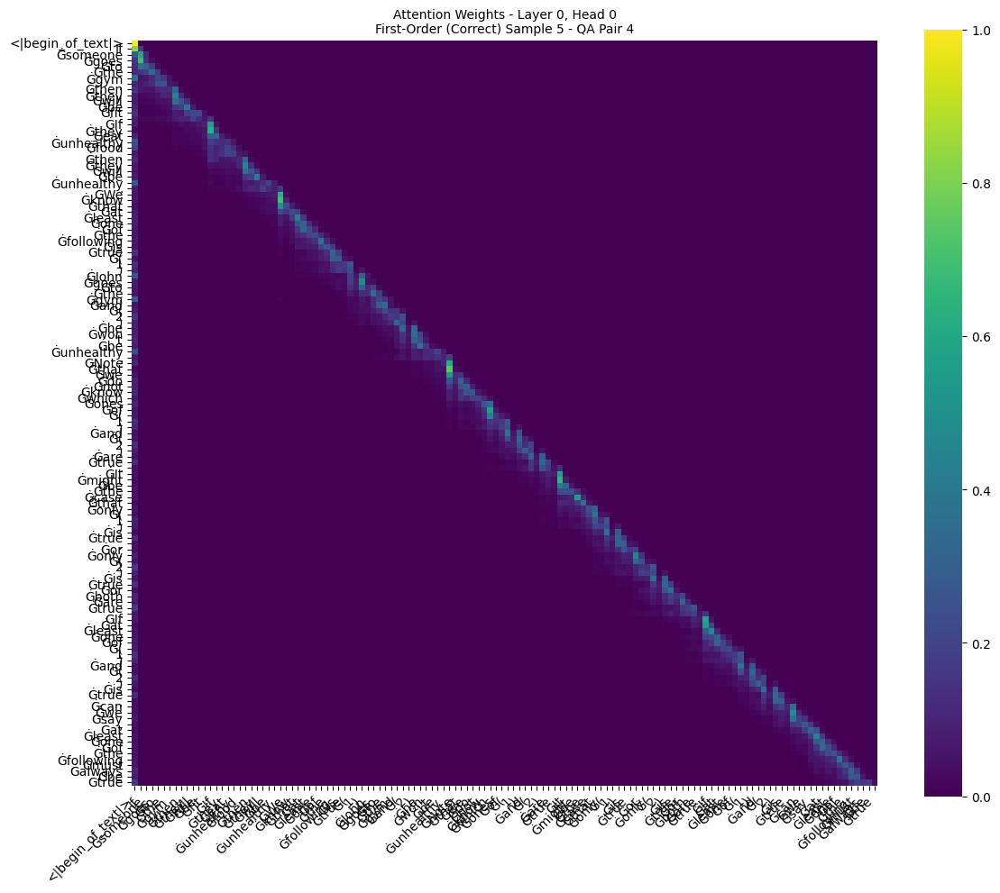

Predicted next word: ':'
  Model's inferred next word: ':'


In [10]:
# Run on all datasets with correct labels
process_samples(first_order_data_correct, "First-Order (Correct)")


Processing First-Order (Wrong) samples...

Sample 1 Context: If someone rents a car, then they will save time. If they drive their own car, then they will spend more money. We know that at least one of the following is true (1) Paul rents a car and (2) he won't spend more money. Note that we do not know which ones of (1) and (2) are true. It might be the case that only (1) is true, or only (2) is true or both are true.


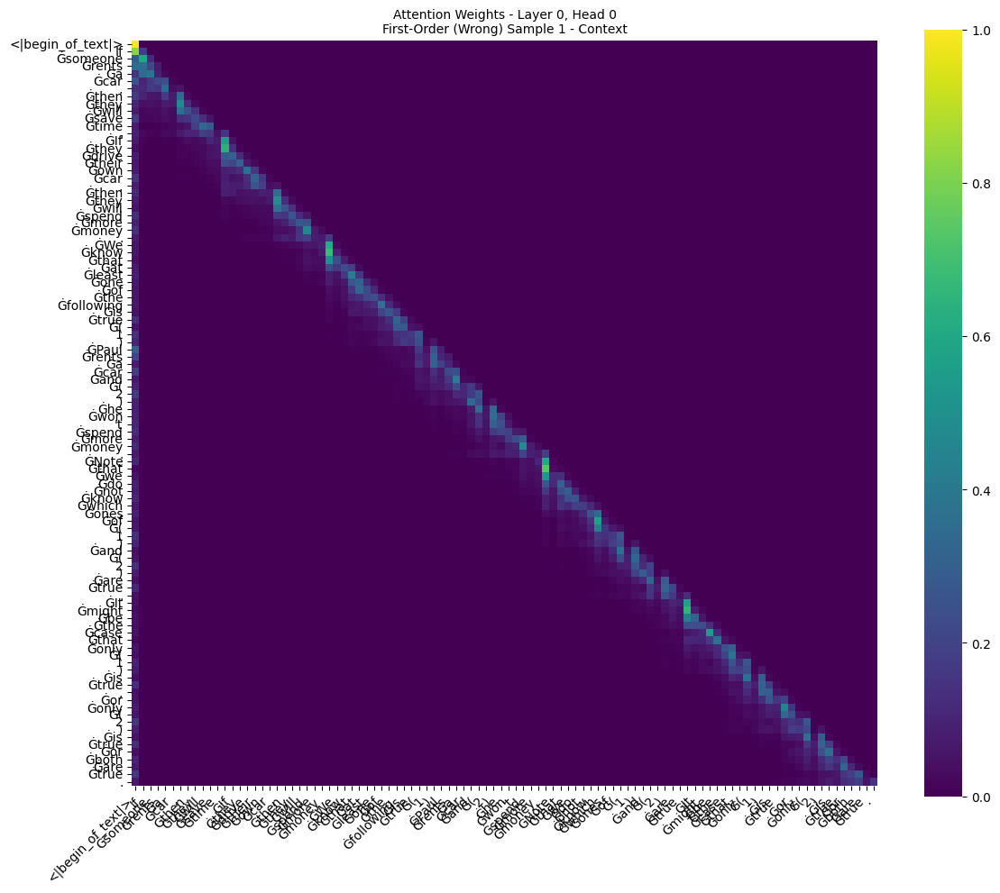

Predicted next word: '<|begin_of_text|>'

  QA Pair 1: If at least one of (1) and (2) is true, can we say, at least one of the following must always be true? (a) he will save time and (b) he doesn't drive his own car
  Correct Answer: False


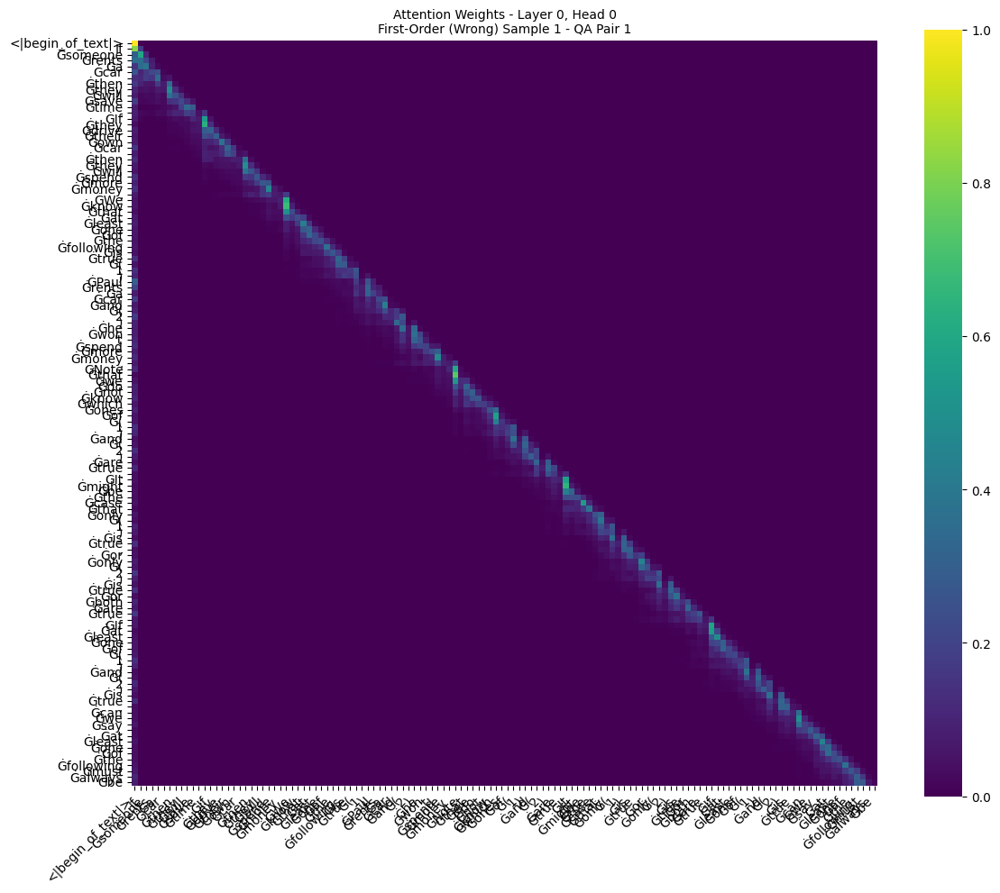

Predicted next word: ' true'
  Model's inferred next word: ' true'

  QA Pair 2: If at least one of (1) and (2) is true, can we say, at least one of the following must always be true? (a) he won't save time and (b) he drives his own car
  Correct Answer: True


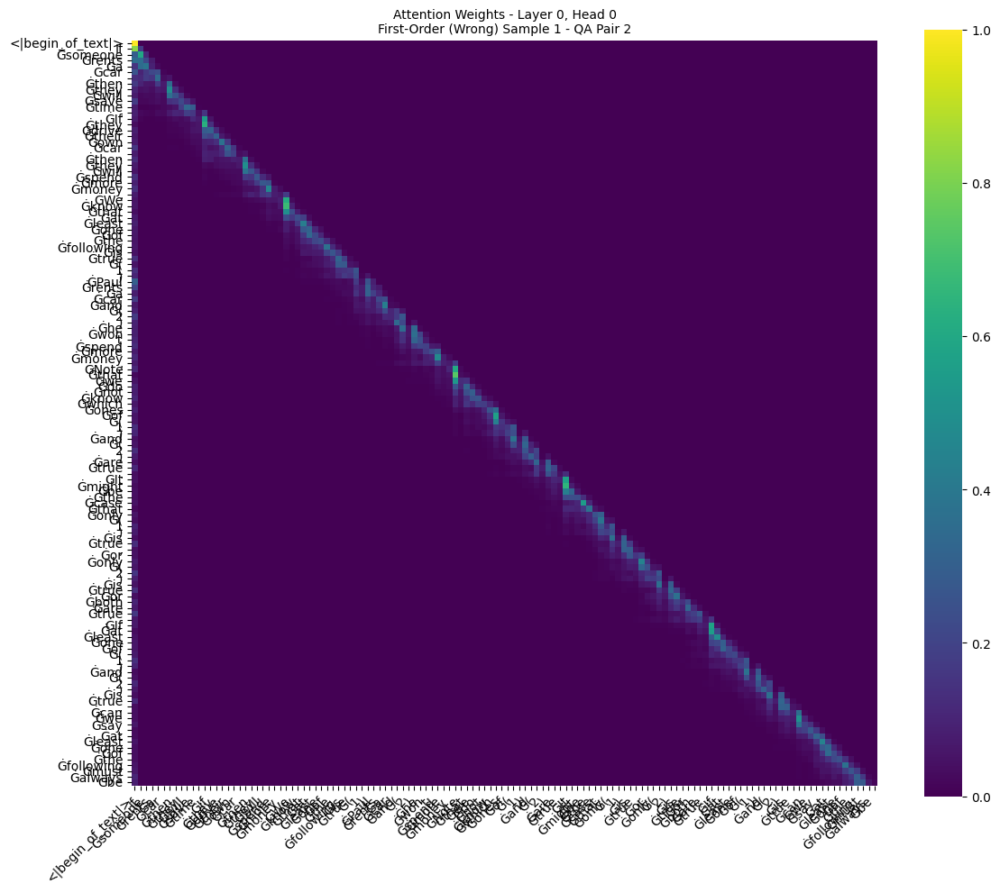

Predicted next word: ' true'
  Model's inferred next word: ' true'

  QA Pair 3: If at least one of (1) and (2) is true, can we say, at least one of the following must always be true? (a) he will save time and (b) he drives his own car
  Correct Answer: True


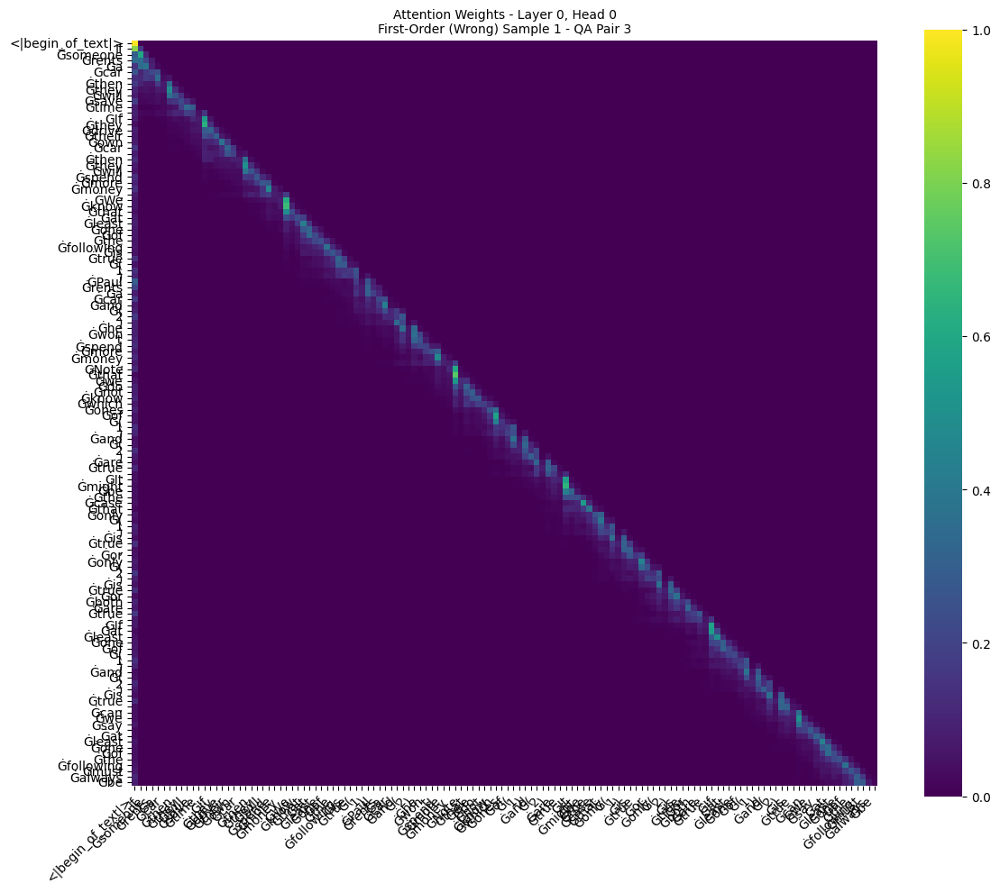

Predicted next word: ' true'
  Model's inferred next word: ' true'

  QA Pair 4: If at least one of (1) and (2) is true, can we say, at least one of the following must always be true? (a) he won't save time and (b) he doesn't drive his own car
  Correct Answer: True


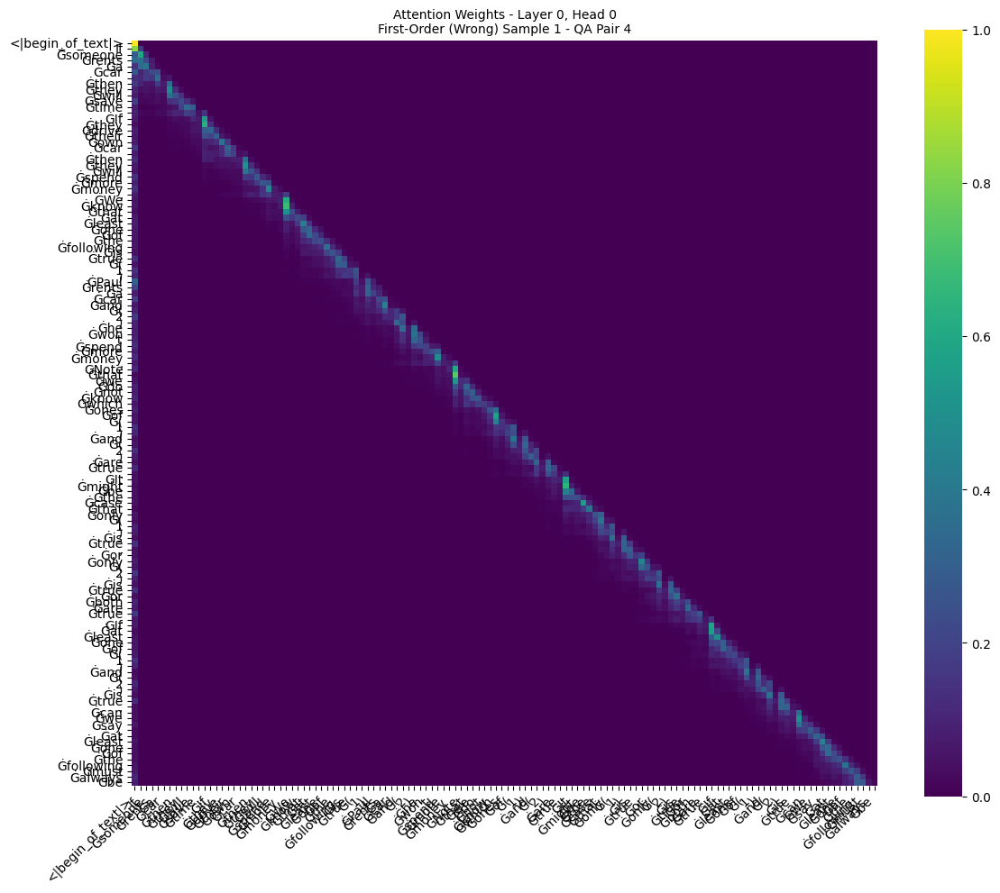

Predicted next word: ' true'
  Model's inferred next word: ' true'

Sample 2 Context: If someone spends a lot of time on the internet, then they become addicted to it. If they go outdoors more often, then they will be more active. We know that at least one of the following is true (1) John spends a lot of time on the internet and (2) he won't be more active. Note that we do not know which ones of (1) and (2) are true. It might be the case that only (1) is true, or only (2) is true or both are true.


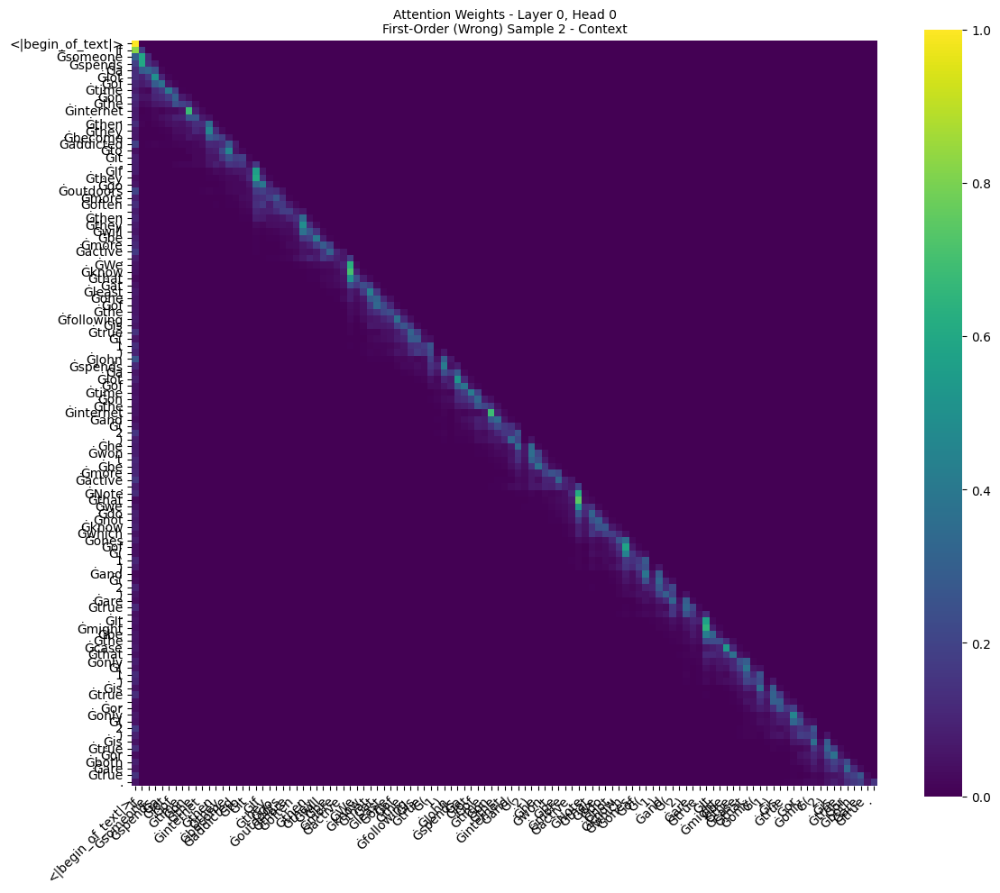

Predicted next word: '<|begin_of_text|>'

  QA Pair 1: If at least one of (1) and (2) is true, can we say, at least one of the following must always be true? (a) he becomes addicted to it and (b) he doesn't go outdoors more often
  Correct Answer: False


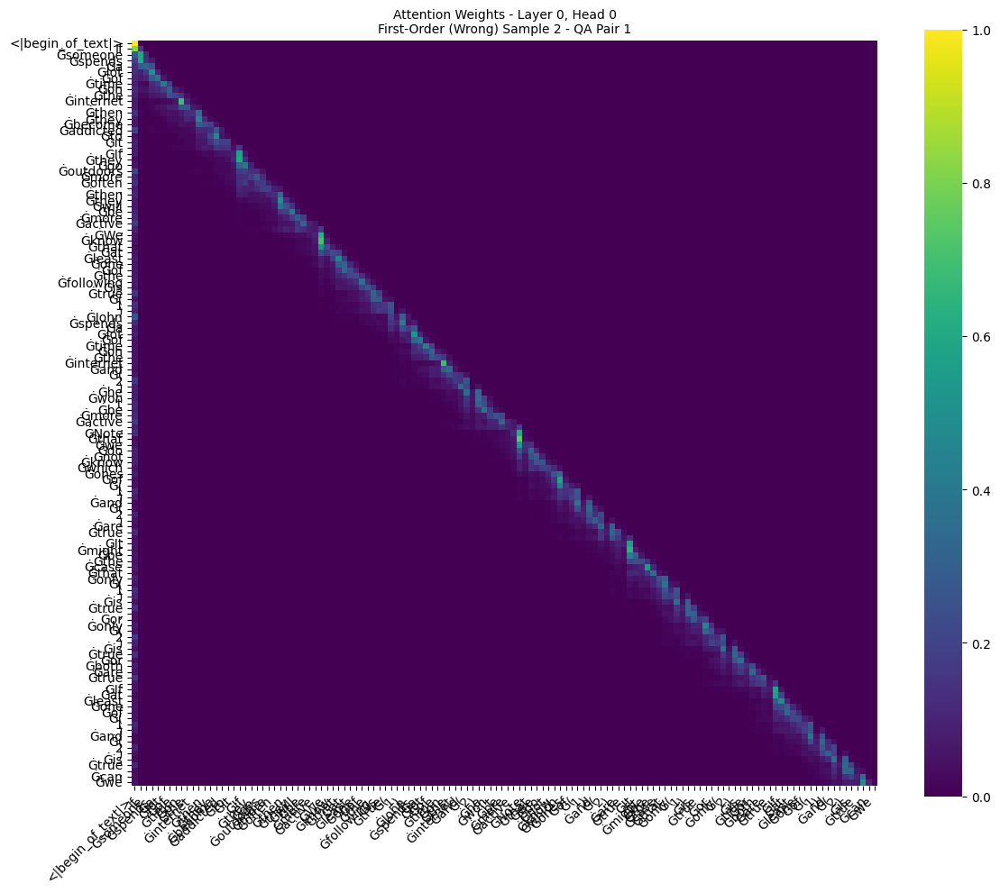

Predicted next word: ' conclude'
  Model's inferred next word: ' conclude'

  QA Pair 2: If at least one of (1) and (2) is true, can we say, at least one of the following must always be true? (a) he doesn't become addicted to it and (b) he goes outdoors more often
  Correct Answer: True


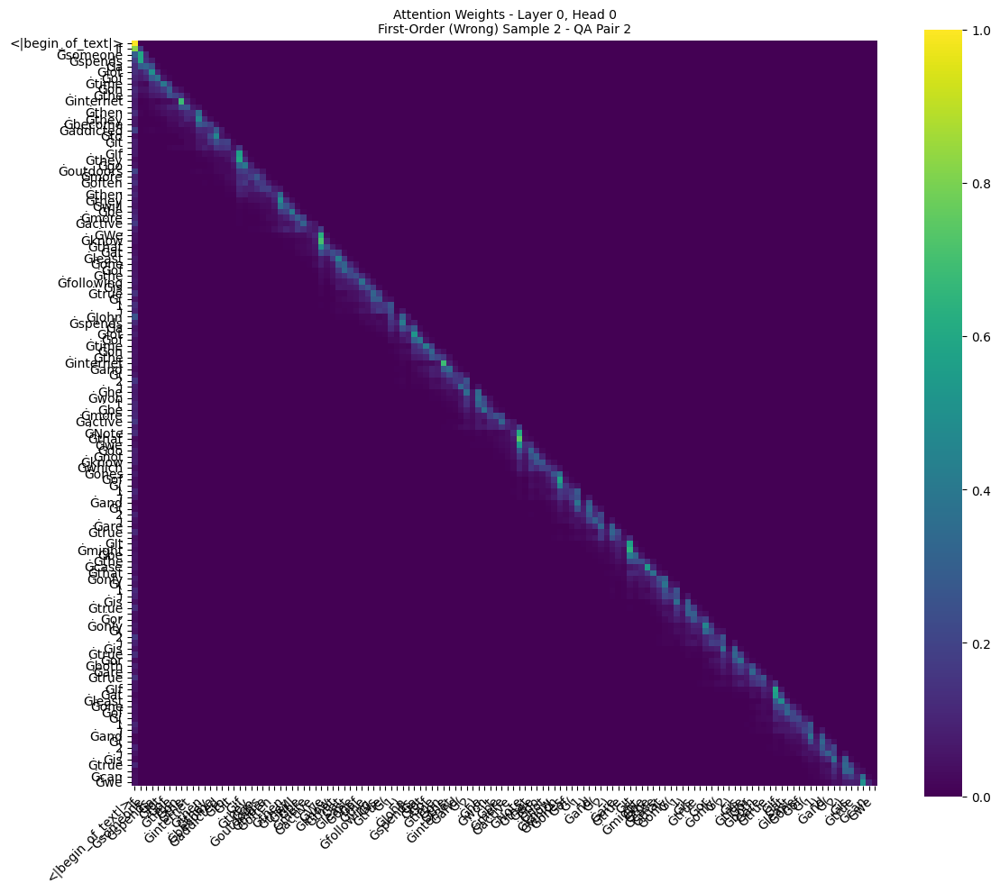

Predicted next word: ' conclude'
  Model's inferred next word: ' conclude'

  QA Pair 3: If at least one of (1) and (2) is true, can we say, at least one of the following must always be true? (a) he becomes addicted to it and (b) he goes outdoors more often
  Correct Answer: True


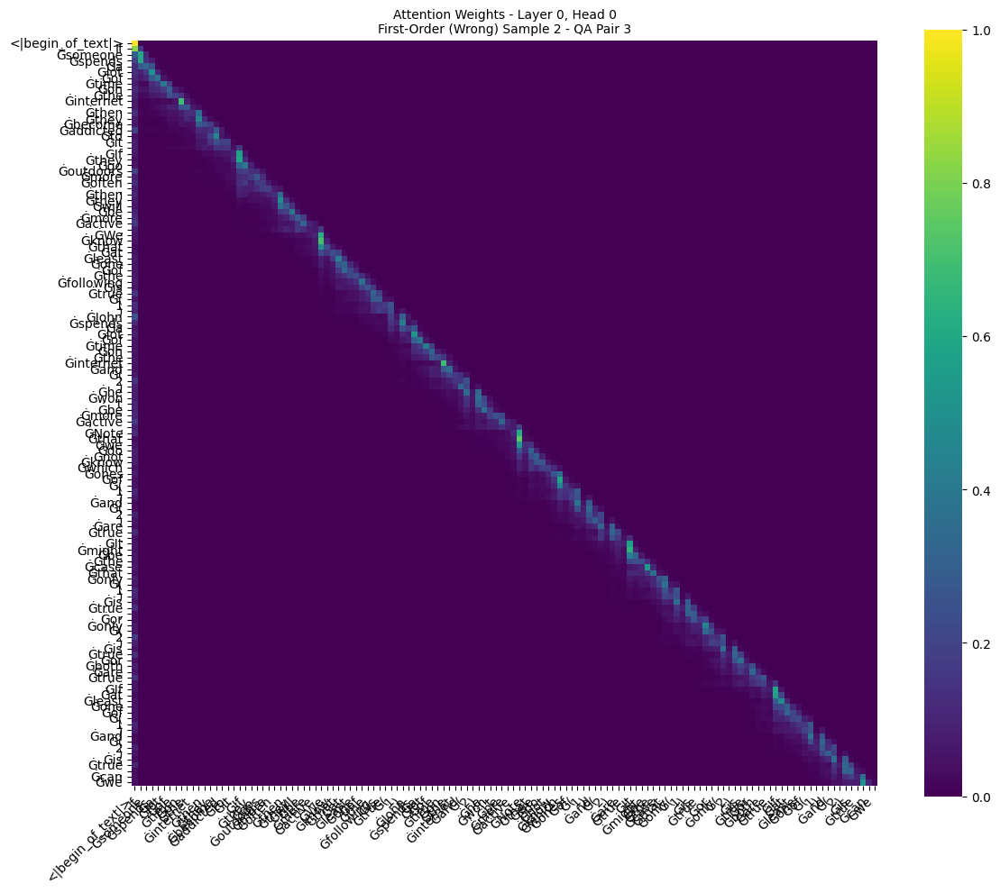

Predicted next word: ' conclude'
  Model's inferred next word: ' conclude'

  QA Pair 4: If at least one of (1) and (2) is true, can we say, at least one of the following must always be true? (a) he doesn't become addicted to it and (b) he doesn't go outdoors more often
  Correct Answer: True


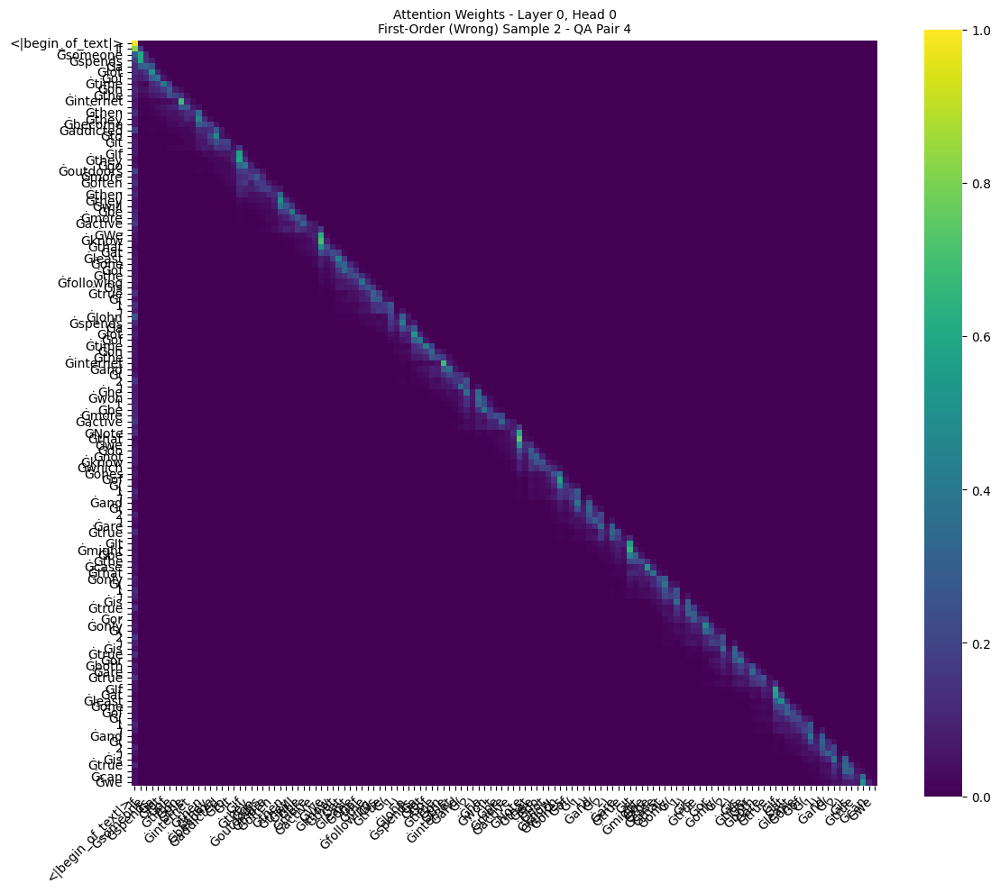

Predicted next word: ' conclude'
  Model's inferred next word: ' conclude'

Sample 3 Context: If someone goes to bed early, then they will wake up feeling refreshed. If they stay up late, then they will feel tired. We know that at least one of the following is true (1) Mark goes to bed early and (2) he won't feel tired. Note that we do not know which ones of (1) and (2) are true. It might be the case that only (1) is true, or only (2) is true or both are true.


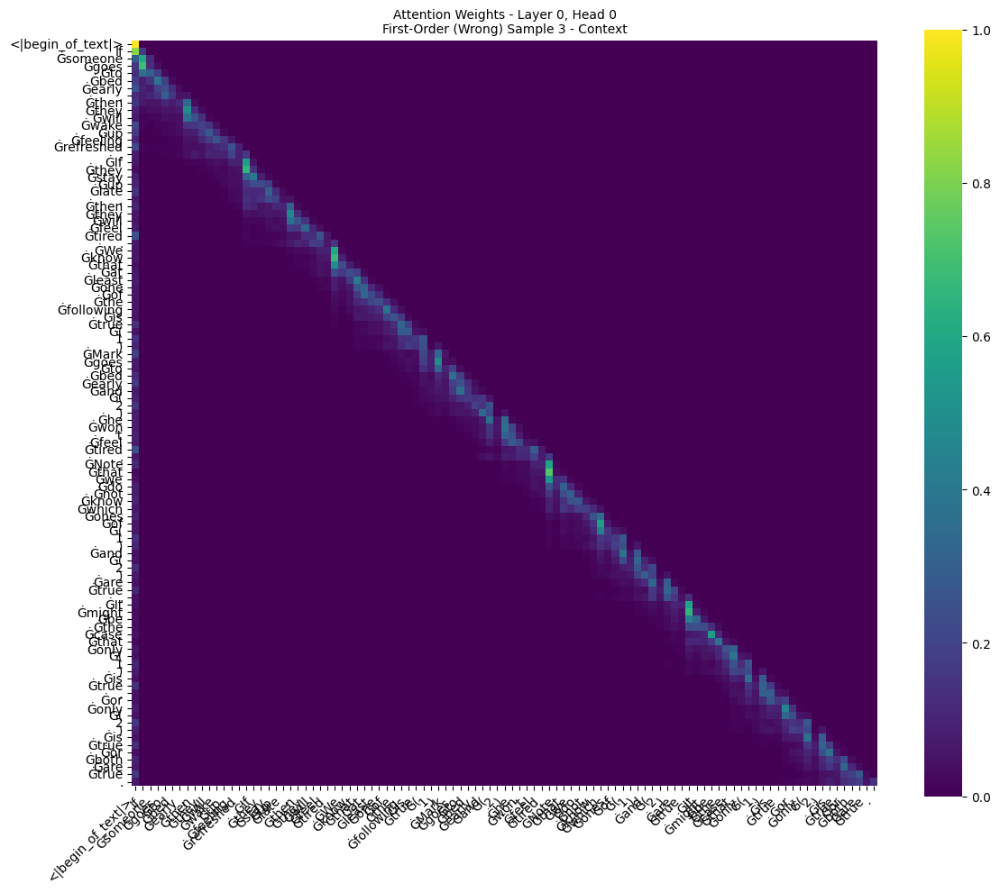

Predicted next word: '<|begin_of_text|>'

  QA Pair 1: If at least one of (1) and (2) is true, can we say, at least one of the following must always be true? (a) he will wake up feeling refreshed and (b) he doesn't stay up late
  Correct Answer: False


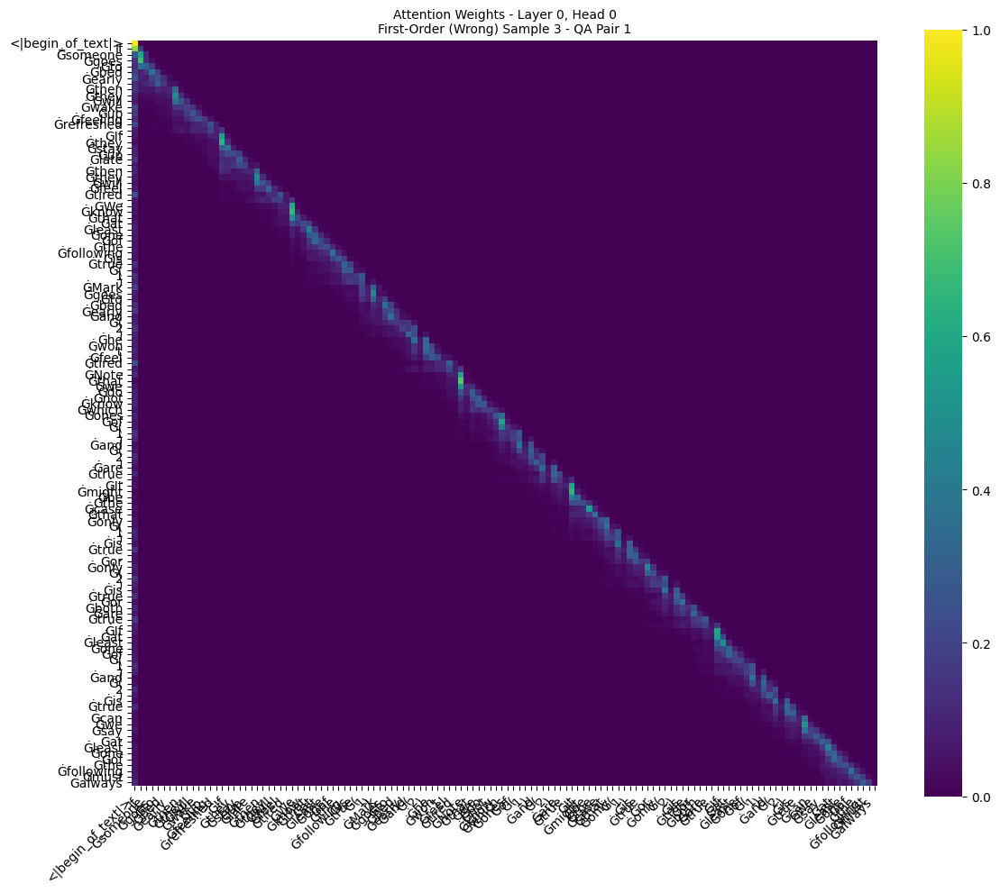

Predicted next word: ' be'
  Model's inferred next word: ' be'

  QA Pair 2: If at least one of (1) and (2) is true, can we say, at least one of the following must always be true? (a) he won't wake up feeling refreshed and (b) he stays up late
  Correct Answer: True


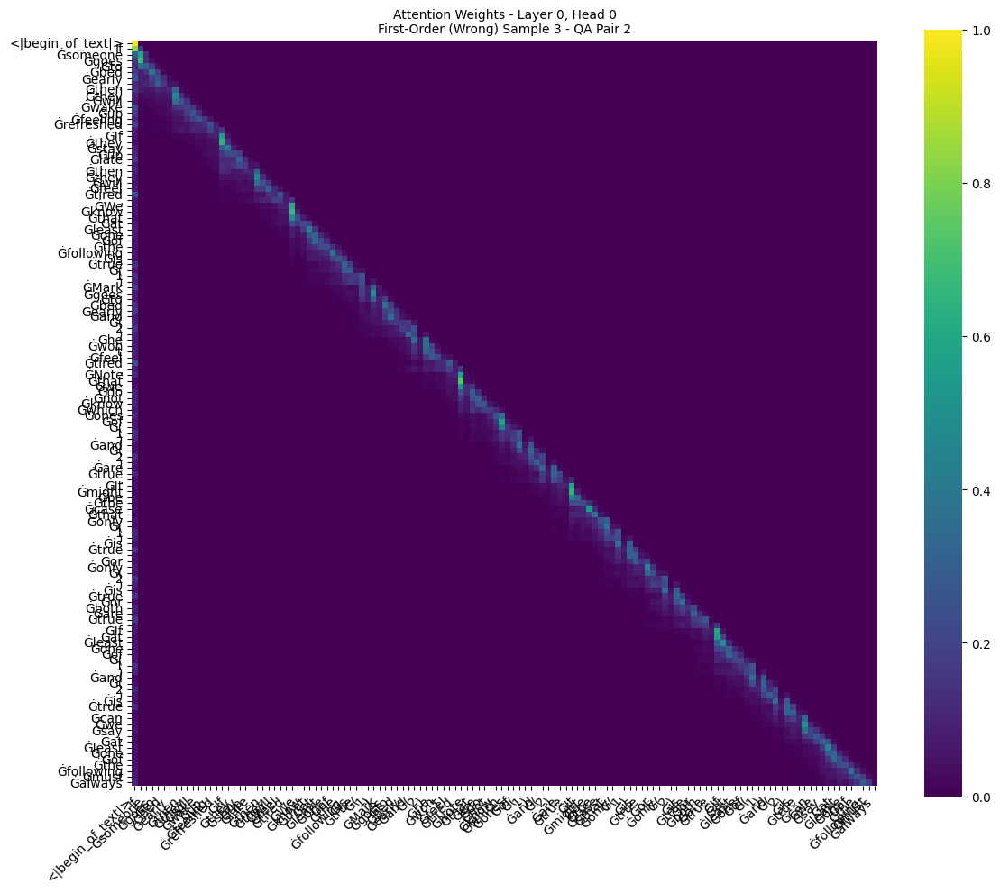

Predicted next word: ' be'
  Model's inferred next word: ' be'

  QA Pair 3: If at least one of (1) and (2) is true, can we say, at least one of the following must always be true? (a) he will wake up feeling refreshed and (b) he stays up late
  Correct Answer: True


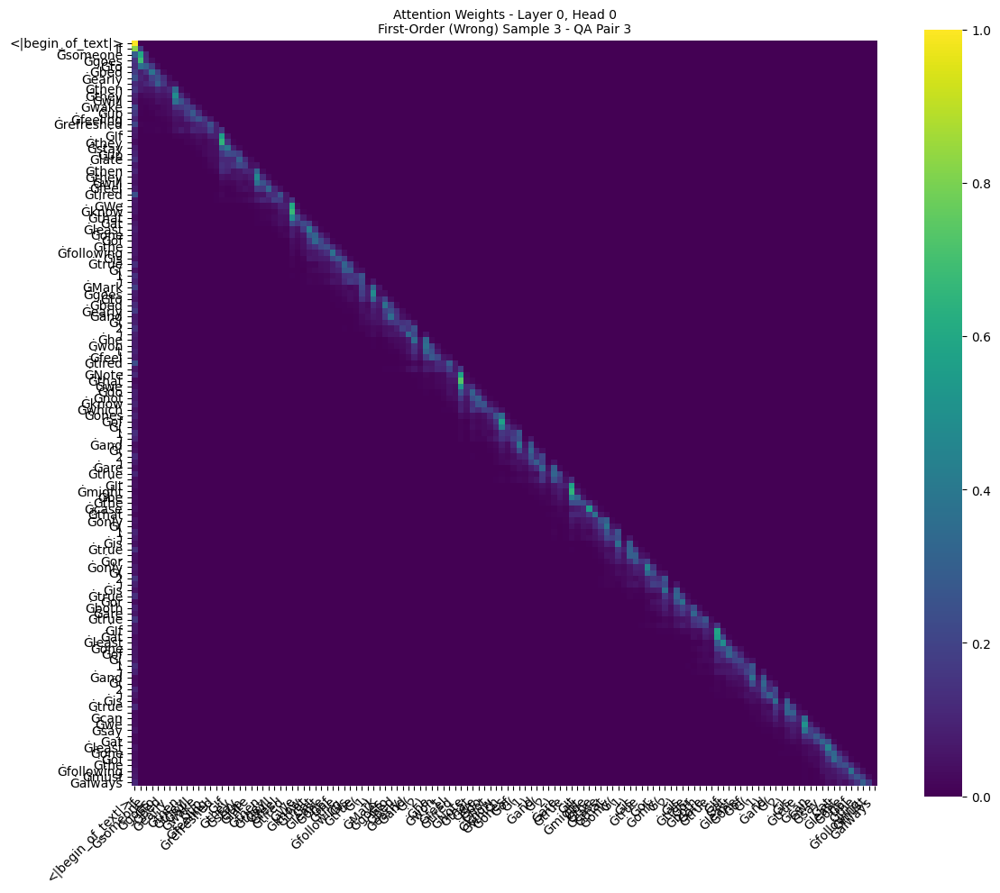

Predicted next word: ' be'
  Model's inferred next word: ' be'

  QA Pair 4: If at least one of (1) and (2) is true, can we say, at least one of the following must always be true? (a) he won't wake up feeling refreshed and (b) he doesn't stay up late
  Correct Answer: True


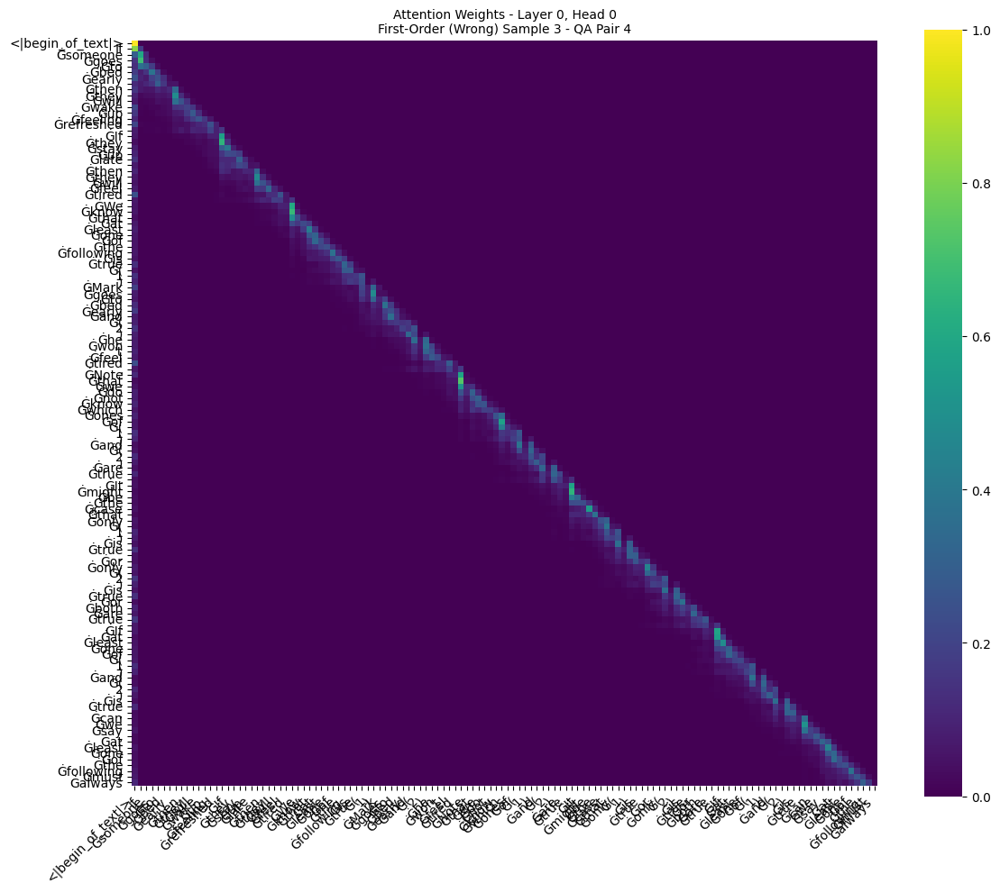

Predicted next word: ' be'
  Model's inferred next word: ' be'

Sample 4 Context: If someone drives a car, then they will reach the destination quickly. If they take a bus, then they will reach the destination after a long time. We know that at least one of the following is true (1) Tom drives a car and (2) he won't reach the destination after a long time. Note that we do not know which ones of (1) and (2) are true. It might be the case that only (1) is true, or only (2) is true or both are true.


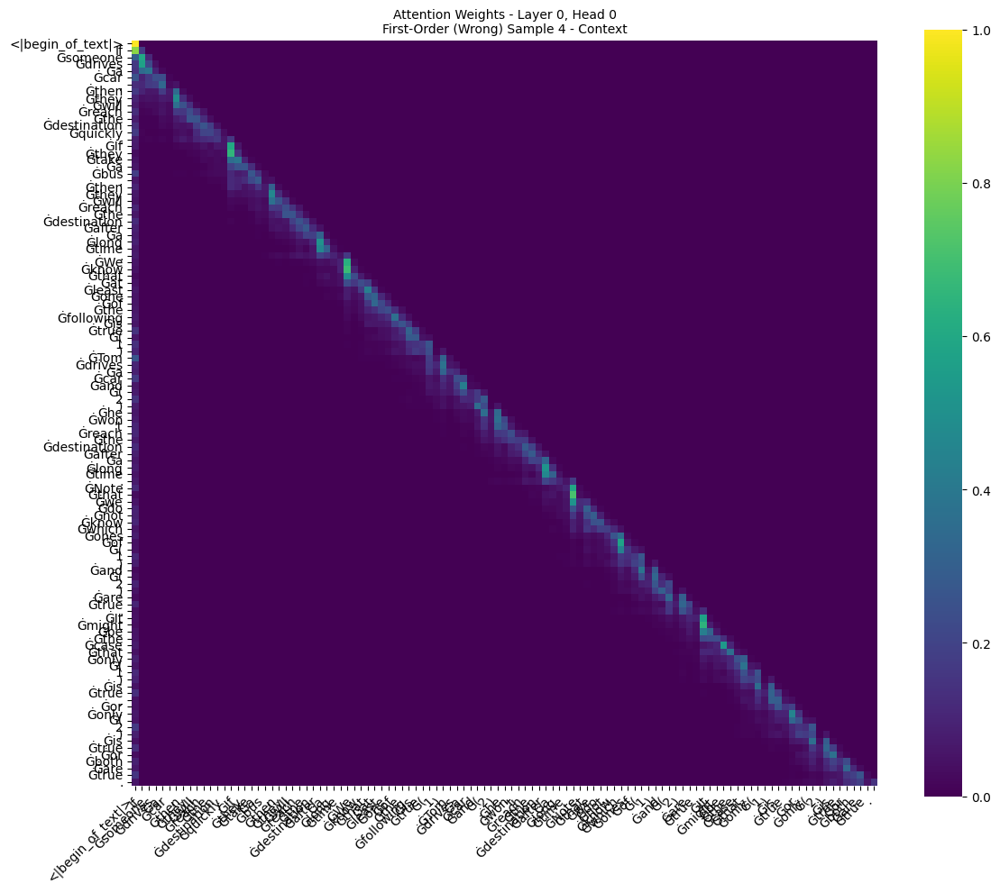

Predicted next word: '<|begin_of_text|>'

  QA Pair 1: If at least one of (1) and (2) is true, can we say, at least one of the following must always be true? (a) he will reach the destination quickly and (b) he doesn't take a bus
  Correct Answer: False


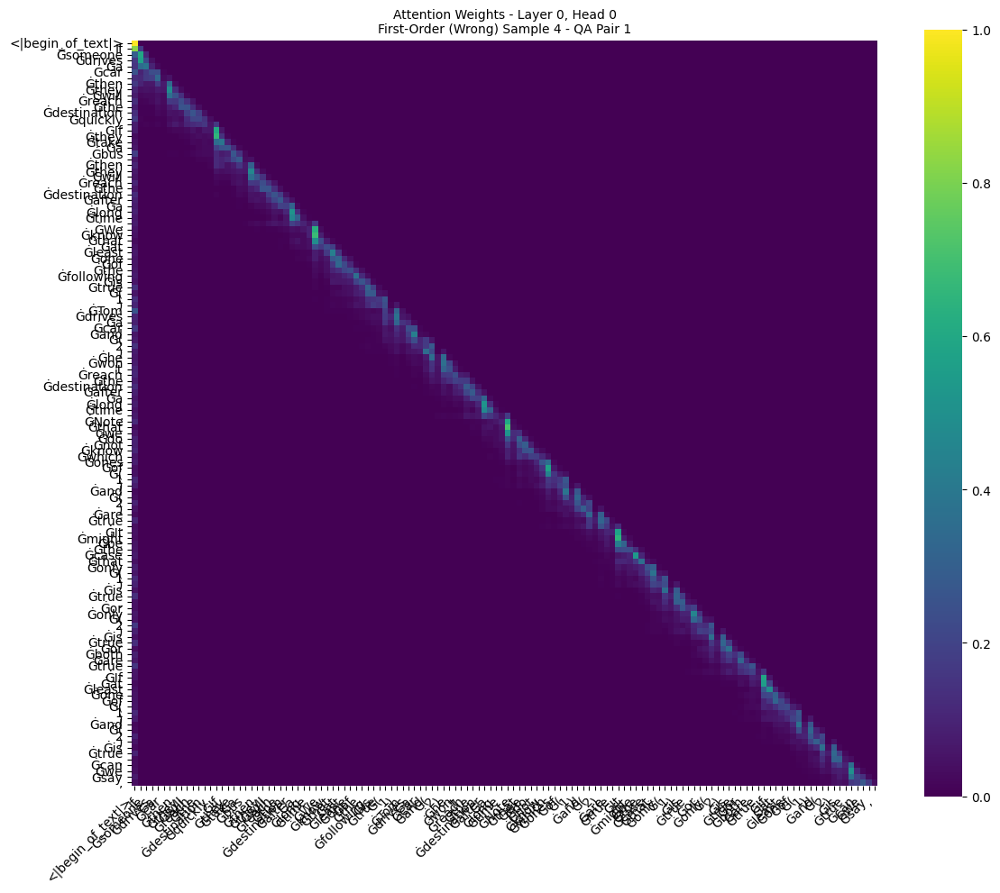

Predicted next word: ' "'
  Model's inferred next word: ' "'

  QA Pair 2: If at least one of (1) and (2) is true, can we say, at least one of the following must always be true? (a) he won't reach the destination quickly and (b) he takes a bus
  Correct Answer: True


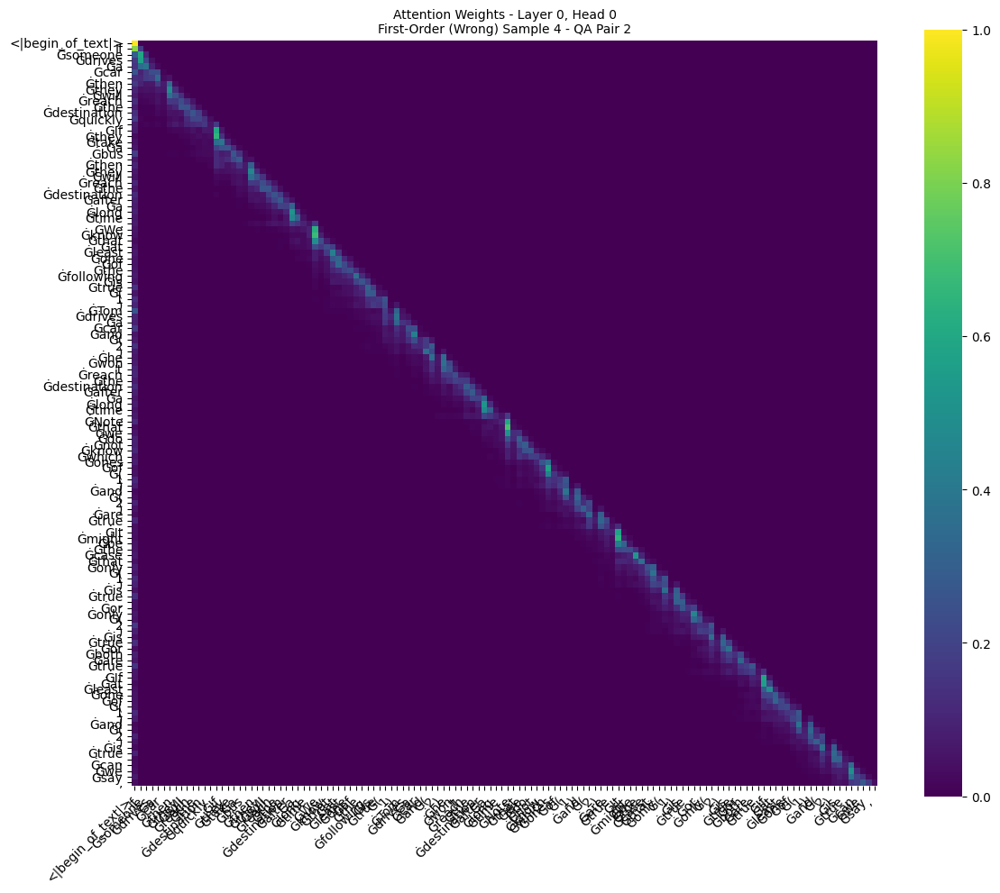

Predicted next word: ' "'
  Model's inferred next word: ' "'

  QA Pair 3: If at least one of (1) and (2) is true, can we say, at least one of the following must always be true? (a) he will reach the destination quickly and (b) he takes a bus
  Correct Answer: True


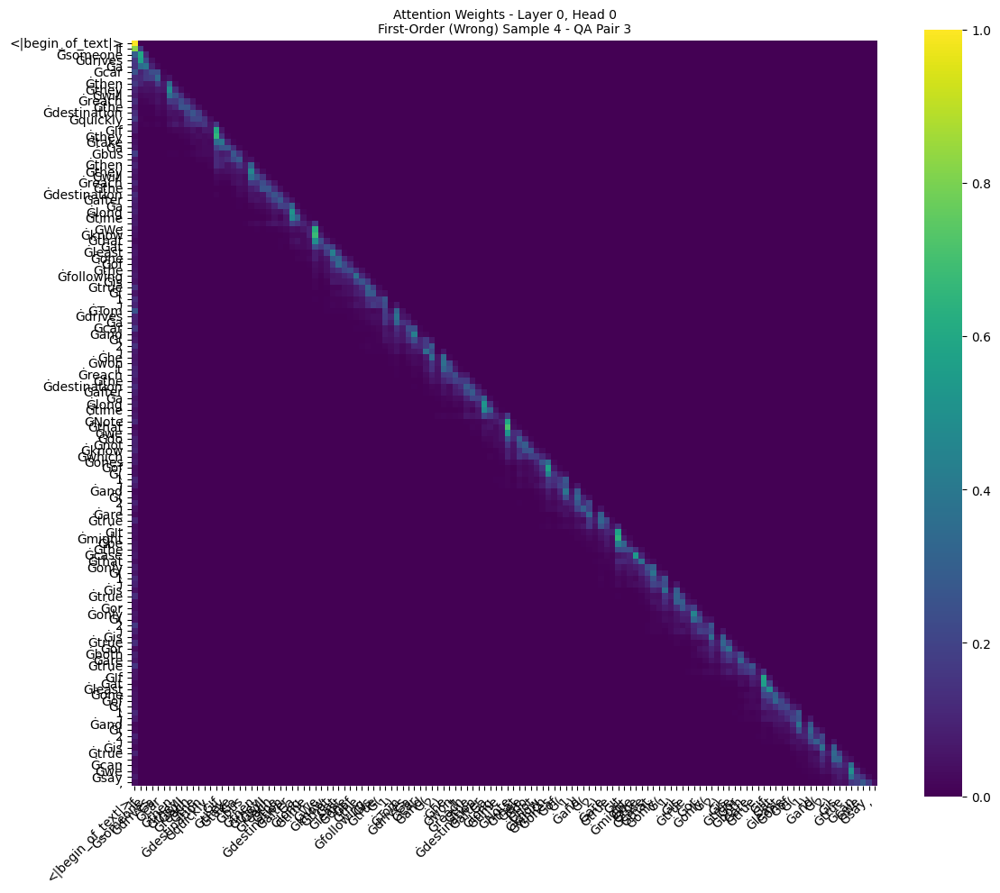

Predicted next word: ' "'
  Model's inferred next word: ' "'

  QA Pair 4: If at least one of (1) and (2) is true, can we say, at least one of the following must always be true? (a) he won't reach the destination quickly and (b) he doesn't take a bus
  Correct Answer: True


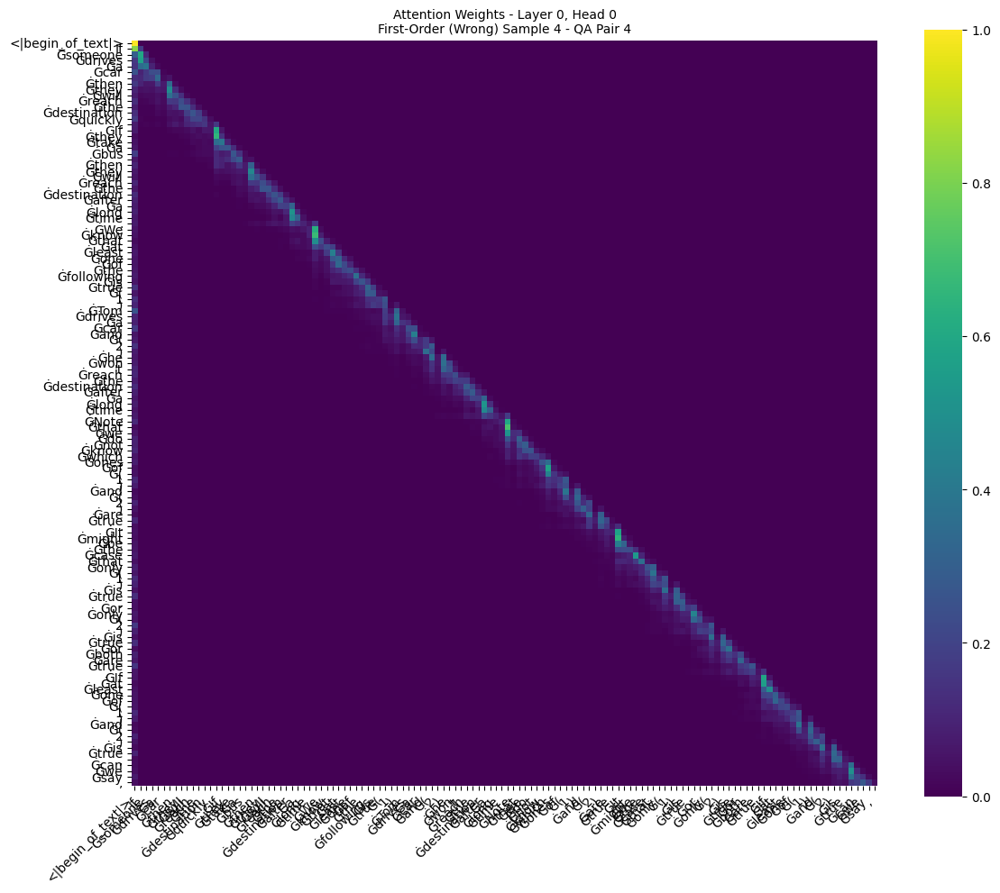

Predicted next word: ' "'
  Model's inferred next word: ' "'

Sample 5 Context: If someone turns off their phone, then they will be more productive. If they keep their phone on, then they will be distracted. We know that at least one of the following is true (1) John turned off his phone and (2) he will not be distracted. Note that we do not know which ones of (1) and (2) are true. It might be the case that only (1) is true, or only (2) is true or both are true.


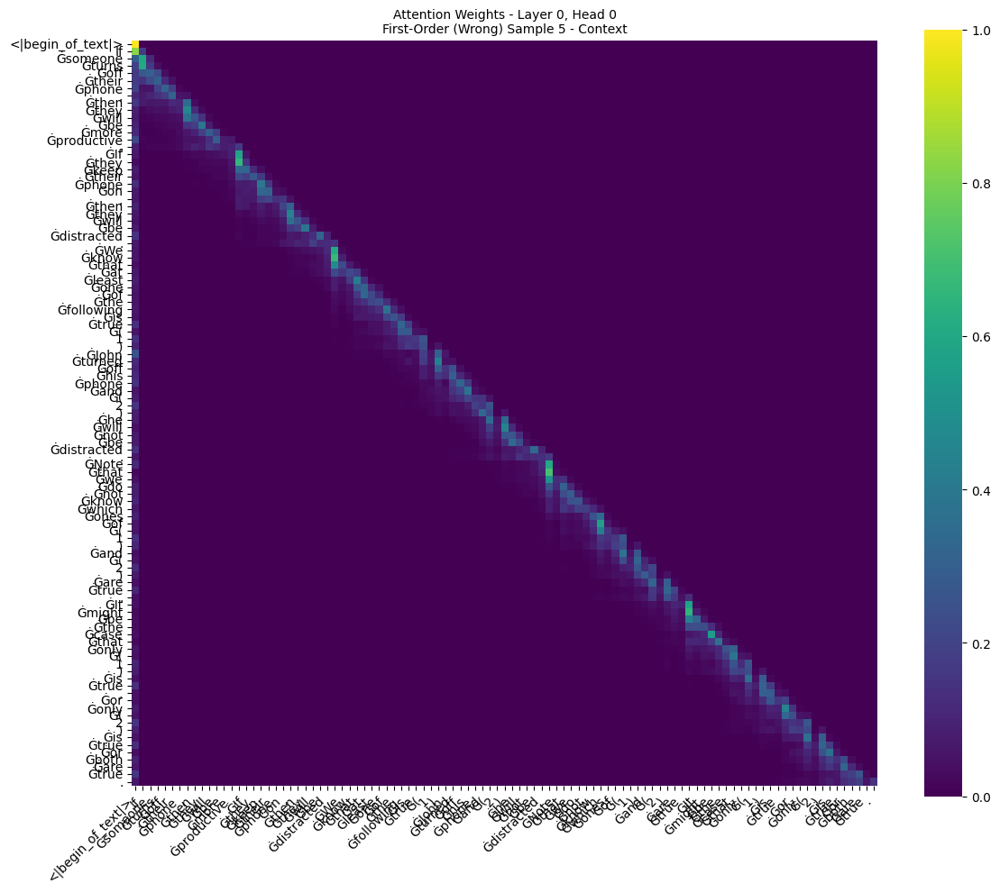

Predicted next word: '<|begin_of_text|>'

  QA Pair 1: If at least one of (1) and (2) is true, can we say, at least one of the following must always be true? (a) he will be more productive and (b) he doesn't keep his phone on
  Correct Answer: False


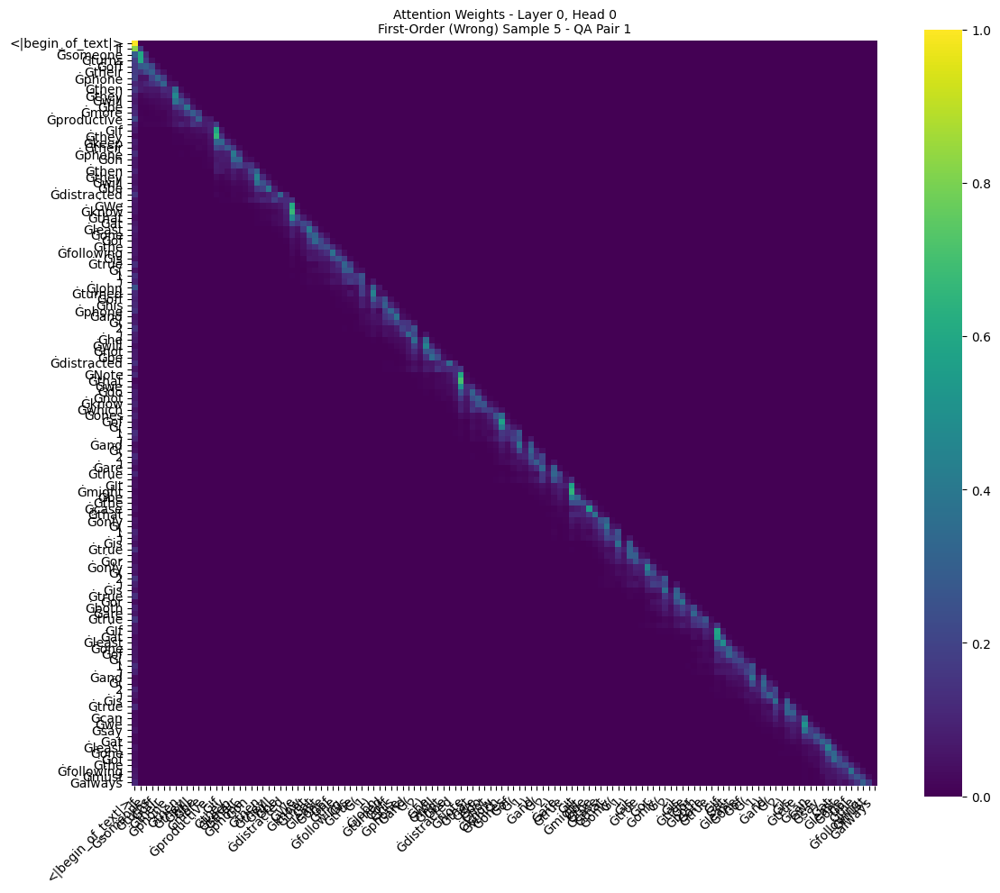

Predicted next word: ' be'
  Model's inferred next word: ' be'

  QA Pair 2: If at least one of (1) and (2) is true, can we say, at least one of the following must always be true? (a) he won't be more productive and (b) he keeps his phone on
  Correct Answer: True


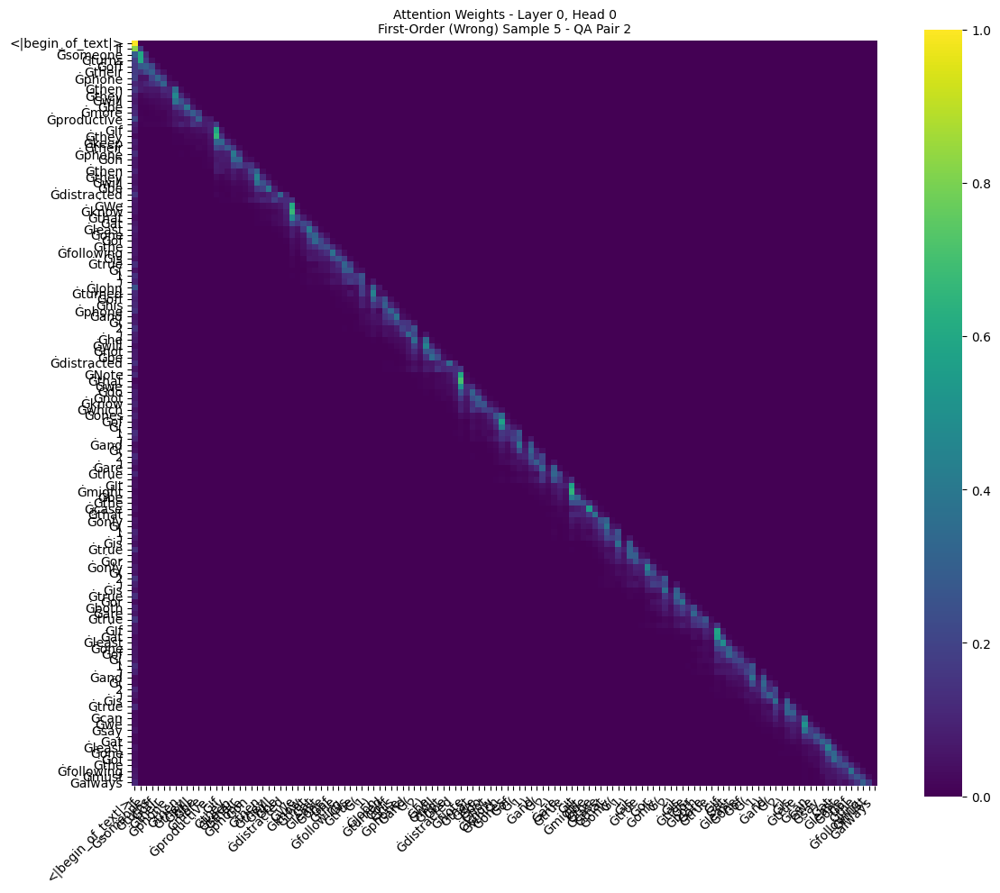

Predicted next word: ' be'
  Model's inferred next word: ' be'

  QA Pair 3: If at least one of (1) and (2) is true, can we say, at least one of the following must always be true? (a) he will be more productive and (b) he keeps his phone on
  Correct Answer: True


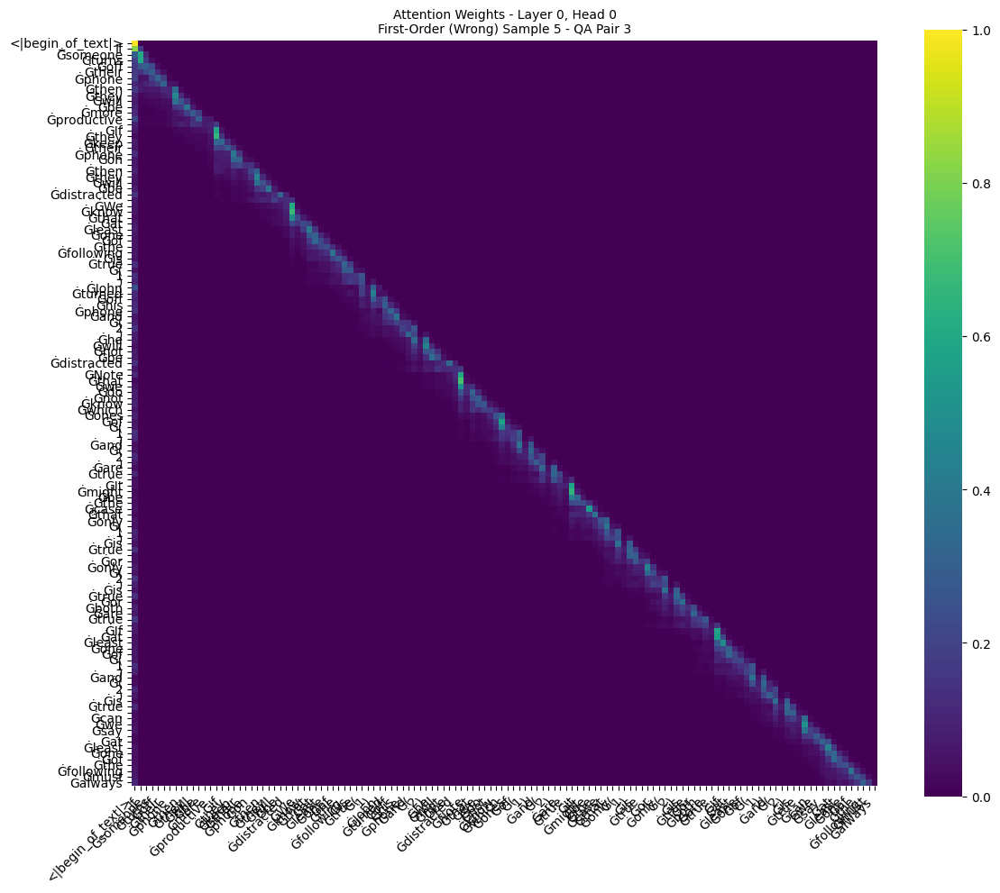

Predicted next word: ' be'
  Model's inferred next word: ' be'

  QA Pair 4: If at least one of (1) and (2) is true, can we say, at least one of the following must always be true? (a) he won't be more productive and (b) he doesn't keep his phone on
  Correct Answer: True


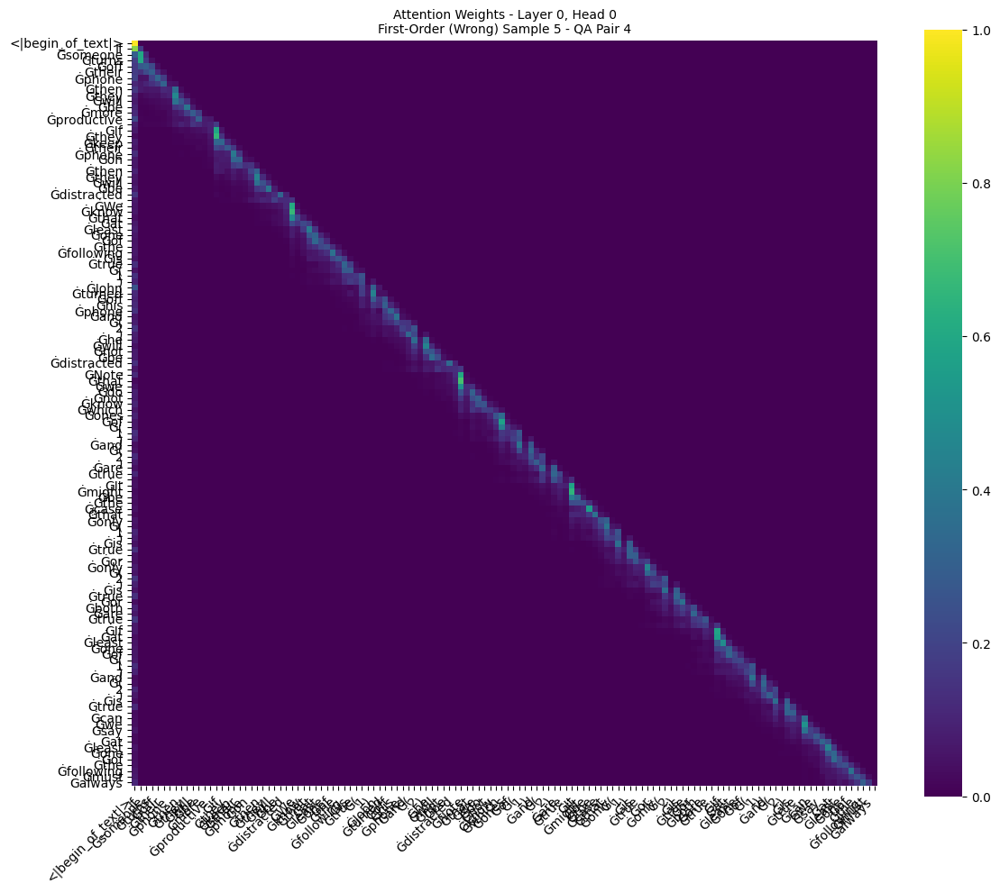

Predicted next word: ' be'
  Model's inferred next word: ' be'


In [11]:
process_samples(first_order_data_wrong, "First-Order (Wrong)")



Processing LogiQA (Correct) samples...

Sample 1 Context: I agree that Hogan's actions resulted in grievous injury to Winters. And I do not deny that Hogan fully realized the nature of his actions and the effects that they would have. Indeed, I would not disagree if you pointed out that intentionally causing such effects is reprehensible, other things being equal. But in asking you to concur with me that Hogan's actions not be wholly condemned I emphasize again that Hogan mistakenly believed Winters to be the robber who had been terrorizing west-side apartment buildings for the past several months.


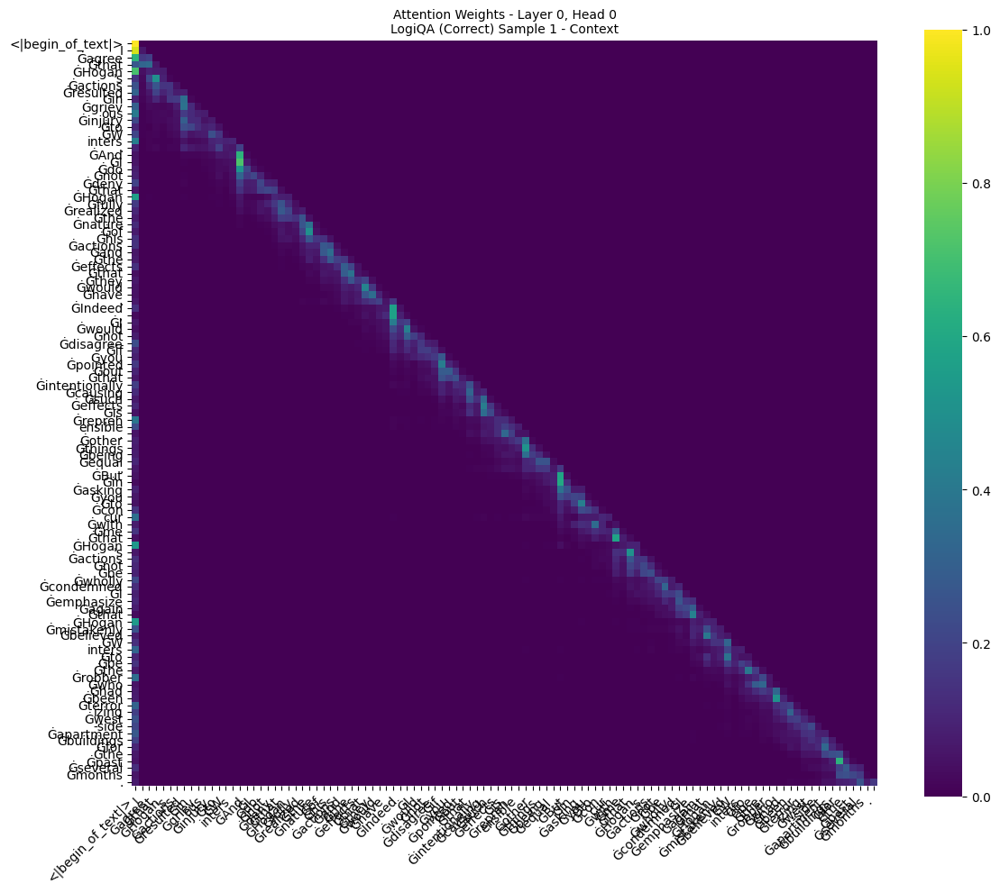

Predicted next word: '<|begin_of_text|>'

  Question: Which one of the following most accurately expresses the conclusion of the argument?
  Options: ['Hogan thought that Winters was the person who had been terrorizing west-side apartment buildings for the last few months.', "The robber who had been terrorizing west-side apartment buildings should be considered to be as responsible for Winters's injuries as Hogan.", 'The actions of Hogan that seriously injured Winters were reprehensible, other things being equal.', 'The actions of Hogan that seriously injured Winters are not completely blameworthy.']
  Correct Answer: The actions of Hogan that seriously injured Winters are not completely blameworthy. (index 3)


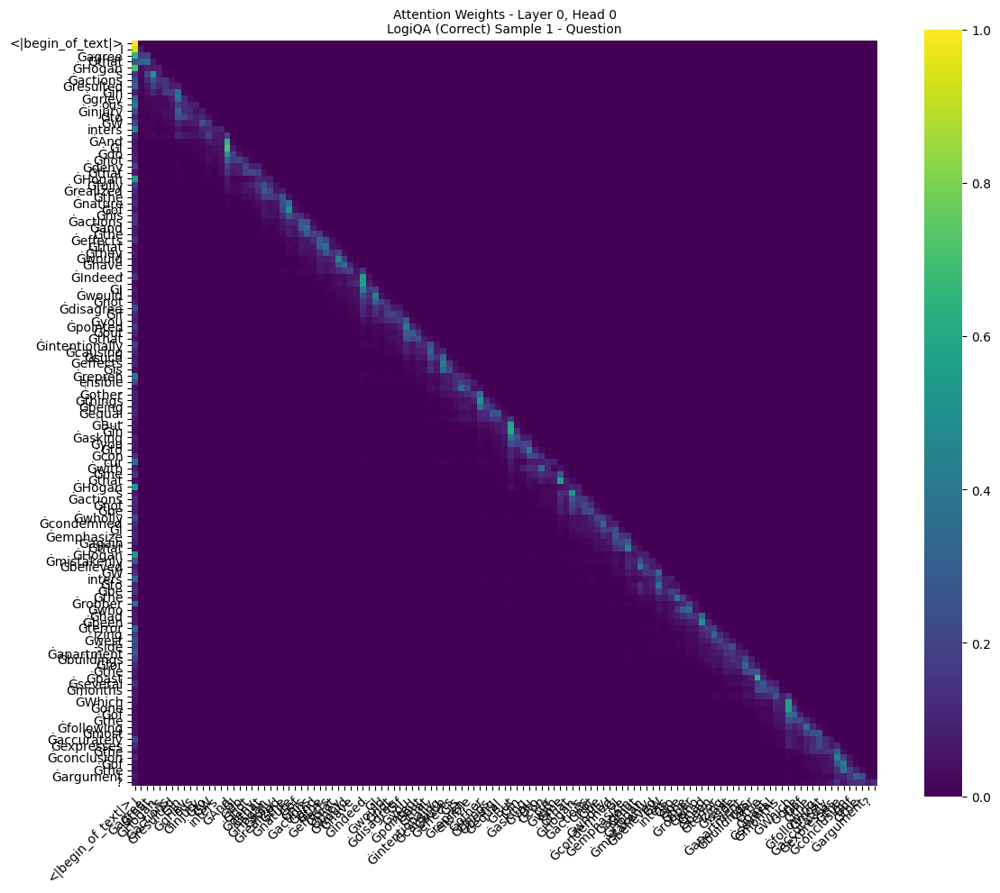

Predicted next word: '<|begin_of_text|>'
  Model's inferred next word: '<|begin_of_text|>'

Sample 2 Context: Raymond Burr played the role of Perry Mason on television. Burr's death in 1993 prompted a prominent lawyer to say, Although not a lawyer, Mr. Burr strove for such authenticity that we feel as if we lost one of our own. This comment from a prestigious attorney provides appalling evidence that, in the face of television, even some legal professionals are losing their ability to distinguish fiction from reality.


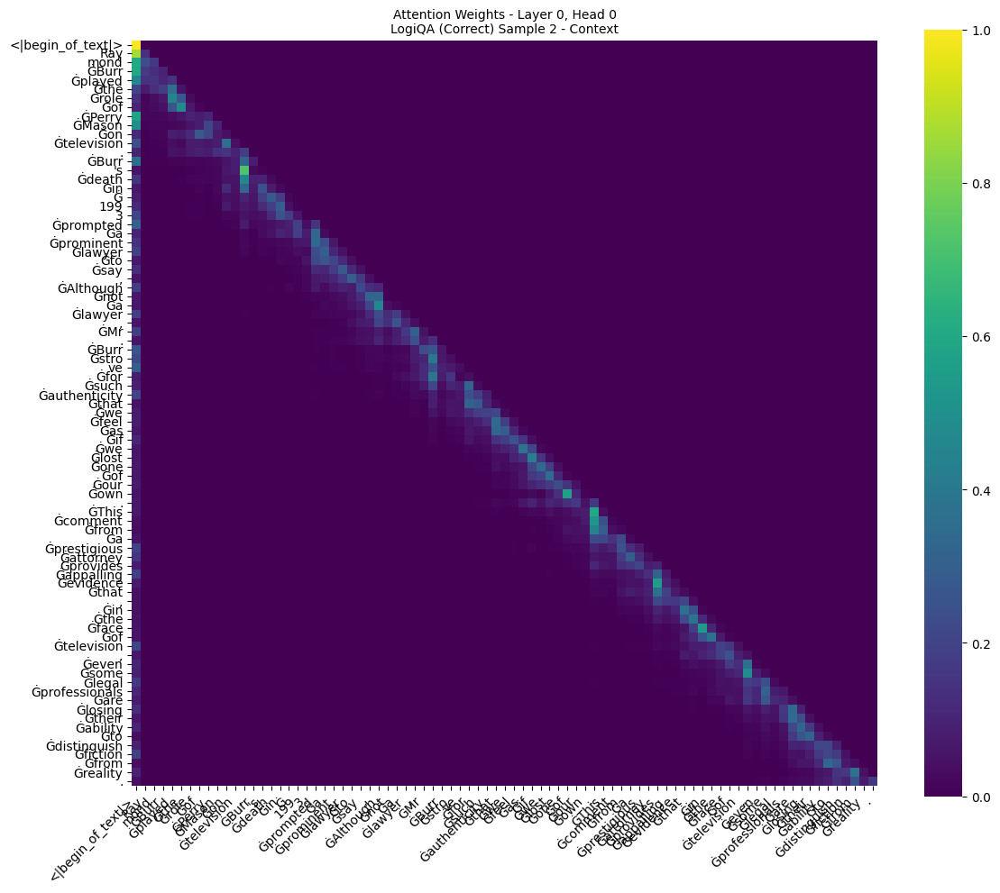

Predicted next word: '<|begin_of_text|>'

  Question: The reasoning in the argument is flawed because the argument
  Options: ['presumes that the lawyer is qualified to evaluate the performance of an actor', 'takes the views of one lawyer to represent the views of all lawyers', "criticizes the lawyer rather than the lawyer's statement", "ignores the part of the lawyer's remark that indicates an awareness of the difference between reality and fiction"]
  Correct Answer: ignores the part of the lawyer's remark that indicates an awareness of the difference between reality and fiction (index 3)


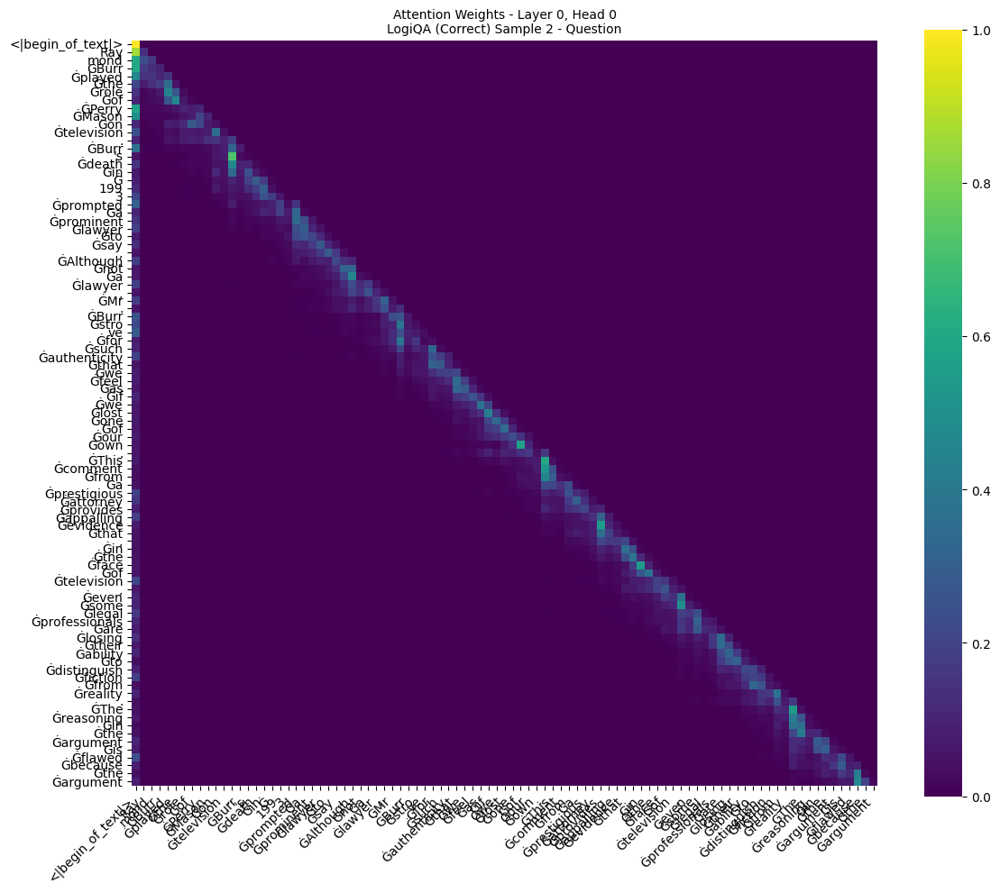

Predicted next word: '<|begin_of_text|>'
  Model's inferred next word: '<|begin_of_text|>'

Sample 3 Context: Nearly all employees of the factory who have completed their high school diploma have earned their factory safety certificate, having easily completed the eight week training course. The high school graduates who haven't earned the certificate are ones who have evening obligations that have prevented them from taking the course. Overall, though, most of the factory workers have not earned the certificate.


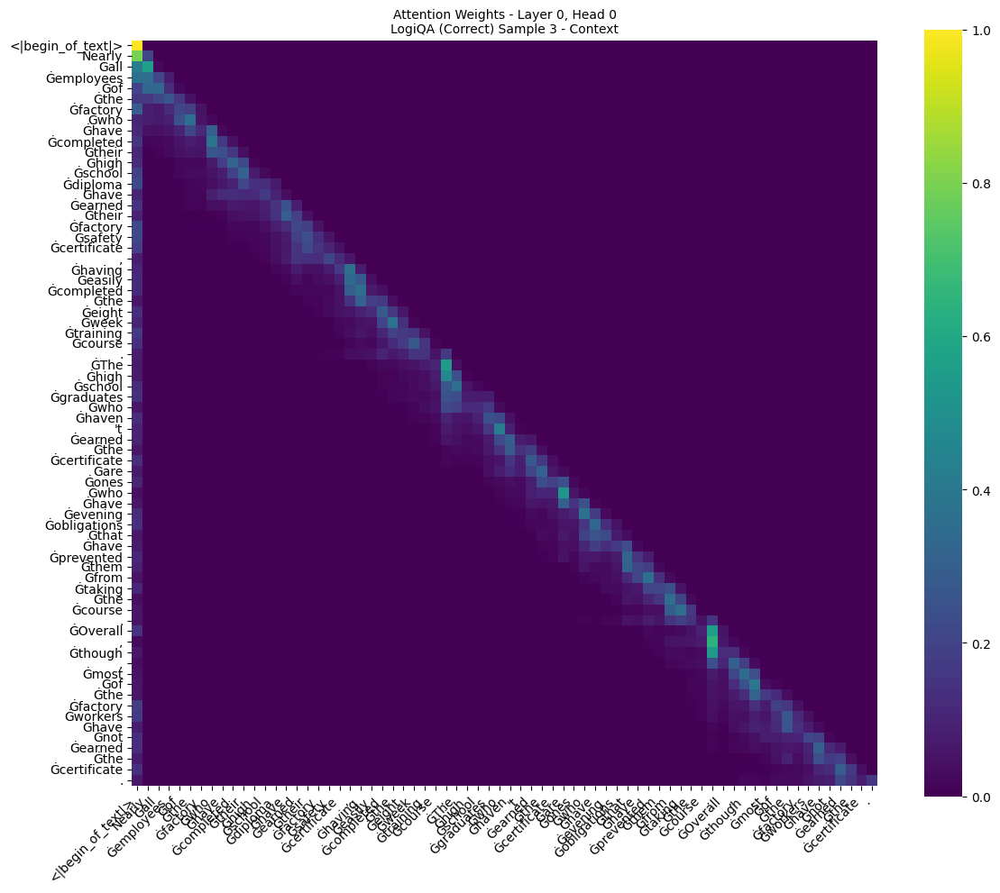

Predicted next word: '<|begin_of_text|>'

  Question: If the statements above are true, which one of the following also must be true?
  Options: ['A large proportion of the factory workers have not graduated from high school.', 'A large proportion of students with high school diplomas have evening obligations that have prevented them from taking the eight week training course.', 'Most of the workers who have earned the certificate are high school graduates.', 'No factory worker without a high school diploma has completed the course and earned the certificate.']
  Correct Answer: A large proportion of the factory workers have not graduated from high school. (index 0)


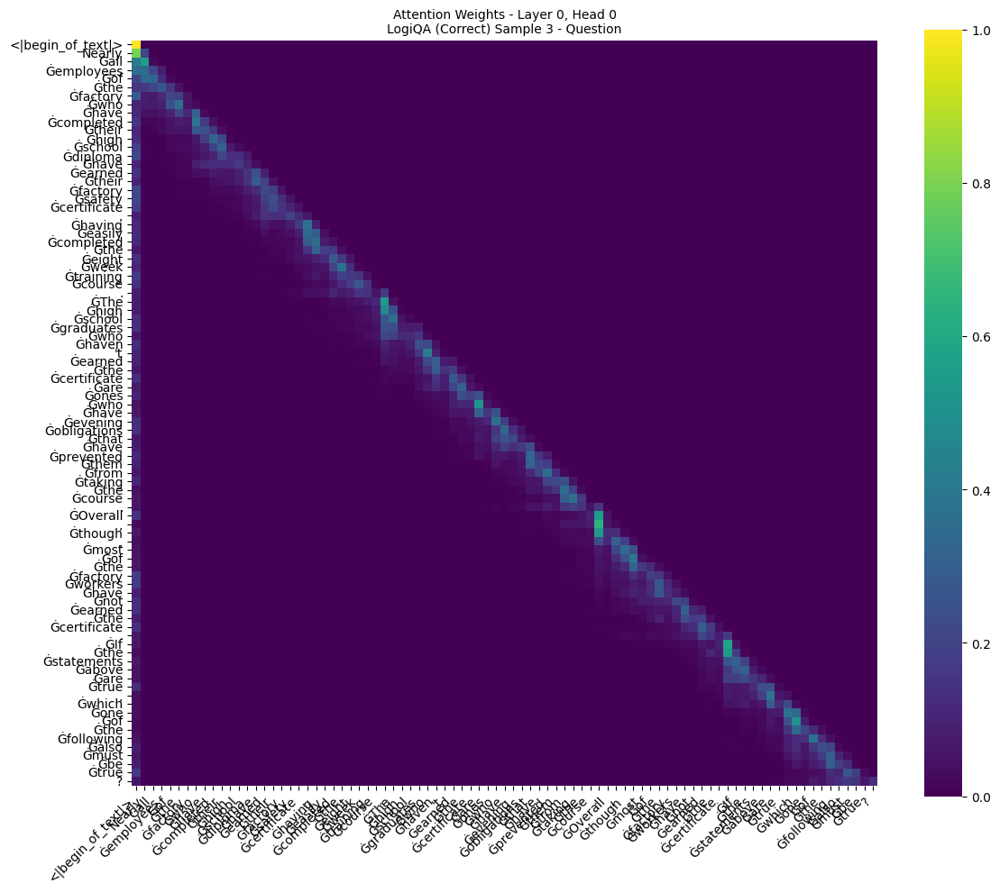

Predicted next word: '<|begin_of_text|>'
  Model's inferred next word: '<|begin_of_text|>'

Sample 4 Context: In modern society, although the number of marriages based on the premise of economic security and material comforts is rapidly decreasing, money decides everything and money worship is still deeply rooted in some people's minds. In modern society where love and marriage are free, parents still try to interfere in their children's marriage. Family background, educational background and working conditions are still the main reference factors. We can't help thinking: can money decide everything? Of course not. What is the most likely conclusion to be drawn from this passage?


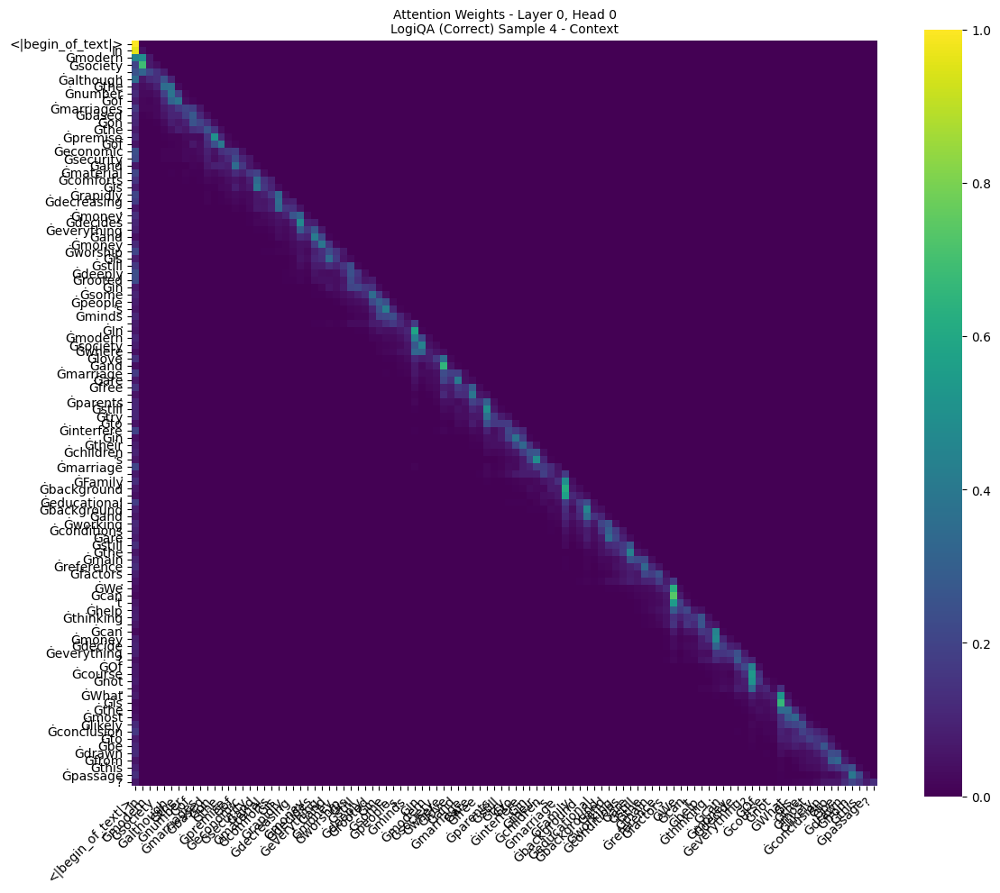

Predicted next word: '<|begin_of_text|>'

  Question: Which of the following is the most likely conclusion to be reached?
  Options: ['A marriage based purely on beauty and passion will be a failure and an unfortunate one', 'Affection is the most important factor in a marriage, not financial security or material comforts', 'Women in modern society need to enhance their status through wealth and status in marriage', 'In order to have a good marriage, we should have a correct view of marriage and attitude towards marriage']
  Correct Answer: In order to have a good marriage, we should have a correct view of marriage and attitude towards marriage (index 3)


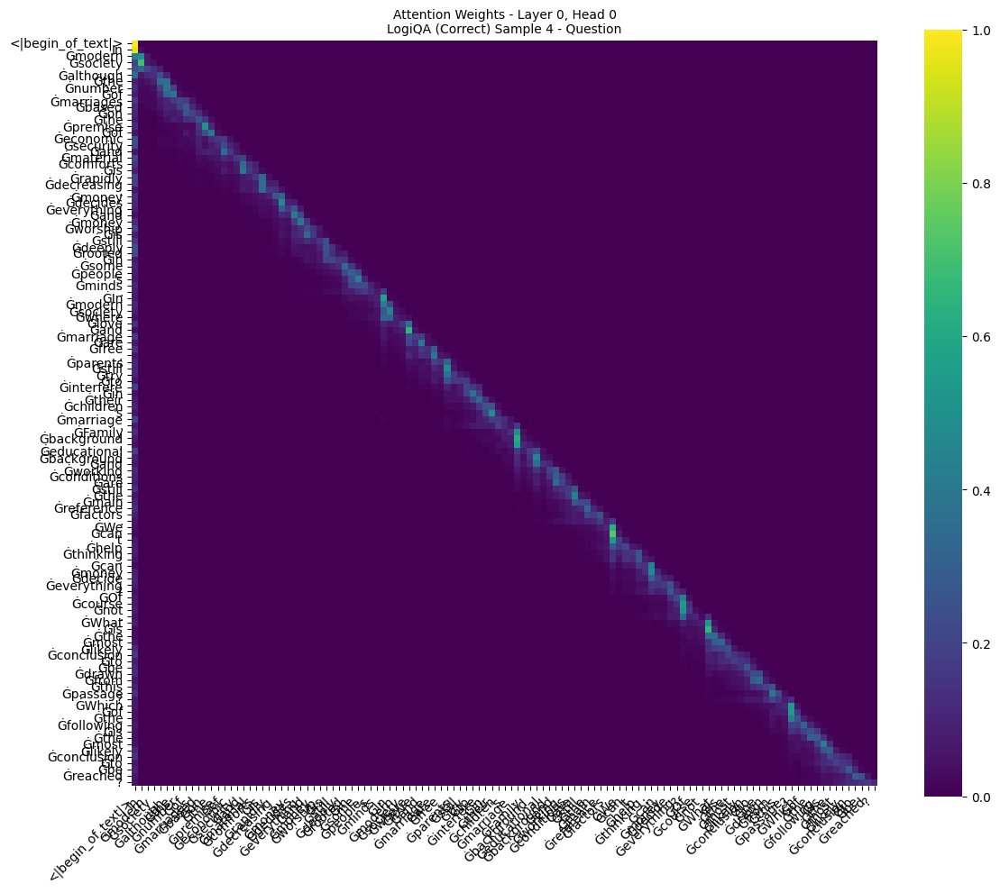

Predicted next word: '<|begin_of_text|>'
  Model's inferred next word: '<|begin_of_text|>'

Sample 5 Context: In Chinese traditional concept, sculpture has always been regarded as the same art form as painting. In Chinese traditional academics, there is only painting but not sculpture. This lack of attention in history led to the loss of a large number of stone carving works with high historical data research value overseas at the end of the 19th century and the beginning of the 20th century. Today, emerging collectors only focused on the wealth of art products, so the price of copper gilded Buddha statues in the Yuan, Ming and Qing Dynasties soared. It is a pity that when faced with those high ancient stone carvings that truly reflect the cultural and historical features of Chinese sculpture, they are somewhat timid and indecisive.


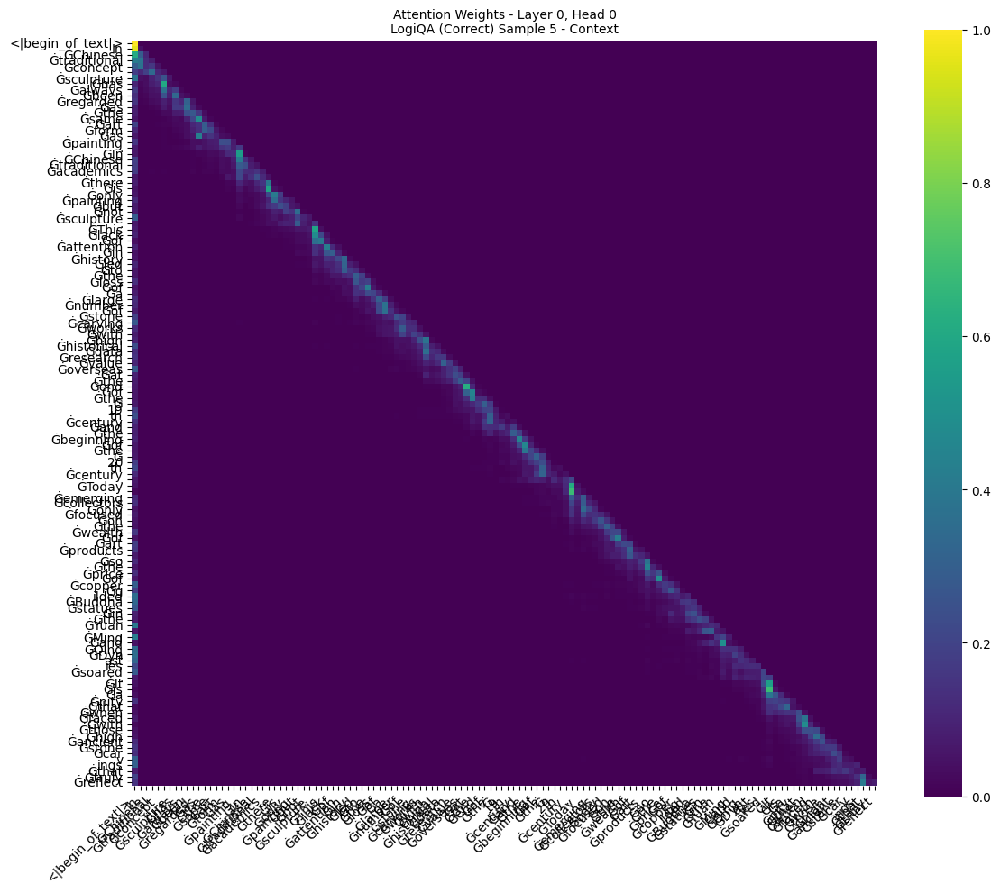

Predicted next word: ' the'

  Question: Which one of the followings is the main idea of this paragraph?
  Options: ['Pay attention to the significance of sculpture art in concept.', 'Reasons why ancient stone carvings are not valued in China.', 'At present, the immature mentality of sculpture collectors.', 'The deviation between the price and value of sculpture collections.']
  Correct Answer: At present, the immature mentality of sculpture collectors. (index 2)


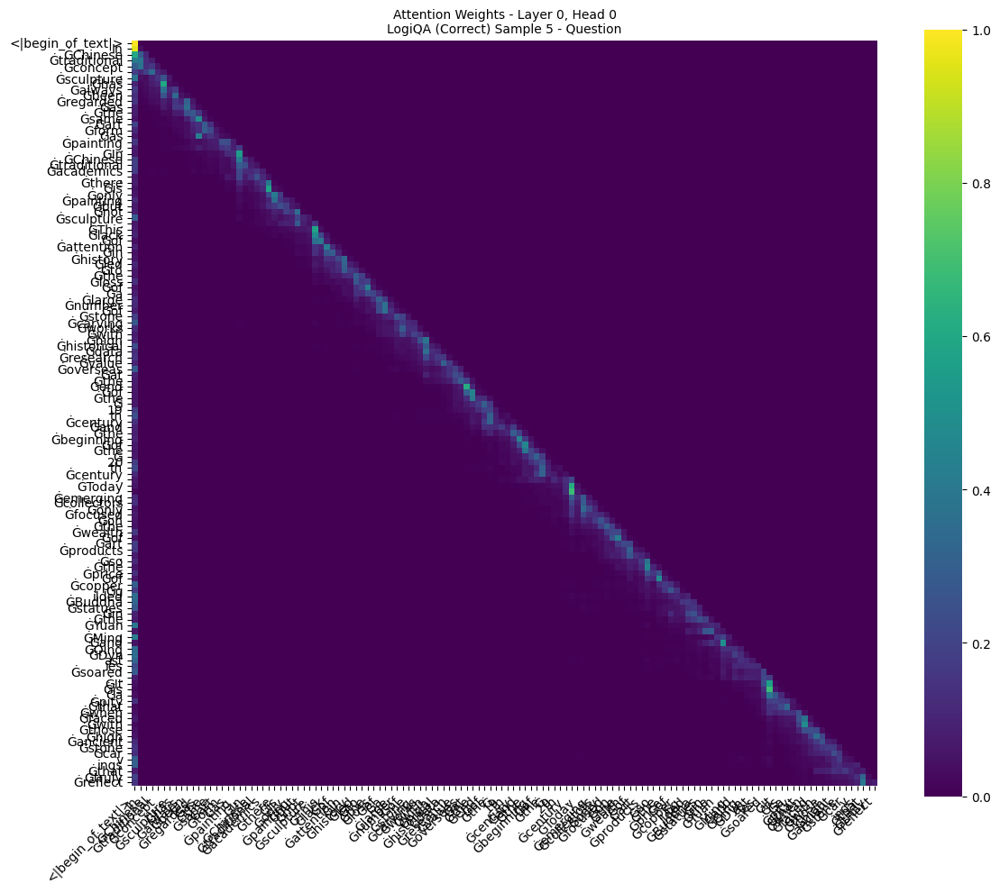

Predicted next word: ' the'
  Model's inferred next word: ' the'


In [12]:
process_samples(logiqa_data_correct, "LogiQA (Correct)")



Processing LogiQA (Wrong) samples...

Sample 1 Context: Jupiter is a gas giant planet and the largest planet in the solar system. Its mass is 2.5 times the total mass of the other seven planets in the solar system. Observations have found that most of the more than 70 moons surrounding Jupiter are composed of water ice. Therefore, Jupiter's atmosphere should contain a considerable amount of water.


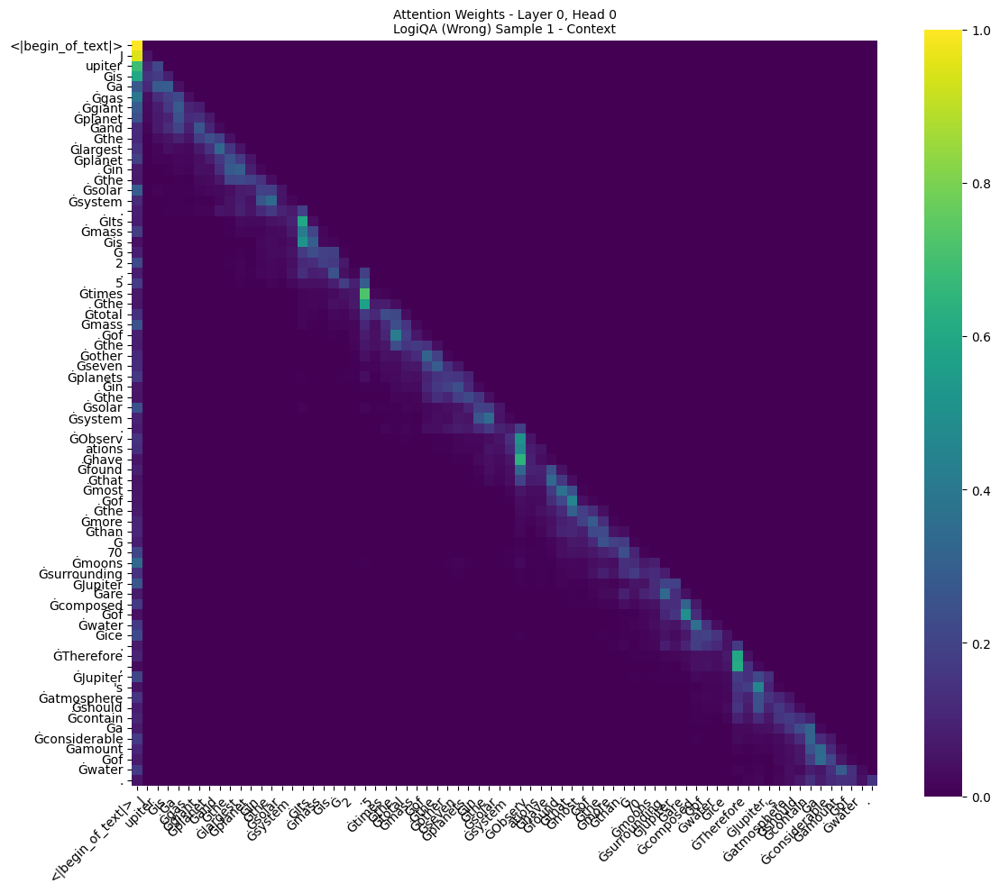

Predicted next word: '<|begin_of_text|>'

  Question: Which of the followings, if true, can best support the above statement?
  Options: ['After hundreds of millions of years, the satellite may slowly fall onto the planet.', 'Many of the water in interstellar space exists in gaseous form.', 'Uranus is also a gas giant planet, and it has been confirmed that it contains a lot of water ice.', 'The satellite and the planets around it were formed from the same gas and dust at the same time.']
  Correct Answer: Many of the water in interstellar space exists in gaseous form. (index 1)


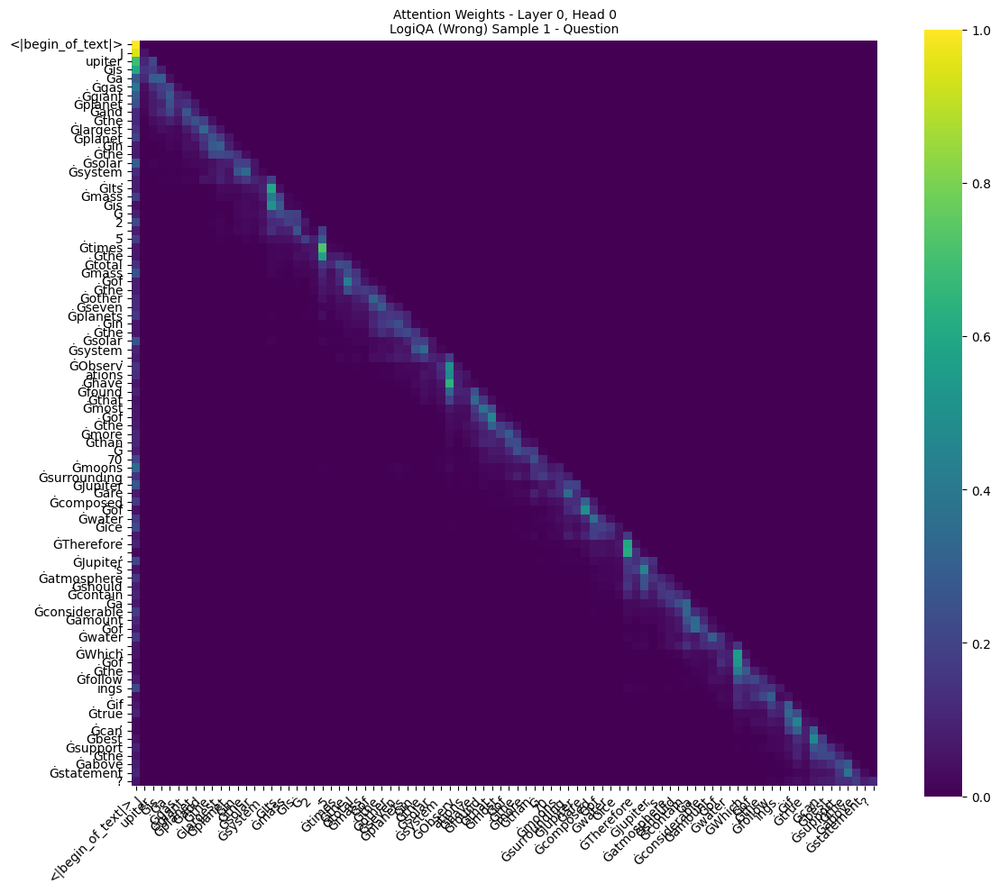

Predicted next word: '<|begin_of_text|>'
  Model's inferred next word: '<|begin_of_text|>'

Sample 2 Context: All Anxi people are vegetarians, while all Zhenyuan people are ascetics. Ascetics and vegetarians are like fire and water, and there is no conflict. Guo Shu is an ascetic.


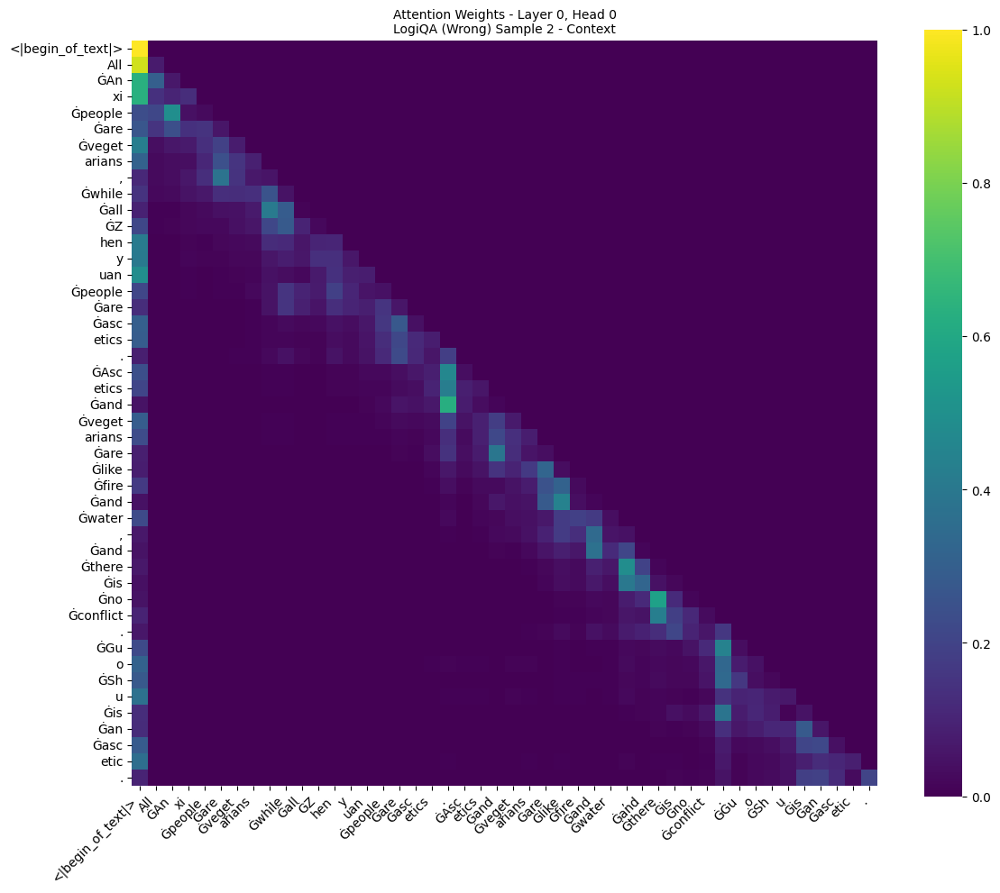

Predicted next word: '<|begin_of_text|>'

  Question: Which of the followings can be inferred?
  Options: ['Guo Shu is from Zhenyuan', 'Guo Shu is not from Zhenyuan', 'Guo Shu is from Anxi', 'Guo Shu is not from Anxi']
  Correct Answer: Guo Shu is from Anxi (index 2)


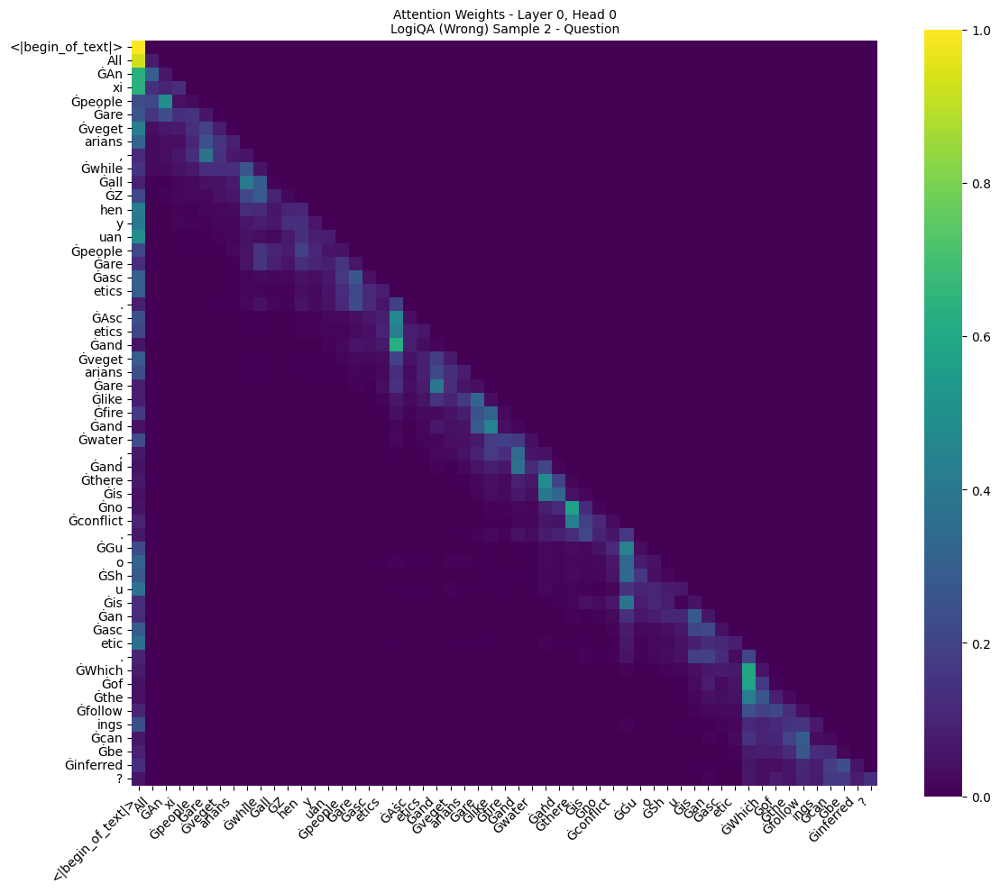

Predicted next word: '<|begin_of_text|>'
  Model's inferred next word: '<|begin_of_text|>'

Sample 3 Context: The medieval Arabs had many manuscripts of the ancient Greek. When needed, they translate them into Arabic. Medieval Arab philosophers were very interested in Aristotle's Theory of Poetry, which was obviously not shared by Arab poets, because a poet interested in it must want to read Homer's poems. Aristotle himself often quotes Homer's poems. However, Homer's poems were not translated into Arabic until modern times.


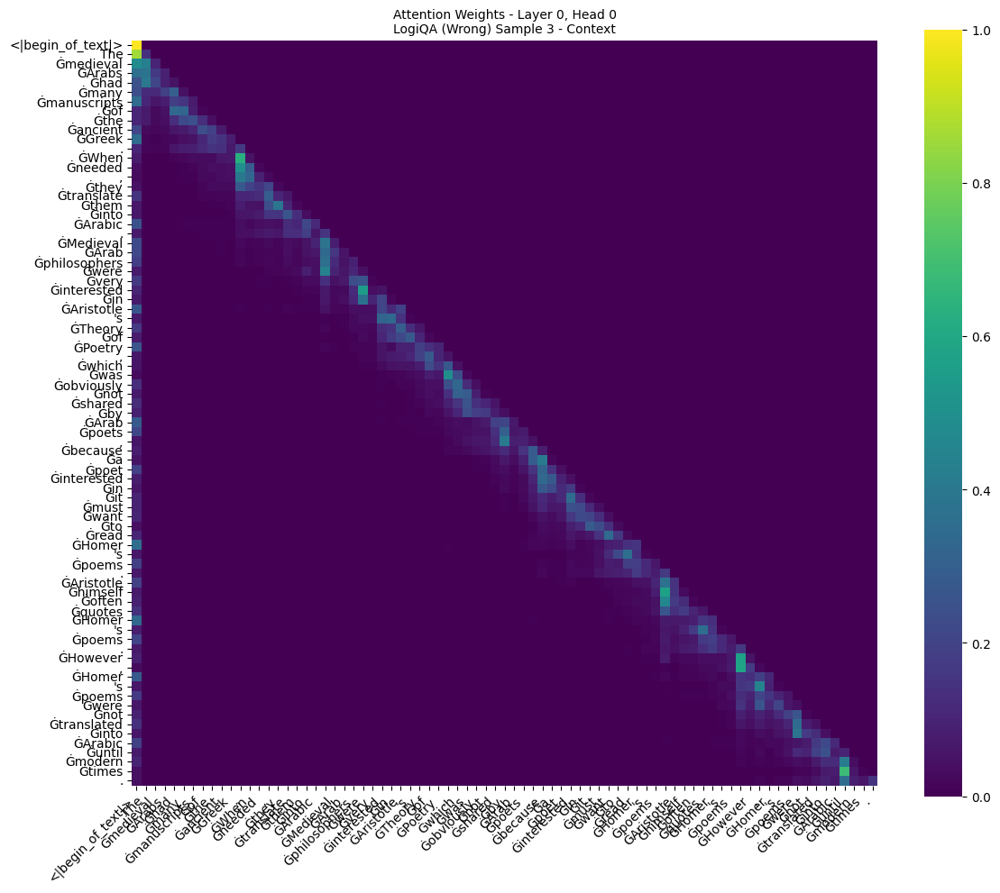

Predicted next word: '<|begin_of_text|>'

  Question: Which of the following options, if true, strongly supports the above argument?
  Options: ['Some medieval Arab translators have manuscripts of Homer poems in ancient Greek.', "Aristotle's Theory of Poetry is often quoted and commented by modern Arab poets.", "In Aristotle's Theory of Poetry, most of the content is related to drama, and medieval Arabs also wrote plays and performed them.", "A series of medieval Arab stories, such as Arab Night, are very similar to some parts of Homer's epic."]
  Correct Answer: Some medieval Arab translators have manuscripts of Homer poems in ancient Greek. (index 0)


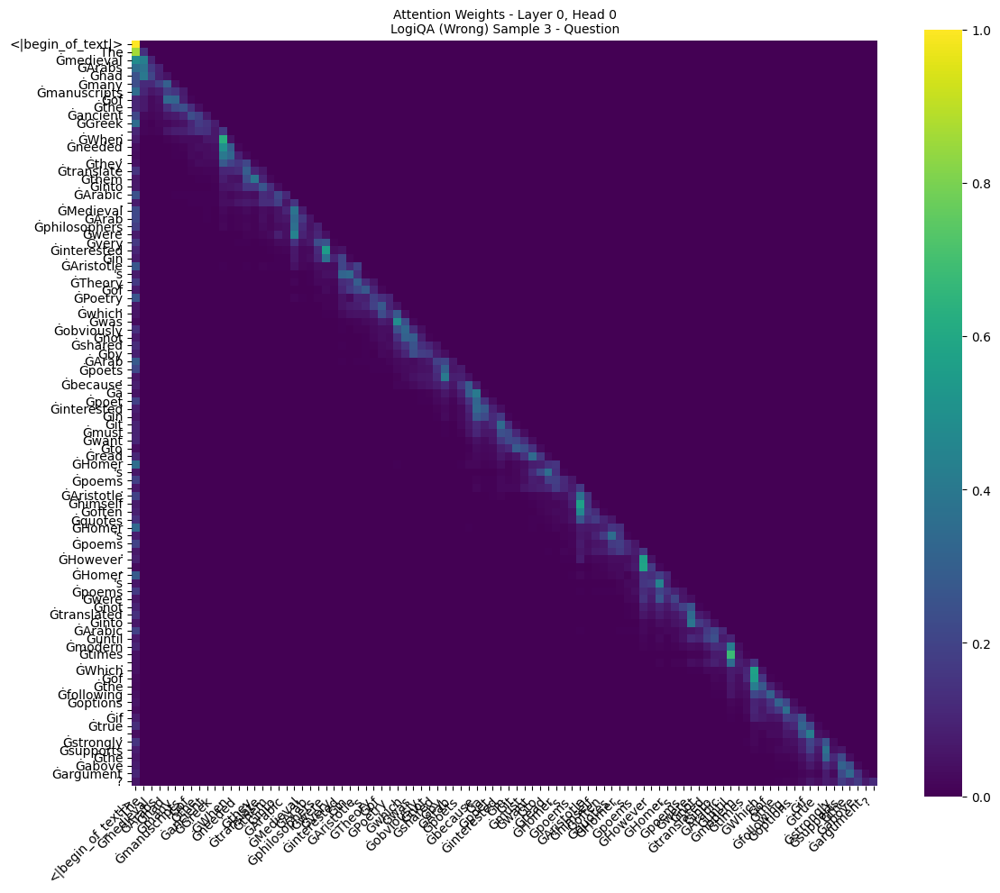

Predicted next word: '<|begin_of_text|>'
  Model's inferred next word: '<|begin_of_text|>'

Sample 4 Context: In the past five years, the percentage of money spent on discovering renewable yet expensive sources of energy has decreased. An increasing amount of money is being spent on developing nonrenewable resources, which are quite inexpensive to obtain. Regrettably, the nonrenewable resources have proven to be impracticable for daily use. Clearly, less money is being spent on practicable energy sources than was being spent five years ago.


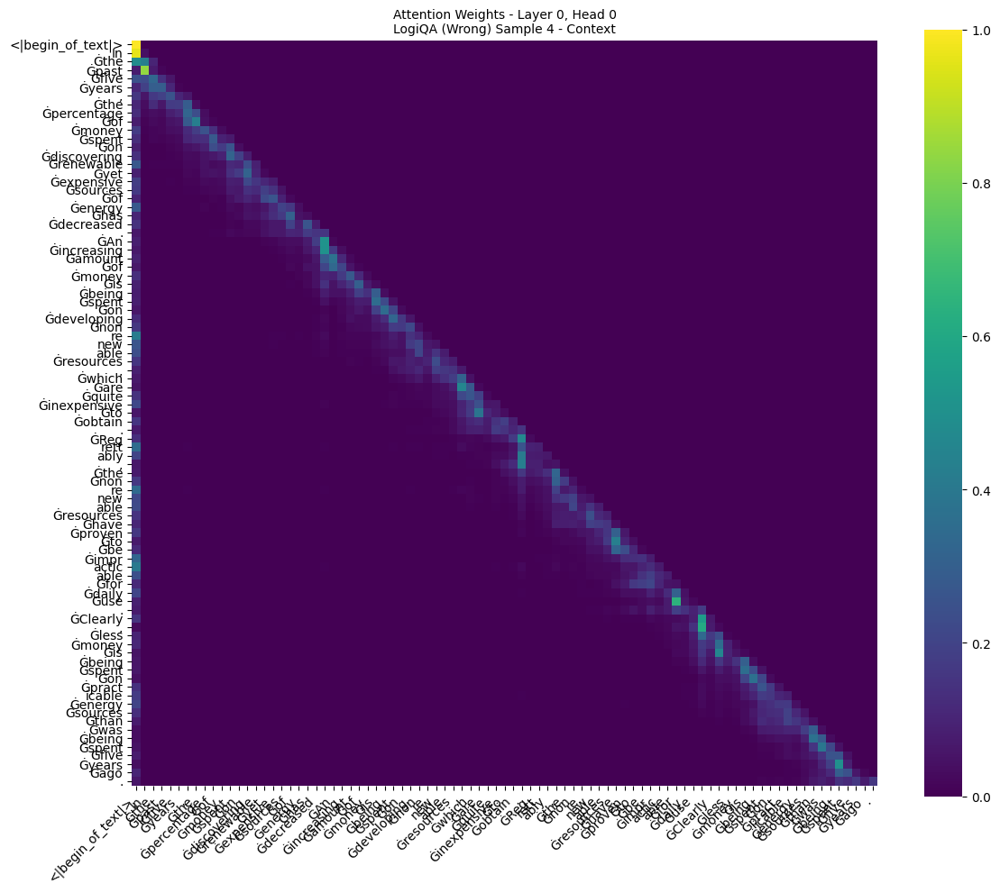

Predicted next word: '<|begin_of_text|>'

  Question: Which one of the following, if true, allows the conclusion above to be properly drawn?
  Options: ['Most of the money spent on developing renewable resources came from private donors.', 'The total investment in all energy resources is at an all time high.', 'The cost of nonrenewable resources is expected to rise in the next five years.', 'The total amount of money spent on developing energy resources has slowly declined over the past five years.']
  Correct Answer: The total investment in all energy resources is at an all time high. (index 1)


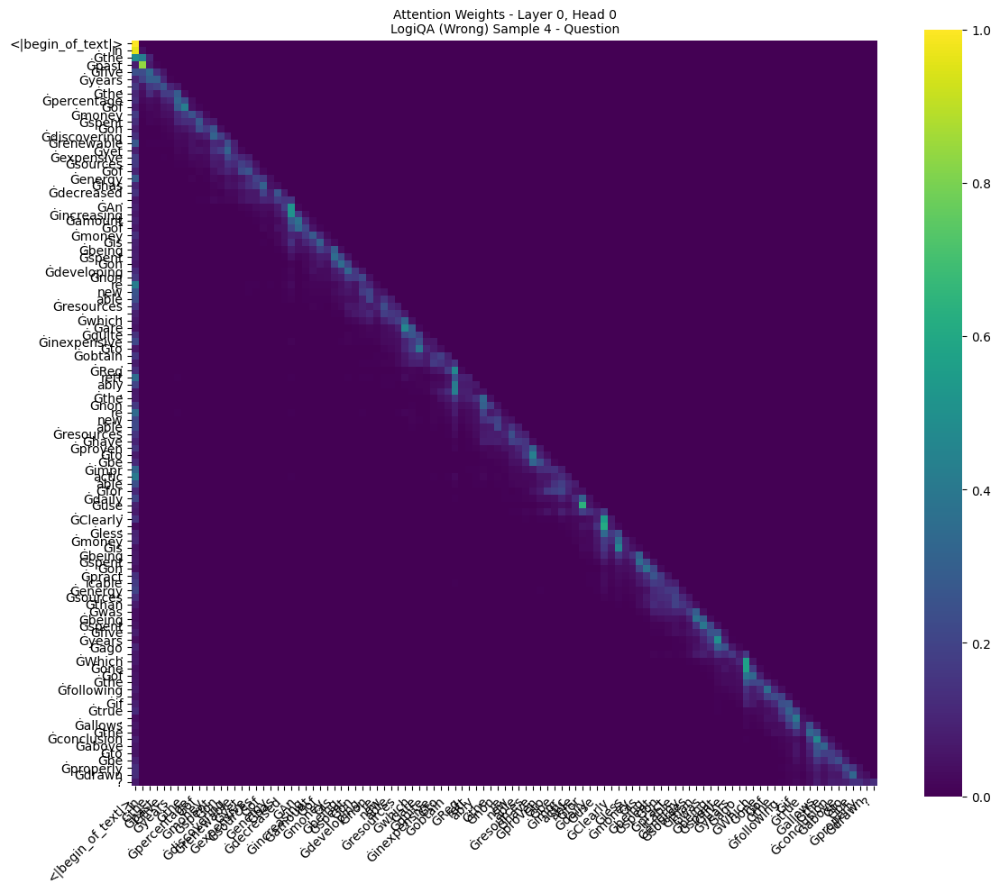

Predicted next word: '<|begin_of_text|>'
  Model's inferred next word: '<|begin_of_text|>'

Sample 5 Context: Mayor: Four years ago, when we reorganized the city police department in order to save money, critics claimed that the reorganization would make the police less responsive to citizens and would thus lead to more crime. The police have compiled theft statistics from the years following the reorganization that show that the critics were wrong. There was an overall decrease in reports of thefts of all kinds, including small thefts.


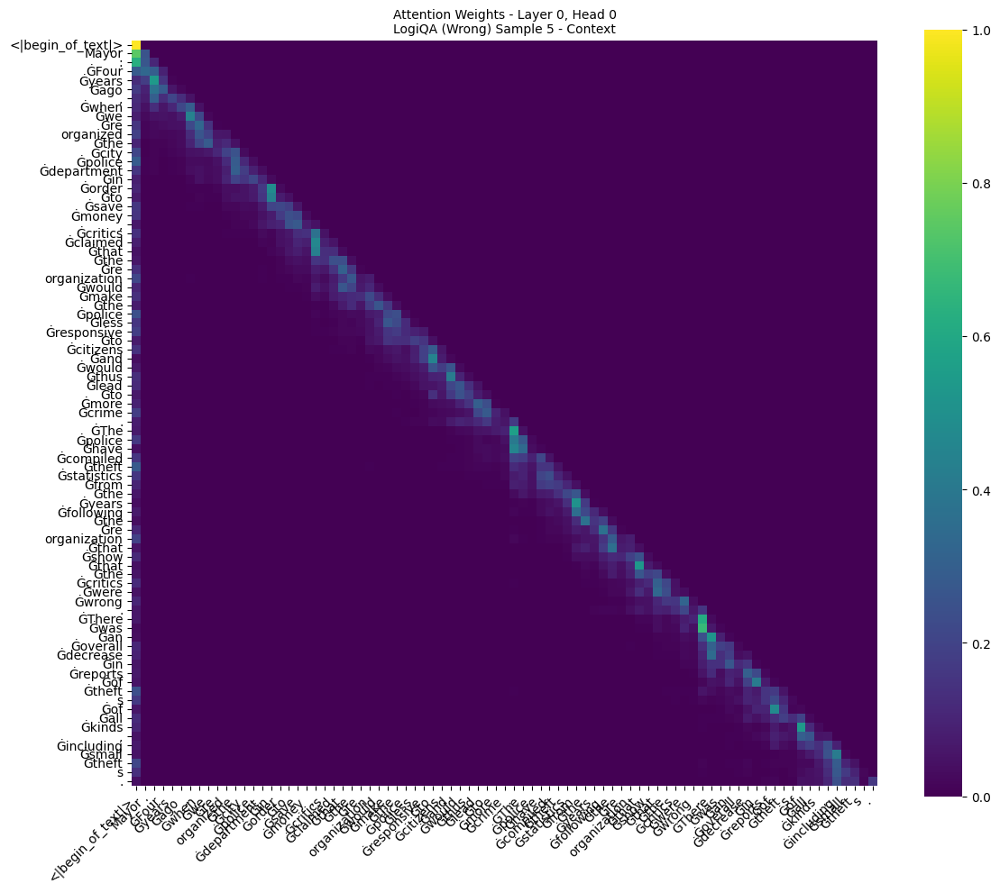

Predicted next word: '<|begin_of_text|>'

  Question: Which of the following, if true, most seriously challenges the mayor's argument?
  Options: ['In other cities where police departments have been similarly reorganized, the numbers of reported thefts have generally risen following reorganization.', 'When city police are perceived as unresponsive, victims of theft are less likely to report thefts to the police.', "The mayor's critics generally agree that police statistics concerning crime reports provide the most reliable available data on crime rates.", "The mayor's reorganization of the police department failed to save as much money as it was intended to save."]
  Correct Answer: In other cities where police departments have been similarly reorganized, the numbers of reported thefts have generally risen following reorganization. (index 0)


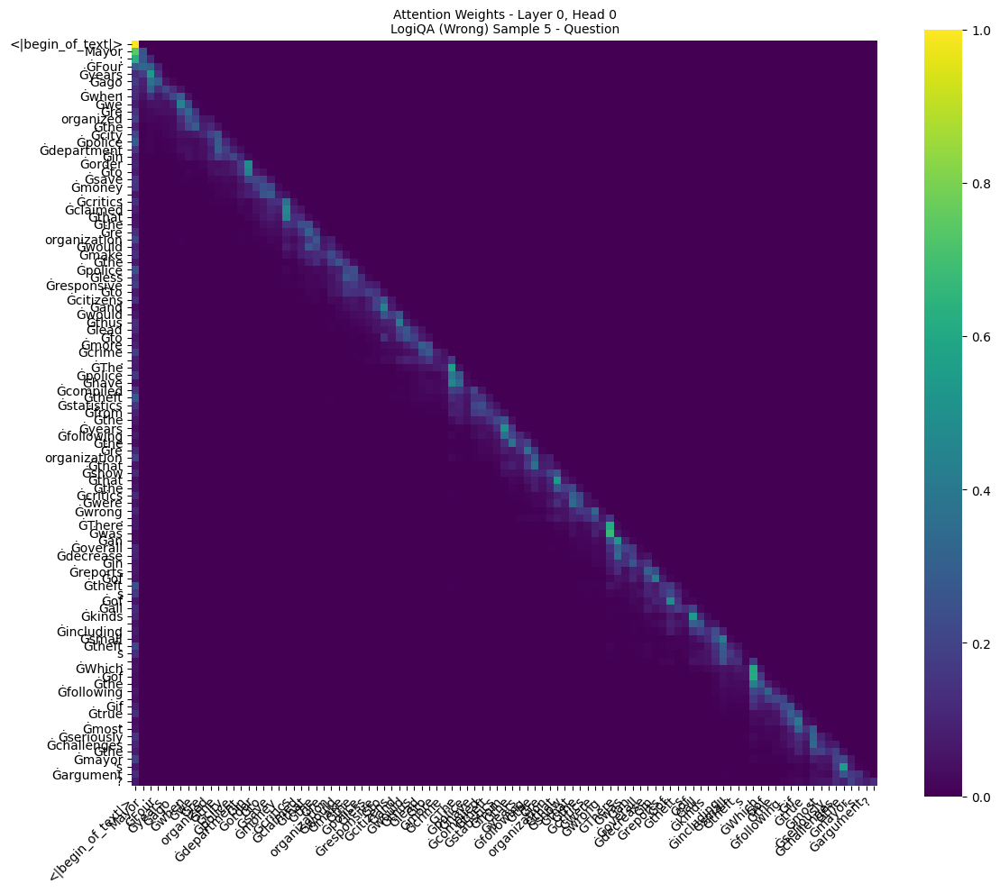

Predicted next word: '<|begin_of_text|>'
  Model's inferred next word: '<|begin_of_text|>'


In [13]:
process_samples(logiqa_data_wrong, "LogiQA (Wrong)")


Testing word inference on an incomplete logical statement:


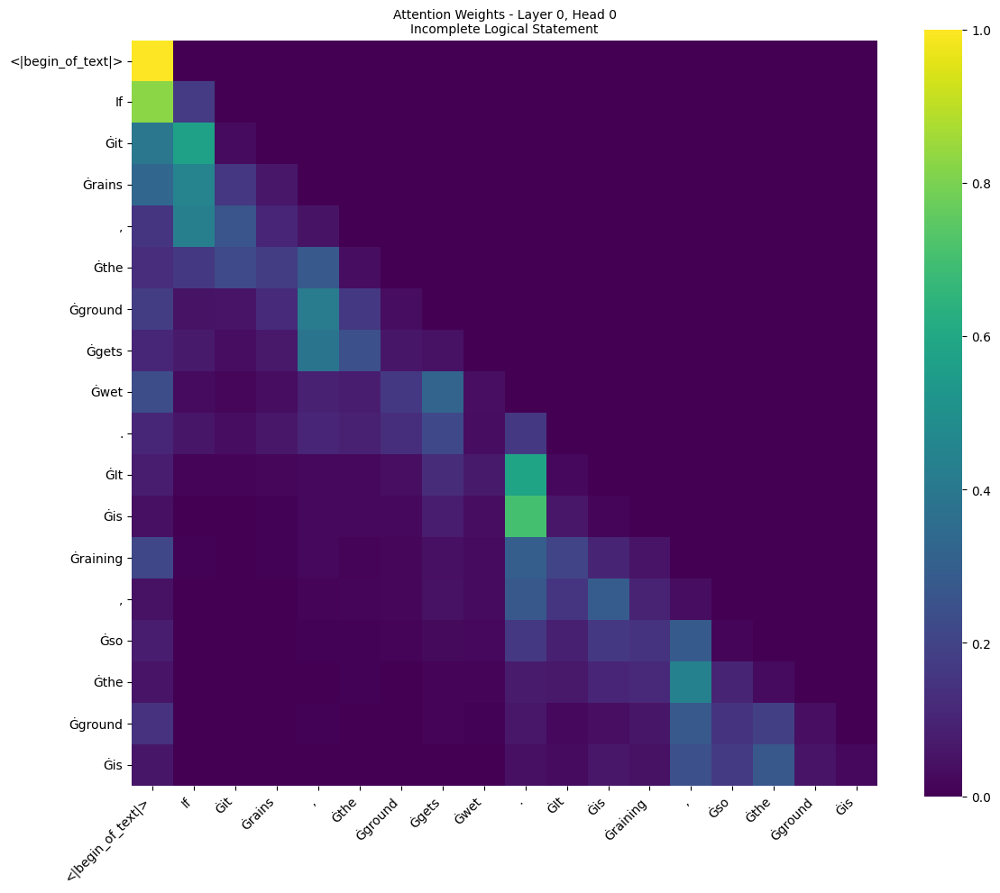

Predicted next word: '<|begin_of_text|>'


'<|begin_of_text|>'

In [14]:
# Example with incomplete sentence for word inference
print("\nTesting word inference on an incomplete logical statement:")
incomplete_text = "If it rains, the ground gets wet. It is raining, so the ground is"
visualize_attention(incomplete_text, title="Incomplete Logical Statement")